In [5]:
#CONDA ENV base_conda (python 3.9.7)
#Import packages
#---------------------------------------
import sys
import os
import glob
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np


#Import your modules
#---------------------------------------
import te_rna_f as ter
sys.path.insert(1, '/cndd3/dburrows/CODE/admin_tools/')
from admin_tools import admin_functions as adm

# Define paths
#----------------------------------------------------------------------
l_code = '/Users/dominicburrows/Dropbox/PhD/Analysis/my_scripts/GitHub/'
l_data = '/Users/dominicburrows/Dropbox/PhD/analysis/Project/'
l_fig = '/Users/dominicburrows/Dropbox/PhD/figures/'

s_code = '/cndd3/dburrows/CODE/'
s_data = '/cndd3/dburrows/DATA/'
s_fig = '/cndd3/dburrows/FIGS/'

%load_ext autoreload
sys.version

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


'3.9.7 | packaged by conda-forge | (default, Sep 29 2021, 19:23:11) \n[GCC 9.4.0]'

# Load metadata




In [68]:
# Metadata
meta = pd.read_csv('/cndd3/dburrows/DATA/te/metadata/PE/metadata_RNA_QC.tsv', index_col=0)
meta = meta[meta['RNA_passQC']]
ev_df = pd.read_csv('/cndd3/dburrows/DATA/te/annotations/rmsk/evolutionary_age.csv')

#Counts data
df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_CPM.csv', index_col=0)


In [69]:
#Filter low CPM data
thresh = 1 
ind = np.mean(df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]
#load in metadata
meta_ = meta

#load in metadata
meta_ = meta
INF = meta_[meta_['period'] == 'Infancy']# <2 infancy
ECH = meta_[meta_['period'] == 'Early_Childhood'] # 2-5 early childhood
LCH = meta_[meta_['period'] == 'Late_Childhood'] #5-12 late childhood
ADO = meta_[meta_['period'] == 'Adolescence'] #12-20 adolescence
ADU = meta_[meta_['period'] == 'Adulthood'] #20-50 adulthood
LADU = meta_[meta_['period'] == 'Late_Adulthood'] #50-80 late adulthood

# PE bulk data

In [83]:
#Load in PE data for each sample
mode='CPM'
ID_l = meta['sample'].values
parent_path = '/cndd/dburrows/DATA/te/rna/PE.counts/ATEM/'
te = ev_df['element'].values
dict = {'element':te}
for ID in ID_l:
    te_v = ter.load_ATEM_family(parent_path + '/Sample_' + ID + '/ATEM_counts.csv', te, mode)
    assert len(te) == len(te_v), 'Error: Not all TE elements were counted'
    #Add to dict
    dict[ID] = te_v
df = pd.DataFrame(dict)
#set first column to index
df.set_index('element', inplace=True)
#df = df.astype(int)

#write to csv
#df.to_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_' + mode + '.csv')

l1_ind = [x for x,i in enumerate(df.index) if 'L1' in i]#l1 ind
alu_ind = [x for x,i in enumerate(df.index) if 'Alu' in i]#alu ind
sva_ind = [x for x,i in enumerate(df.index) if 'SVA' in i]#sva ind

In [284]:
#Group by TET data
#====================================
mode='CPM'
ID_l = meta_['sample'].values
parent_path = '/cndd/dburrows/DATA/te/rna/PE.counts/TET/'
full_df = pd.DataFrame()
for ID in ID_l:
    ATEM_path = '/cndd/dburrows/DATA/te/rna/PE.counts/TET/Sample_' + ID + '/TEtranscripts_out.cntTable'
    count_mat = pd.read_csv(ATEM_path, sep="\t", header=0) 
    #normalise
    curr_ = count_mat.loc[np.asarray([x for x,i in enumerate(count_mat['gene/TE'].values) if 'L1' in i or 'Alu' in i or 'SVA' in i])]
    curr_['CPM'] = (curr_.iloc[:,1].values/ (sum(curr_.iloc[:,1].values)))*1e6
    curr_['Family'] = np.asarray([i.split(':')[1] for i in curr_['gene/TE'].values])
    curr_['Element'] = np.asarray([i.split(':')[0] for i in curr_['gene/TE'].values])
    curr_['Sample'] = np.full(len(curr_), ID)
    curr_['age'] = np.full(len(curr_), meta_[meta_['sample'] == ID]['age'].values[0])
    curr_['celltype'] = np.full(len(curr_), meta_[meta_['sample'] == ID]['celltype'].values[0])
    curr_['period'] = np.full(len(curr_), meta_[meta_['sample'] == ID]['period'].values[0])
    if ID == ID_l[0]: full_df = curr_
    else: full_df = pd.concat([full_df, curr_], axis=0)
full_df.reset_index()
full_df.to_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/TET_counts.csv')

In [ ]:
# Save count data across all donors as dataframe for DESEQ
meta = pd.read_csv('/datasets/Public_Datasets/Dracheva_PsychEncode_development/processed/metadata_RNA_QC.tsv.gz', sep='\t') 
meta = meta[meta['RNA_passQC']]
ev_df = pd.read_csv('/cndd3/dburrows/DATA/te/gtf/annotations/rmsk/evolutionary_age.csv')
guide_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_CPM.csv', index_col=0)

#Load in PE data for each sample
mode='Count'
ID_l = meta['sample'].values
parent_path = '/cndd/dburrows/DATA/te/rna/PE.counts/ATEM/'
te = ev_df['element'].values
dict = {'element':te}
for ID in ID_l:
    te_v = ter.load_ATEM_family(parent_path + '/Sample_' + ID + '/ATEM_counts.csv', te, mode)
    assert len(te) == len(te_v), 'Error: Not all TE elements were counted'
    #Add to dict
    dict[ID] = te_v
df = pd.DataFrame(dict)
#set first column to index
df.set_index('element', inplace=True)
df = df.astype(int)

#Filter based on low CPM data
thresh = 1 
ind = np.mean(guide_df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]

#write to csv
l1_df = sub_df[sub_df.index.str.contains('L1')]
alu_df = sub_df[sub_df.index.str.contains('Alu')]
sva_df = sub_df[sub_df.index.str.contains('SVA')]

coarse_df = pd.DataFrame()
coarse_df['L1'] = np.mean(l1_df,axis=0).astype(int)
coarse_df['Alu'] = np.mean(alu_df,axis=0).astype(int)
coarse_df['SVA'] = np.mean(sva_df,axis=0).astype(int)

coarse_df.T.to_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_coarse_sub-COUNT.csv')

In [66]:
# generate design matrix 
# only keep some columns in meta
dm = meta[['celltype', 'sex', 'age']]
age_ = dm['age'].values
new_age = (age_ - np.mean(age_))/np.std(age_)
dm['age'] = new_age
dm.index = meta['sample'].values
#dm.to_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_design.csv')

/tmp/ipykernel_1329011/3897204032.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dm['race'][dm['race'] !='White'] = 'Black'
/tmp/ipykernel_1329011/3897204032.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dm['AGEYEARS'] = new_age


In [89]:
# generate design matrix with categorical age
#load in metadata
meta = pd.read_csv('/cndd3/dburrows/DATA/te/metadata/PE/metadata_RNA_QC.tsv', index_col=0)
meta = meta[meta['RNA_passQC']]

# only keep some columns in meta
dm = meta[['celltype', 'sex', 'age', 'period']]
#dm['period'][dm['AGEYEARS'] < 3] = 'infancy'

dm.index = meta['sample'].values
dm.to_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_design_categorical.csv')

/tmp/ipykernel_1329011/2004765898.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dm['race'][dm['race'] !='White'] = 'Black'


In [6]:
#Generate dictionary of null distributions for all comparisons -> U statistics only
#=============
gene_mat = pd.read_csv('/datasets/Public_Datasets/Dracheva_PsychEncode_development/processed/rna_seq/allSamples_rsem_genes_results_TPM_mod.txt.gz', sep='\t', header=0, index_col=0)
#filter low tpm data
thresh = 1
ind = np.mean(gene_mat, axis=1) >thresh #indeces of ones to keep
sub_df = gene_mat.loc[ind]

#make into df with RNA, age, class, celltype
meta_ = meta[['celltype', 'sex', 'age', 'period']]
meta_['period'][meta_['age'] < 2] = 'Infancy'
curr_df = sub_df[meta['sample'].values]

group_df = {'period':[], 'celltype':[], 'Class':[], 'RNA':[]}

#make into df
group_df['RNA'] = np.ravel(curr_df)
group_df['Class'] = np.repeat(curr_df.index.values,len(curr_df.columns.values))
group_df['period'] = meta_['period'].tolist()*len(curr_df.index)
group_df['celltype'] = [i.split('_')[1] for i in curr_df.columns.values.tolist()*len(curr_df.index)]
group_df = pd.DataFrame(group_df)

class_l = group_df['Class'].unique()
cell_l = 'GLU', 'GABA'
period_l = 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'
comp_df = ter.inf_paired_comp(class_l, cell_l, period_l, group_df)
comp_df.to_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_null_test.csv', header=True, index=False)

<ipython-input-6-0f83102a6637>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_['period'][meta_['age'] < 2] = 'Infancy'
<ipython-input-6-0f83102a6637>:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_['period'][meta_['age'] < 2] = 'Infancy'


### RNA-age: family-level analysis 

In [42]:
df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_CPM.csv', index_col=0)
meta = pd.read_csv('/cndd3/dburrows/DATA/te/metadata/PE/metadata_RNA_QC.tsv', index_col=0)
meta = meta[meta['RNA_passQC']]

#Filter low CPM data
thresh = 1 
ind = np.mean(df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]
#load in metadata
meta_ = meta

#load in metadata
meta_ = meta
INF = meta_[meta_['period'] == 'Infancy']# <2 infancy
ECH = meta_[meta_['period'] == 'Early_Childhood'] # 2-5 early childhood
LCH = meta_[meta_['period'] == 'Late_Childhood'] #5-12 late childhood
ADO = meta_[meta_['period'] == 'Adolescence'] #12-20 adolescence
ADU = meta_[meta_['period'] == 'Adulthood'] #20-50 adulthood
LADU = meta_[meta_['period'] == 'Late_Adulthood'] #50-80 late adulthood

In [43]:
#make into df with RNA, age, class, celltype
curr_df = sub_df
meta = meta
mode = 'coarse'

meta_ = meta[['celltype', 'sex', 'age', 'period']]
meta_['period'][meta_['age'] < 2] = 'Infancy'

if mode == 'coarse':
    group_df = {'period':[], 'celltype':[], 'Class':[], 'RNA':[]}
    l1_v = [np.mean(curr_df.iloc[[x for x,i in enumerate(curr_df.index) if 'L1' in i]][i])for i in meta['sample'].values]
    alu_v = [np.mean(curr_df.iloc[[x for x,i in enumerate(curr_df.index) if 'Alu' in i]][i])for i in meta['sample'].values]
    sva_v = [np.mean(curr_df.iloc[[x for x,i in enumerate(curr_df.index) if 'SVA' in i]][i])for i in meta['sample'].values]
    #make into df
    group_df['RNA'] = l1_v + alu_v + sva_v
    group_df['Class'] = ['L1']*len(l1_v) + ['Alu']*len(alu_v) + ['SVA']*len(sva_v)
    group_df['period'] = np.append(meta_['period'].values, np.append(meta_['period'].values, meta_['period'].values))
    group_df['celltype'] = np.append(meta_['celltype'].values, np.append(meta_['celltype'].values, meta_['celltype'].values))
    group_df = pd.DataFrame(group_df)
group_df

/tmp/ipykernel_413969/2329280918.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_['period'][meta_['age'] < 2] = 'Infancy'
/tmp/ipykernel_413969/2329280918.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  meta_['period'][meta_['age'] < 2] = 'Infancy'


,period,celltype,Class,RNA
0,Adolescence,GABA,L1,2.800439
1,Adolescence,GLU,L1,2.942757
2,Adulthood,GABA,L1,4.283278
3,Adulthood,GLU,L1,4.747331
4,Adulthood,GABA,L1,3.776852
...,...,...,...,...
331,Early_Childhood,GLU,SVA,2.837427
332,Late_Adulthood,GABA,SVA,5.064952
333,Late_Adulthood,GLU,SVA,5.552370
334,Adulthood,GABA,SVA,5.029634


In [45]:
class_l = 'L1', 'Alu', 'SVA'
cell_l = 'GLU', 'GABA'
period_l = 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'

comp_df = ter.inf_paired_comp(class_l, cell_l, period_l, group_df,'coarse')
sig_df = comp_df[comp_df['padj_sig']==True]
sig_df

,celltype,Class,Comparison,p value,padj_sig,statistic
3,GLU,L1,infancy_Adulthood,0.001757,True,-3.636235
4,GLU,L1,infancy_Late_Adulthood,0.005379,True,-3.334434
5,GABA,L1,infancy_Early_Childhood,0.004720,True,-3.529399
7,GABA,L1,infancy_Adolescence,0.009078,True,-3.062562
8,GABA,L1,infancy_Adulthood,0.004006,True,-3.357157
9,GABA,L1,infancy_Late_Adulthood,0.000283,True,-4.914362
17,GABA,Alu,infancy_Adolescence,0.008339,True,-3.106647
18,GABA,Alu,infancy_Adulthood,0.005384,True,-3.216854
19,GABA,Alu,infancy_Late_Adulthood,0.000506,True,-4.591116
29,GABA,SVA,infancy_Late_Adulthood,0.002048,True,-3.839367


/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:3002: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


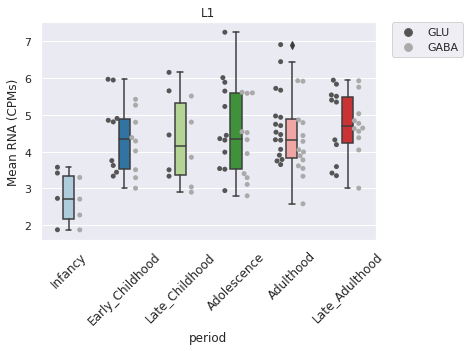

In [46]:
mod='L1'
plot_df = group_df[group_df['Class'] == mod]

#visualise each group with box plot seaborn
import seaborn as sns
sns.set_theme(style="darkgrid")
#sns.violinplot(data=plot_df, x="period", y="RNA", hue="Cell Type", split=True, hue_order=['GLU', 'GABA'], order=['infancy', 'earlychildhood', 'latechildhood', 'adolescence', 'adulthood', 'lateadulthood'], palette="Set1")
#show box plot
sns.boxplot(data=plot_df,x="period", y="RNA", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
sns.swarmplot(data=plot_df, x="period", y="RNA", hue="celltype", split=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
#move legend off plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=12)
plt.ylabel('Mean RNA (CPMs)', fontsize=12)
plt.title(mod)
#plt.savefig(s_fig + 'RNA_alu_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()

/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:3002: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


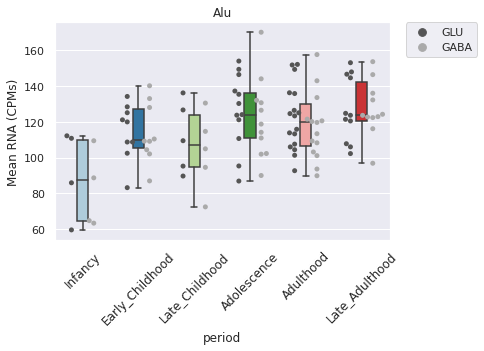

In [47]:
mod='Alu'
plot_df = group_df[group_df['Class'] == mod]

#visualise each group with box plot seaborn
import seaborn as sns
sns.set_theme(style="darkgrid")
#sns.violinplot(data=plot_df, x="period", y="RNA", hue="Cell Type", split=True, hue_order=['GLU', 'GABA'], order=['infancy', 'earlychildhood', 'latechildhood', 'adolescence', 'adulthood', 'lateadulthood'], palette="Set1")
#show box plot
sns.boxplot(data=plot_df,x="period", y="RNA", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
sns.swarmplot(data=plot_df, x="period", y="RNA", hue="celltype", split=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
#move legend off plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=12)
plt.ylabel('Mean RNA (CPMs)', fontsize=12)
plt.title(mod)
#plt.savefig(s_fig + 'RNA_alu_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()

/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:3002: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


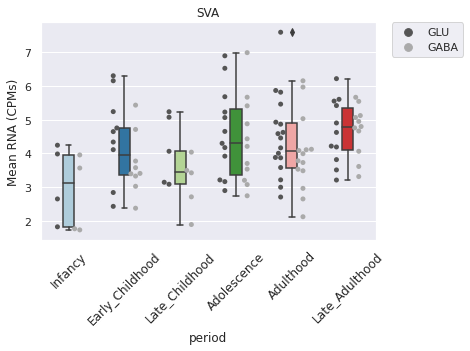

In [48]:
mod='SVA'
plot_df = group_df[group_df['Class'] == mod]

#visualise each group with box plot seaborn
import seaborn as sns
sns.set_theme(style="darkgrid")
#sns.violinplot(data=plot_df, x="period", y="RNA", hue="Cell Type", split=True, hue_order=['GLU', 'GABA'], order=['infancy', 'earlychildhood', 'latechildhood', 'adolescence', 'adulthood', 'lateadulthood'], palette="Set1")
#show box plot
sns.boxplot(data=plot_df,x="period", y="RNA", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
sns.swarmplot(data=plot_df, x="period", y="RNA", hue="celltype", split=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
#move legend off plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=12)
plt.ylabel('Mean RNA (CPMs)', fontsize=12)
plt.title(mod)
#plt.savefig(s_fig + 'RNA_alu_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()

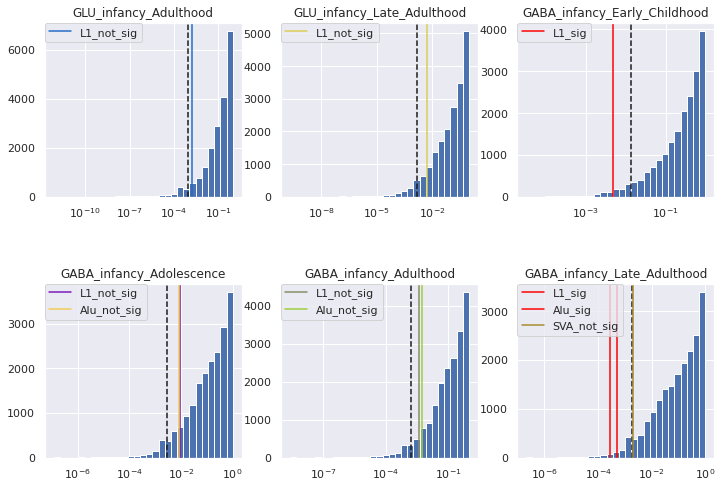

,index,celltype,Class,Comparison,p value,padj_sig,statistic,comb,baseline_sig
0,3,GLU,L1,infancy_Adulthood,0.001757,True,-3.636235,GLU_infancy_Adulthood,not_sig
0,4,GLU,L1,infancy_Late_Adulthood,0.005379,True,-3.334434,GLU_infancy_Late_Adulthood,not_sig
0,5,GABA,L1,infancy_Early_Childhood,0.004720,True,-3.529399,GABA_infancy_Early_Childhood,sig
0,7,GABA,L1,infancy_Adolescence,0.009078,True,-3.062562,GABA_infancy_Adolescence,not_sig
1,17,GABA,Alu,infancy_Adolescence,0.008339,True,-3.106647,GABA_infancy_Adolescence,not_sig
0,8,GABA,L1,infancy_Adulthood,0.004006,True,-3.357157,GABA_infancy_Adulthood,not_sig
1,18,GABA,Alu,infancy_Adulthood,0.005384,True,-3.216854,GABA_infancy_Adulthood,not_sig
0,9,GABA,L1,infancy_Late_Adulthood,0.000283,True,-4.914362,GABA_infancy_Late_Adulthood,sig
1,19,GABA,Alu,infancy_Late_Adulthood,0.000506,True,-4.591116,GABA_infancy_Late_Adulthood,sig
2,29,GABA,SVA,infancy_Late_Adulthood,0.002048,True,-3.839367,GABA_infancy_Late_Adulthood,not_sig


In [49]:
#Null model -> compare p values
#---------------------------------------
null_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_null_test.csv')
final_df = ter.plot_null(null_df, sig_df, 12, 8)
final_df

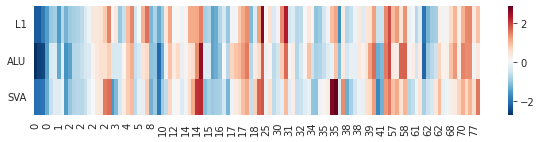

In [174]:
import seaborn as sns
#group for heatmap - GABA
data_l = l1_, alu_, sva_

name_l = ['L1', 'ALU', 'SVA']
heatm = np.zeros(((len(data_l),len(data_l[0][0]))))
for x,d in enumerate(data_l):
    curr = adm.sort_2list(d[1], d[0])
    z  = (curr[1] - np.mean(curr[1])) / (np.std(curr[1]))
    heatm[x,:] = z 

fig, ax = plt.subplots(figsize=(10,2))
sns.heatmap(heatm, cmap='RdBu_r', ax=ax)
ax.set_yticklabels(['L1', 'ALU', 'SVA'], rotation=0)
ax.set_xticklabels(curr[0][ 0::3])
#ax.set_title('LINE')
#ax.set_ylabel('Cell Type')
#plt.savefig('TE_heatmap.svg', dpi=300, bbox_inches='tight', pad_inches=0, transparent=True)
plt.show()

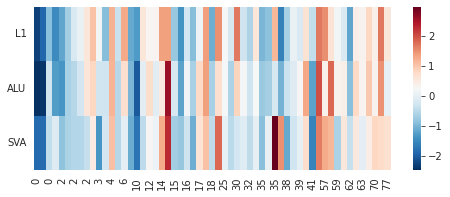

In [176]:
#group for heatmap - GABA
data_l = l1_gaba, alu_gaba, sva_gaba

name_l = ['L1', 'ALU', 'SVA']
heatm = np.zeros(((len(data_l),len(data_l[0][0]))))
for x,d in enumerate(data_l):
    curr = adm.sort_2list(d[1], d[0])
    z  = (curr[1] - np.mean(curr[1])) / (np.std(curr[1]))
    heatm[x,:] = z 

fig, ax = plt.subplots(figsize=(8,3))
sns.heatmap(heatm, cmap='RdBu_r', ax=ax)
ax.set_yticklabels(['L1', 'ALU', 'SVA'], rotation=0)
ax.set_xticklabels(curr[0][ 0::2])
#ax.set_title('LINE')
#ax.set_ylabel('Cell Type')
plt.show()

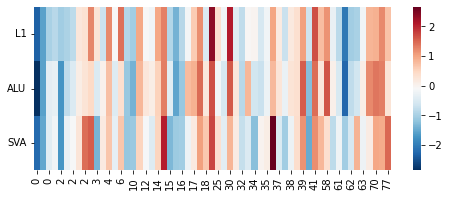

In [157]:
#group for heatmap - GLU
data_l = l1_glu, alu_glu, sva_glu

name_l = ['L1', 'ALU', 'SVA']
heatm = np.zeros(((len(data_l),len(data_l[0][0]))))
for x,d in enumerate(data_l):
    curr = adm.sort_2list(d[1], d[0])
    z  = (curr[1] - np.mean(curr[1])) / (np.std(curr[1]))
    heatm[x,:] = z 

fig, ax = plt.subplots(figsize=(8,3))
sns.heatmap(heatm, cmap='RdBu_r', ax=ax)
ax.set_yticklabels(['L1', 'ALU', 'SVA'], rotation=0)
ax.set_xticklabels(curr[0][ 0::2])
#ax.set_title('LINE')
#ax.set_ylabel('Cell Type')
plt.show()

In [302]:
#TET all RNA - passive and active
full_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/TET_counts.csv', index_col=0)
full_df

,gene/TE,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_1105_GABA/Aligned.sortedByCoord.out.bam,CPM,Family,Element,Sample,age,celltype,period,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_1105_GLU/Aligned.sortedByCoord.out.bam,...,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT15HBMA007_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT15HBNA032_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT16HCQA020_GABA/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT16HCQA020_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT17HEIA010_GABA/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT17HEIA010_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCTYPA008_GABA/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCTYPA008_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCTZZNA014_GABA/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCTZZNA014_GLU/Aligned.sortedByCoord.out.bam
60656,Alu:Alu:SINE,5542.0,597.596760,Alu,Alu,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60657,AluJb:Alu:SINE,519580.0,56026.583243,Alu,AluJb,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60658,AluJo:Alu:SINE,302991.0,32671.678054,Alu,AluJo,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60659,AluJr4:Alu:SINE,83062.0,8956.618918,Alu,AluJr4,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60660,AluJr:Alu:SINE,349730.0,37711.568878,Alu,AluJr,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61665,SVA_C:SVA:Retroposon,NaN,219.630717,SVA,SVA_C,HCTZZNA014_GLU,39.19,GLU,Adulthood,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2665.0
61666,SVA_D:SVA:Retroposon,NaN,1372.588966,SVA,SVA_D,HCTZZNA014_GLU,39.19,GLU,Adulthood,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16655.0
61667,SVA_E:SVA:Retroposon,NaN,205.043611,SVA,SVA_E,HCTZZNA014_GLU,39.19,GLU,Adulthood,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2488.0
61668,SVA_F:SVA:Retroposon,NaN,399.043877,SVA,SVA_F,HCTZZNA014_GLU,39.19,GLU,Adulthood,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4842.0


/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:3002: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


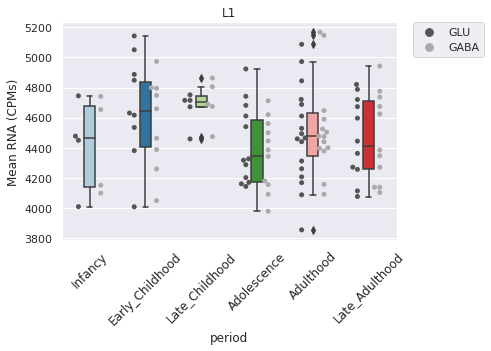

In [303]:
mod='L1'
group_df = full_df
plot_df = group_df[group_df['Family'] == mod]
plot_df = plot_df.groupby(['Sample', 'period', 'celltype']).mean()
plot_df.reset_index(inplace=True)

#visualise each group with box plot seaborn
import seaborn as sns
sns.set_theme(style="darkgrid")
#sns.violinplot(data=plot_df, x="period", y="RNA", hue="Cell Type", split=True, hue_order=['GLU', 'GABA'], order=['infancy', 'earlychildhood', 'latechildhood', 'adolescence', 'adulthood', 'lateadulthood'], palette="Set1")
#show box plot
sns.boxplot(data=plot_df,x="period", y="CPM", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
sns.swarmplot(data=plot_df, x="period", y="CPM", hue="celltype", split=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
#move legend off plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=12)
plt.ylabel('Mean RNA (CPMs)', fontsize=12)
plt.title(mod)
#plt.savefig(s_fig + 'RNA_alu_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()

/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:3002: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


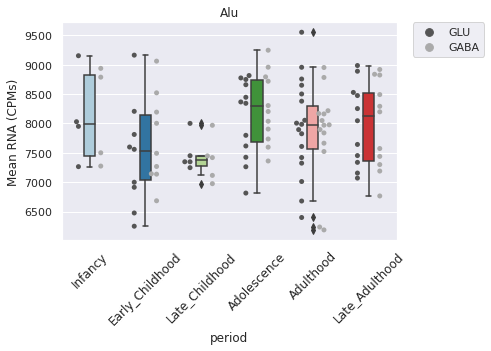

In [304]:
mod='Alu'
group_df = full_df
plot_df = group_df[group_df['Family'] == mod]
plot_df = plot_df.groupby(['Sample', 'period', 'celltype']).mean()
plot_df.reset_index(inplace=True)

#visualise each group with box plot seaborn
import seaborn as sns
sns.set_theme(style="darkgrid")
#sns.violinplot(data=plot_df, x="period", y="RNA", hue="Cell Type", split=True, hue_order=['GLU', 'GABA'], order=['infancy', 'earlychildhood', 'latechildhood', 'adolescence', 'adulthood', 'lateadulthood'], palette="Set1")
#show box plot
sns.boxplot(data=plot_df,x="period", y="CPM", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
sns.swarmplot(data=plot_df, x="period", y="CPM", hue="celltype", split=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
#move legend off plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=12)
plt.ylabel('Mean RNA (CPMs)', fontsize=12)
plt.title(mod)
#plt.savefig(s_fig + 'RNA_alu_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()

/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:3002: UserWarning: The `split` parameter has been renamed to `dodge`.
  warnings.warn(msg, UserWarning)


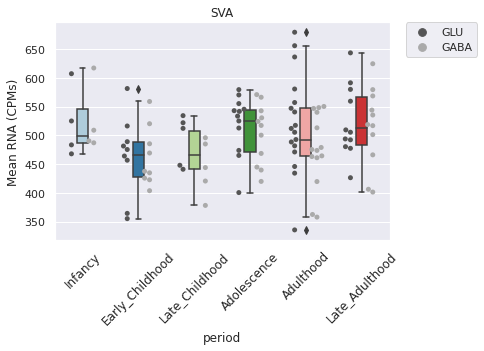

In [309]:
mod='SVA'
group_df = full_df
plot_df = group_df[group_df['Family'] == mod]
plot_df = plot_df.groupby(['Sample', 'period', 'celltype']).mean()
plot_df.reset_index(inplace=True)

#visualise each group with box plot seaborn
import seaborn as sns
sns.set_theme(style="darkgrid")
#sns.violinplot(data=plot_df, x="period", y="RNA", hue="Cell Type", split=True, hue_order=['GLU', 'GABA'], order=['infancy', 'earlychildhood', 'latechildhood', 'adolescence', 'adulthood', 'lateadulthood'], palette="Set1")
#show box plot
sns.boxplot(data=plot_df,x="period", y="CPM", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
sns.swarmplot(data=plot_df, x="period", y="CPM", hue="celltype", split=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
#move legend off plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=12)
plt.ylabel('Mean RNA (CPMs)', fontsize=12)
plt.title(mod)
#plt.savefig(s_fig + 'RNA_alu_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()

### RNA-age: element-level analysis

In [331]:
df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_CPM.csv', index_col=0)
meta = pd.read_csv('/cndd3/dburrows/DATA/te/metadata/PE/metadata_RNA_QC.tsv', index_col=0)
meta = meta[meta['RNA_passQC']]

#Filter low CPM data
thresh = 1 
ind = np.mean(df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]

#load in metadata
meta_ = meta
INF = meta_[meta_['period'] == 'Infancy']# <2 infancy
ECH = meta_[meta_['period'] == 'Early_Childhood'] # 2-5 early childhood
LCH = meta_[meta_['period'] == 'Late_Childhood'] #5-12 late childhood
ADO = meta_[meta_['period'] == 'Adolescence'] #12-20 adolescence
ADU = meta_[meta_['period'] == 'Adulthood'] #20-50 adulthood
LADU = meta_[meta_['period'] == 'Late_Adulthood'] #50-80 late adulthood

In [332]:
#make into df with RNA, age, class, celltype
curr_df = sub_df
meta = meta
mode = 'granular'
meta_ = meta[['celltype', 'sex', 'age', 'period']]
meta_['period'][meta_['age'] < 2] = 'Infancy'
if mode == 'granular':
    group_df = {'period':[], 'celltype':[], 'Class':[], 'Element':[], 'RNA':[]}
    l1_ind = [x for x,i in enumerate(curr_df.index) if 'L1' in i]#l1 ind
    alu_ind = [x for x,i in enumerate(curr_df.index) if 'Alu' in i]#alu ind
    sva_ind = [x for x,i in enumerate(curr_df.index) if 'SVA' in i]#sva ind

    l1_v = np.ravel([curr_df.iloc[l1_ind][i].values for i in meta['sample'].values])
    alu_v = np.ravel([curr_df.iloc[alu_ind][i].values for i in meta['sample'].values])
    sva_v = np.ravel([curr_df.iloc[sva_ind][i].values for i in meta['sample'].values])
    #make into df
    group_df['RNA'] = np.append(l1_v, np.append(alu_v, sva_v))
    group_df['Class'] = np.append(np.tile(curr_df.iloc[l1_ind].index.values, curr_df.shape[1]), 
                                  np.append(np.tile(curr_df.iloc[alu_ind].index.values,curr_df.shape[1]), np.tile(curr_df.iloc[sva_ind].index.values, curr_df.shape[1])))
    group_df['period'] = np.append(np.repeat(meta_['period'], len(l1_ind)).values,
                                  np.append(np.repeat(meta_['period'], len(alu_ind)).values, np.repeat(meta_['period'], len(sva_ind)).values))
    group_df['celltype'] = np.append(np.repeat(meta_['celltype'], len(l1_ind)).values,
                                  np.append(np.repeat(meta_['celltype'], len(alu_ind)).values, np.repeat(meta_['celltype'], len(sva_ind)).values))
    group_df['Element'] = np.append(np.repeat('L1', len(l1_v)),
                                  np.append(np.repeat('Alu', len(alu_v)), np.repeat('SVA', len(sva_v))))
    group_df = pd.DataFrame(group_df)
group_df

,period,celltype,Class,Element,RNA
0,Adolescence,GABA,L1PA6,L1,2.235117
1,Adolescence,GABA,L1PA4,L1,4.696105
2,Adolescence,GABA,L1PA7,L1,3.738547
3,Adolescence,GABA,L1PA2,L1,2.440826
4,Adolescence,GABA,L1PA5,L1,4.840751
...,...,...,...,...,...
6155,Adulthood,GLU,SVA_F,SVA,6.414233
6156,Adulthood,GLU,SVA_B,SVA,3.921906
6157,Adulthood,GLU,SVA_E,SVA,2.727751
6158,Adulthood,GLU,SVA_C,SVA,4.292978


In [312]:
element = 'L1'
class_l = group_df[group_df['Element'] == element]['Class'].unique()
cell_l = 'GLU', 'GABA'
period_l = 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'
sub_df = group_df[group_df['Element'] == element]

comp_df = ter.inf_paired_comp(class_l, cell_l, period_l, sub_df, 'granular')
sig_df = comp_df[comp_df['padj_sig']==True]
sig_df

,celltype,Class,Comparison,p value,padj_sig,statistic
19,GABA,L1PA4,infancy_Late_Adulthood,0.000735,True,-4.387085
33,GLU,L1PA2,infancy_Adulthood,0.000334,True,0.000000
39,GABA,L1PA2,infancy_Late_Adulthood,0.000224,True,-5.047268
49,GABA,L1PA5,infancy_Late_Adulthood,0.000395,True,-4.727625
83,GLU,L1PA3,infancy_Adulthood,0.000334,True,0.000000
93,GLU,L1HS,infancy_Adulthood,0.000275,True,-4.448797
95,GABA,L1HS,infancy_Early_Childhood,0.000413,True,-4.984170
98,GABA,L1HS,infancy_Adulthood,0.000502,True,-4.344797


/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 9.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 11.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


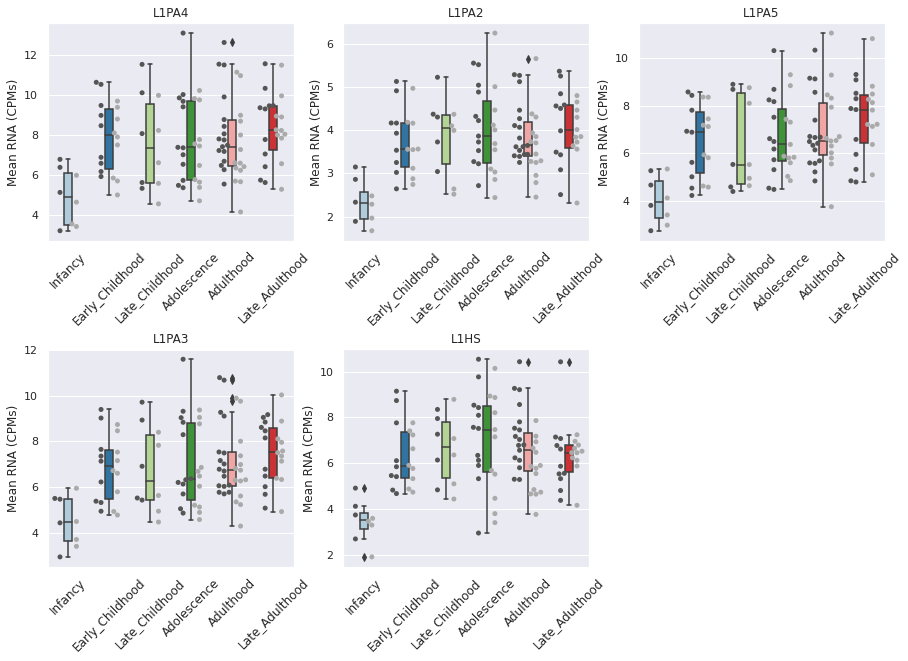

In [313]:
plot_l = sig_df['Class'].unique()
import seaborn as sns
import math
sns.set_theme(style="darkgrid")

fig, axs = plt.subplots(figsize=(15,10))
plt.subplots_adjust(hspace=0.5)
for x,p in enumerate(plot_l):
    ax = plt.subplot(int(math.ceil(len(plot_l)/3)), 3, x + 1)

    plot_df = group_df[group_df['Class'] == p]
    sns.boxplot(data=plot_df,x="period", y="RNA", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
    sns.swarmplot(data=plot_df, x="period", y="RNA", hue="celltype", dodge=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
    #remove legend
    ax.get_legend().remove()
    #rotate x ticks
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=12)
    #set title
    ax.set_title(p, fontsize=12)
    #change y label
    ax.set_ylabel('Mean RNA (CPMs)', fontsize=12)
    #remove x label
    ax.set_xlabel('')
    #remove x tick labels
    #if x == 0 or x == 1 or x == 2: ax.set_xticklabels([])
#plt.savefig(s_fig + 'RNA_l1_multi_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()


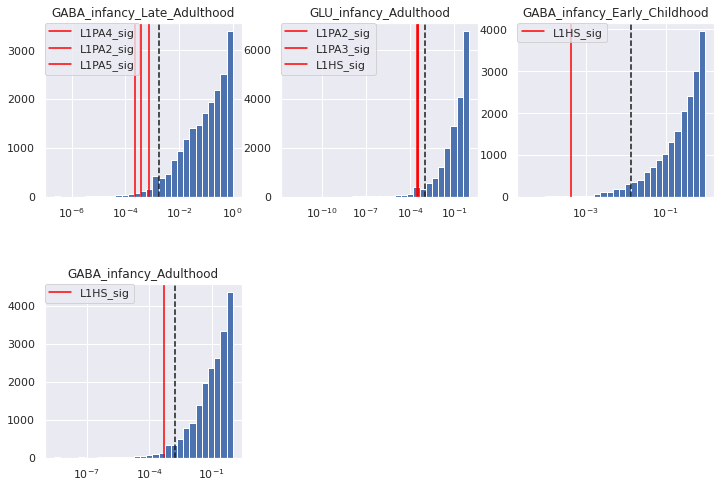

,index,celltype,Class,Comparison,p value,padj_sig,statistic,comb,baseline_sig
0,19,GABA,L1PA4,infancy_Late_Adulthood,0.000735,True,-4.387085,GABA_infancy_Late_Adulthood,sig
1,39,GABA,L1PA2,infancy_Late_Adulthood,0.000224,True,-5.047268,GABA_infancy_Late_Adulthood,sig
2,49,GABA,L1PA5,infancy_Late_Adulthood,0.000395,True,-4.727625,GABA_infancy_Late_Adulthood,sig
0,33,GLU,L1PA2,infancy_Adulthood,0.000334,True,0.000000,GLU_infancy_Adulthood,sig
1,83,GLU,L1PA3,infancy_Adulthood,0.000334,True,0.000000,GLU_infancy_Adulthood,sig
2,93,GLU,L1HS,infancy_Adulthood,0.000275,True,-4.448797,GLU_infancy_Adulthood,sig
0,95,GABA,L1HS,infancy_Early_Childhood,0.000413,True,-4.984170,GABA_infancy_Early_Childhood,sig
0,98,GABA,L1HS,infancy_Adulthood,0.000502,True,-4.344797,GABA_infancy_Adulthood,sig


In [314]:
#Null model -> compare p values
#---------------------------------------
null_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_null_test.csv')
final_df = ter.plot_null(null_df, sig_df, 12, 8)
final_df

In [319]:
sig_df = final_df[final_df['baseline_sig'] == 'sig']
sig_df

,index,celltype,Class,Comparison,p value,padj_sig,statistic,comb,baseline_sig
0,19,GABA,L1PA4,infancy_Late_Adulthood,0.000735,True,-4.387085,GABA_infancy_Late_Adulthood,sig
1,39,GABA,L1PA2,infancy_Late_Adulthood,0.000224,True,-5.047268,GABA_infancy_Late_Adulthood,sig
2,49,GABA,L1PA5,infancy_Late_Adulthood,0.000395,True,-4.727625,GABA_infancy_Late_Adulthood,sig
0,33,GLU,L1PA2,infancy_Adulthood,0.000334,True,0.000000,GLU_infancy_Adulthood,sig
1,83,GLU,L1PA3,infancy_Adulthood,0.000334,True,0.000000,GLU_infancy_Adulthood,sig
2,93,GLU,L1HS,infancy_Adulthood,0.000275,True,-4.448797,GLU_infancy_Adulthood,sig
0,95,GABA,L1HS,infancy_Early_Childhood,0.000413,True,-4.984170,GABA_infancy_Early_Childhood,sig
0,98,GABA,L1HS,infancy_Adulthood,0.000502,True,-4.344797,GABA_infancy_Adulthood,sig


In [322]:
full_df

,gene/TE,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_1105_GABA/Aligned.sortedByCoord.out.bam,CPM,Family,Element,Sample,age,celltype,period,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_1105_GLU/Aligned.sortedByCoord.out.bam,...,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT15HBMA007_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT15HBNA032_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT16HCQA020_GABA/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT16HCQA020_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT17HEIA010_GABA/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCT17HEIA010_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCTYPA008_GABA/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCTYPA008_GLU/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCTZZNA014_GABA/Aligned.sortedByCoord.out.bam,/cndd3/dburrows/DATA/te/rna/PE.bam/Sample_HCTZZNA014_GLU/Aligned.sortedByCoord.out.bam
60656,Alu:Alu:SINE,5542.0,597.596760,Alu,Alu,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60657,AluJb:Alu:SINE,519580.0,56026.583243,Alu,AluJb,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60658,AluJo:Alu:SINE,302991.0,32671.678054,Alu,AluJo,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60659,AluJr4:Alu:SINE,83062.0,8956.618918,Alu,AluJr4,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
60660,AluJr:Alu:SINE,349730.0,37711.568878,Alu,AluJr,1105_GABA,16.93,GABA,Adolescence,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
61665,SVA_C:SVA:Retroposon,NaN,219.630717,SVA,SVA_C,HCTZZNA014_GLU,39.19,GLU,Adulthood,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2665.0
61666,SVA_D:SVA:Retroposon,NaN,1372.588966,SVA,SVA_D,HCTZZNA014_GLU,39.19,GLU,Adulthood,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,16655.0
61667,SVA_E:SVA:Retroposon,NaN,205.043611,SVA,SVA_E,HCTZZNA014_GLU,39.19,GLU,Adulthood,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2488.0
61668,SVA_F:SVA:Retroposon,NaN,399.043877,SVA,SVA_F,HCTZZNA014_GLU,39.19,GLU,Adulthood,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,4842.0


/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 9.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 5.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 9.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


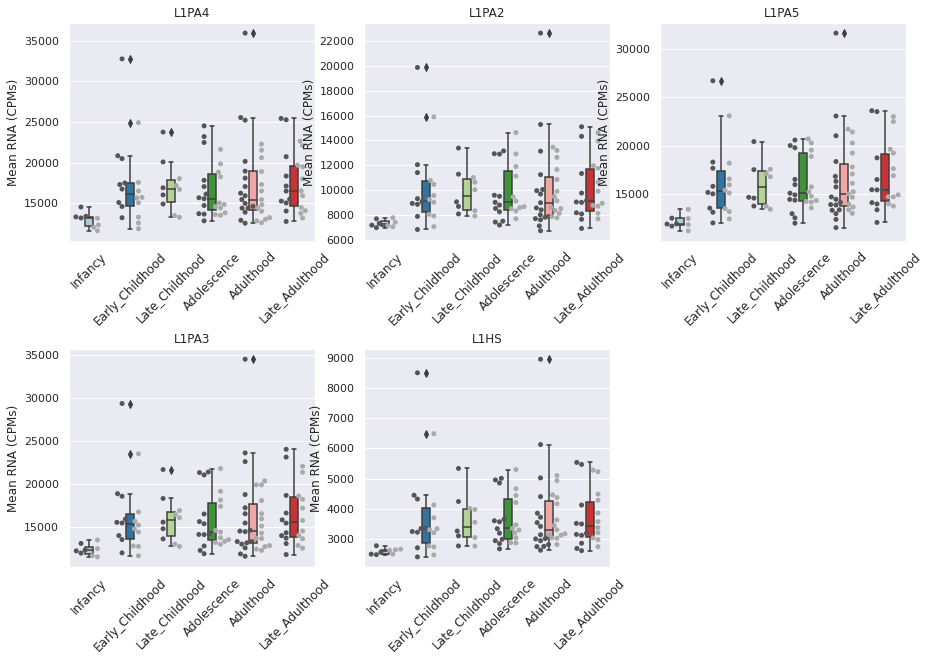

In [323]:
#Plot TET passive and active transcripts
plot_l = sig_df['Class'].unique()
import seaborn as sns
import math
sns.set_theme(style="darkgrid")

fig, axs = plt.subplots(figsize=(15,10))
plt.subplots_adjust(hspace=0.5)
for x,p in enumerate(plot_l):
    ax = plt.subplot(int(math.ceil(len(plot_l)/3)), 3, x + 1)

    group_df = full_df
    plot_df = group_df[group_df['Element'] == p]
    plot_df = plot_df.groupby(['Sample', 'period', 'celltype']).mean()
    plot_df.reset_index(inplace=True)
    sns.boxplot(data=plot_df,x="period", y="CPM", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
    sns.swarmplot(data=plot_df, x="period", y="CPM", hue="celltype", dodge=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
    #remove legend
    ax.get_legend().remove()
    #rotate x ticks
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=12)
    #set title
    ax.set_title(p, fontsize=12)
    #change y label
    ax.set_ylabel('Mean RNA (CPMs)', fontsize=12)
    #remove x label
    ax.set_xlabel('')
    #remove x tick labels
    #if x == 0 or x == 1 or x == 2: ax.set_xticklabels([])
#plt.savefig(s_fig + 'RNA_l1_multi_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()


In [ ]:
group_df = full_df
plot_df = group_df[group_df['Family'] == mod]
plot_df = plot_df.groupby(['Sample', 'period', 'celltype']).mean()
plot_df.reset_index(inplace=True)

#visualise each group with box plot seaborn
import seaborn as sns
sns.set_theme(style="darkgrid")
#sns.violinplot(data=plot_df, x="period", y="RNA", hue="Cell Type", split=True, hue_order=['GLU', 'GABA'], order=['infancy', 'earlychildhood', 'latechildhood', 'adolescence', 'adulthood', 'lateadulthood'], palette="Set1")
#show box plot
sns.boxplot(data=plot_df,x="period", y="CPM", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
sns.swarmplot(data=plot_df, x="period", y="CPM", hue="celltype", split=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
#move legend off plot
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
plt.xticks(rotation=45, fontsize=12)
plt.ylabel('Mean RNA (CPMs)', fontsize=12)
plt.title(mod)
#plt.savefig(s_fig + 'RNA_alu_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()

In [321]:
#Plot coarse levels of L1, Alu and SVA as a function of age for different cell types
curr_df = sub_df

#group by celltype
meta_gaba = meta[meta['Cell Type'] == 'GABA']
meta_glu = meta[meta['Cell Type'] == 'GLU']

l1_gaba = ter.te_group_el(curr_df, meta_gaba, 'L1')
l1_glu = ter.te_group_el(curr_df, meta_glu, 'L1')
alu_gaba = ter.te_group_el(curr_df, meta_gaba, 'Alu')
alu_glu = ter.te_group_el(curr_df, meta_glu, 'Alu')
sva_gaba = ter.te_group_el(curr_df, meta_gaba, 'SVA')
sva_glu = ter.te_group_el(curr_df, meta_glu, 'SVA')

l1_ = ter.te_group_el(curr_df, meta, 'L1')
alu_ = ter.te_group_el(curr_df, meta, 'Alu')
sva_ = ter.te_group_el(curr_df, meta, 'SVA')

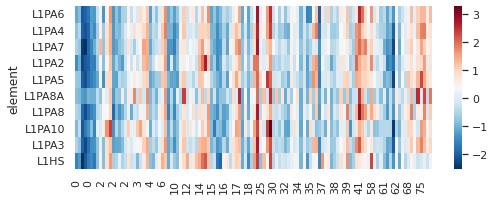

In [327]:
import seaborn as sns
#heatmap
data_l = l1_
#sort columns by sort_name
sort_age, sort_name = adm.sort_2list(data_l[1], data_l[0].columns.values)
sort_df = data_l[0][sort_name]

fig, ax = plt.subplots(figsize=(8,3))
z = (sort_df - np.mean(sort_df, axis=1).values.reshape(-1, 1)) / np.std(sort_df, axis=1).values.reshape(-1, 1)
#only plot L1PA4, LPA2, L1PA5, LPA3, L1HS

sns.heatmap(z, cmap='RdBu_r', ax=ax)
# ax.set_yticklabels(['L1', 'ALU', 'SVA'], rotation=0)
ax.set_xticklabels(sort_age[ 0::4])
#ax.set_title('LINE')
#ax.set_ylabel('Cell Type')
plt.show()

In [25]:
#split into df by age label
thresh = 1 
ind = np.mean(df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]
inp = ter.te_group_el(sub_df, meta, 'L1')
l1_ = inp
adjp_df = ter.spear_adjp(inp[0], inp[1], 0.05)
sig_te = adjp_df[adjp_df['adj_pval'] < 0.05]['geneid'].values
age_l = [INF, ECH, LCH, ADO, ADU, LADU]
name_l = ['INF', 'ECH', 'LCH', 'ADO', 'ADU', 'LADU']

#group for line plot
group_df = {'class':[], 'CPM':[], 'age':[]}   
for x,l in enumerate(age_l):
    group_df['class']= np.append(group_df['class'], sig_te)
    group_df['CPM'] = np.append(group_df['CPM'],np.mean(inp[0][l['sample'].values],axis=1).loc[sig_te].values)
    group_df['age'] = np.append(group_df['age'], np.full(len(sig_te), int(np.mean(l['AGEYEARS'].values) + 1)))

# #group for scatter plot
scat_df = {'class':[], 'CPM':[], 'age':[]}
for x,l in enumerate(sig_te):
    scat_df['class'] = np.append(scat_df['class'], np.full(inp[0].shape[1], l))
    scat_df['CPM'] = np.append(scat_df['CPM'], inp[0].loc[l].values)
    scat_df['age'] = np.append(scat_df['age'], inp[1])

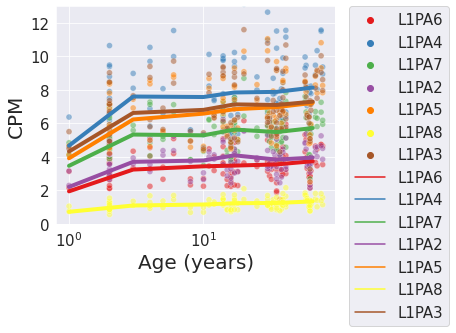

In [28]:
import seaborn as sns
curr_l = l1_
name_l = sig_te
sns.set_style('darkgrid')
fig,ax = plt.subplots(figsize=(5,4))
#set background style in seaborn
pal = 'Set1'
sns.scatterplot(x='age', y='CPM', hue='class', data=scat_df, ax=ax, alpha = 0.5, palette=pal)
sns.lineplot(x='age', y='CPM', hue='class', data=group_df, ax=ax, alpha = 1, linewidth=4, palette=pal)
plt.xscale('log')
#hide legend
#ax.get_legend().remove()
#make x and y labels bigger
ax.set_xlabel('Age (years)', fontsize=20)
ax.set_ylabel('CPM', fontsize=20)
#make ticks larger
ax.tick_params(axis='both', which='major', labelsize=15)
#plt.legend()
#plot legend off to side
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.ylim(0,13)
#plt.savefig('L1_age.svg', dpi=300, bbox_inches='tight', pad_inches=0, transparent=True)
plt.show()

In [326]:
#======================
###ALU
#======================

#Filter low CPM data
thresh = 50
ind = np.mean(df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]

#make into df with RNA, age, class, celltype
curr_df = sub_df
meta = meta
mode = 'granular'
meta_ = meta[['celltype', 'sex', 'age', 'period']]
meta_['period'][meta_['age'] < 2] = 'Infancy'

if mode == 'granular':
    group_df = {'period':[], 'celltype':[], 'Class':[], 'Element':[], 'RNA':[]}
    l1_ind = [x for x,i in enumerate(curr_df.index) if 'L1' in i]#l1 ind
    alu_ind = [x for x,i in enumerate(curr_df.index) if 'Alu' in i]#alu ind
    sva_ind = [x for x,i in enumerate(curr_df.index) if 'SVA' in i]#sva ind

    l1_v = np.ravel([curr_df.iloc[l1_ind][i].values for i in meta['sample'].values])
    alu_v = np.ravel([curr_df.iloc[alu_ind][i].values for i in meta['sample'].values])
    sva_v = np.ravel([curr_df.iloc[sva_ind][i].values for i in meta['sample'].values])
    #make into df
    group_df['RNA'] = np.append(l1_v, np.append(alu_v, sva_v))
    group_df['Class'] = np.append(np.tile(curr_df.iloc[l1_ind].index.values, curr_df.shape[1]), 
                                  np.append(np.tile(curr_df.iloc[alu_ind].index.values,curr_df.shape[1]), np.tile(curr_df.iloc[sva_ind].index.values, curr_df.shape[1])))
    group_df['period'] = np.append(np.repeat(meta_['period'], len(l1_ind)).values,
                                  np.append(np.repeat(meta_['period'], len(alu_ind)).values, np.repeat(meta_['period'], len(sva_ind)).values))
    group_df['celltype'] = np.append(np.repeat(meta_['celltype'], len(l1_ind)).values,
                                  np.append(np.repeat(meta_['celltype'], len(alu_ind)).values, np.repeat(meta_['celltype'], len(sva_ind)).values))
    group_df['Element'] = np.append(np.repeat('L1', len(l1_v)),
                                  np.append(np.repeat('Alu', len(alu_v)), np.repeat('SVA', len(sva_v))))
    group_df = pd.DataFrame(group_df)


In [327]:
element = 'Alu'
class_l = group_df[group_df['Element'] == element]['Class'].unique()
cell_l = 'GLU', 'GABA'
period_l = 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'
sub_df = group_df[group_df['Element'] == element]

comp_df = ter.inf_paired_comp(class_l, cell_l, period_l, sub_df, 'granular')
sig_df = comp_df[comp_df['padj_sig']==True]
sig_df

,celltype,Class,Comparison,p value,padj_sig,statistic
19,GABA,AluJo,infancy_Late_Adulthood,0.000170,True,-5.204524
29,GABA,AluJr,infancy_Late_Adulthood,0.000287,True,-4.905354
49,GABA,AluSz6,infancy_Late_Adulthood,0.000379,True,-4.750312
69,GABA,AluSz,infancy_Late_Adulthood,0.000507,True,-4.589318
109,GABA,AluJb,infancy_Late_Adulthood,0.000287,True,-4.906253
139,GABA,AluJr4,infancy_Late_Adulthood,0.000388,True,-4.737218


/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 9.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 9.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


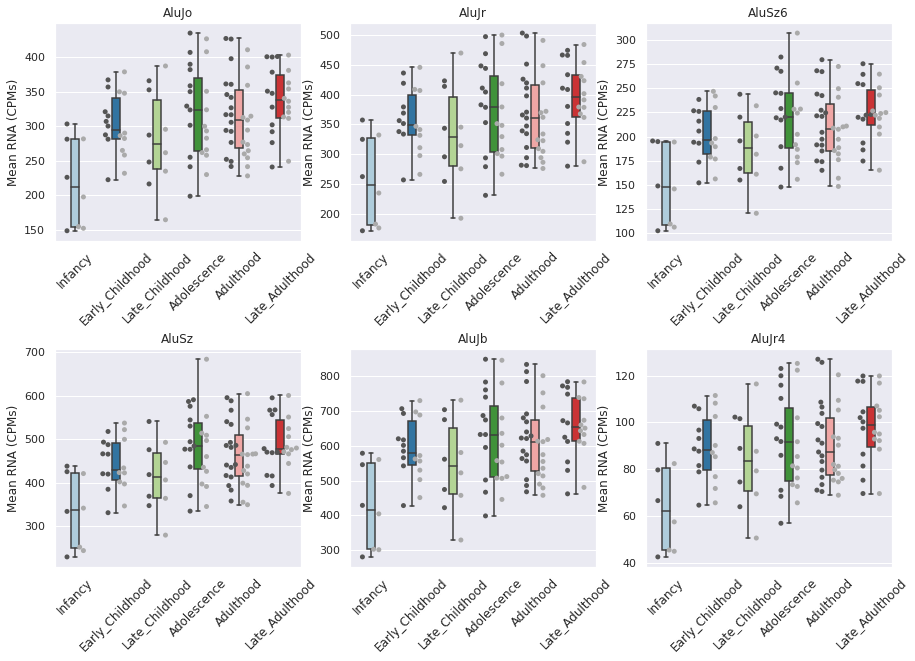

In [328]:
plot_l = sig_df['Class'].unique()
import seaborn as sns
sns.set_theme(style="darkgrid")

fig, axs = plt.subplots(figsize=(15,10))
plt.subplots_adjust(hspace=0.5)
for x,p in enumerate(plot_l):
    ax = plt.subplot(int(math.ceil(len(plot_l)/3)), 3, x + 1)

    plot_df = group_df[group_df['Class'] == p]
    sns.boxplot(data=plot_df,x="period", y="RNA", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
    sns.swarmplot(data=plot_df, x="period", y="RNA", hue="celltype", dodge=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
    #remove legend
    ax.get_legend().remove()
    #rotate x ticks
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=12)
    #set title
    ax.set_title(p, fontsize=12)
    #change y label
    ax.set_ylabel('Mean RNA (CPMs)', fontsize=12)
    #remove x label
    ax.set_xlabel('')
    #remove x tick labels
    #if x == 0 or x == 1 or x == 2: ax.set_xticklabels([])
#plt.savefig(s_fig + 'RNA_l1_multi_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()


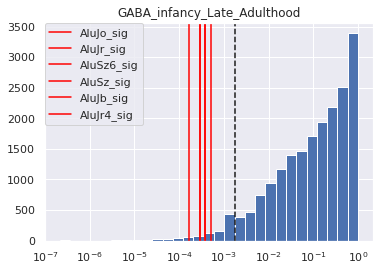

,index,celltype,Class,Comparison,p value,padj_sig,statistic,comb,baseline_sig
0,19,GABA,AluJo,infancy_Late_Adulthood,0.000170,True,-5.204524,GABA_infancy_Late_Adulthood,sig
1,29,GABA,AluJr,infancy_Late_Adulthood,0.000287,True,-4.905354,GABA_infancy_Late_Adulthood,sig
2,49,GABA,AluSz6,infancy_Late_Adulthood,0.000379,True,-4.750312,GABA_infancy_Late_Adulthood,sig
3,69,GABA,AluSz,infancy_Late_Adulthood,0.000507,True,-4.589318,GABA_infancy_Late_Adulthood,sig
4,109,GABA,AluJb,infancy_Late_Adulthood,0.000287,True,-4.906253,GABA_infancy_Late_Adulthood,sig
5,139,GABA,AluJr4,infancy_Late_Adulthood,0.000388,True,-4.737218,GABA_infancy_Late_Adulthood,sig


In [329]:
#Null model -> compare p values
#---------------------------------------
null_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_null_test.csv')
final_df = ter.plot_null(null_df, sig_df, 20, 4)
final_df

/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 20.0% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 7.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 8.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)

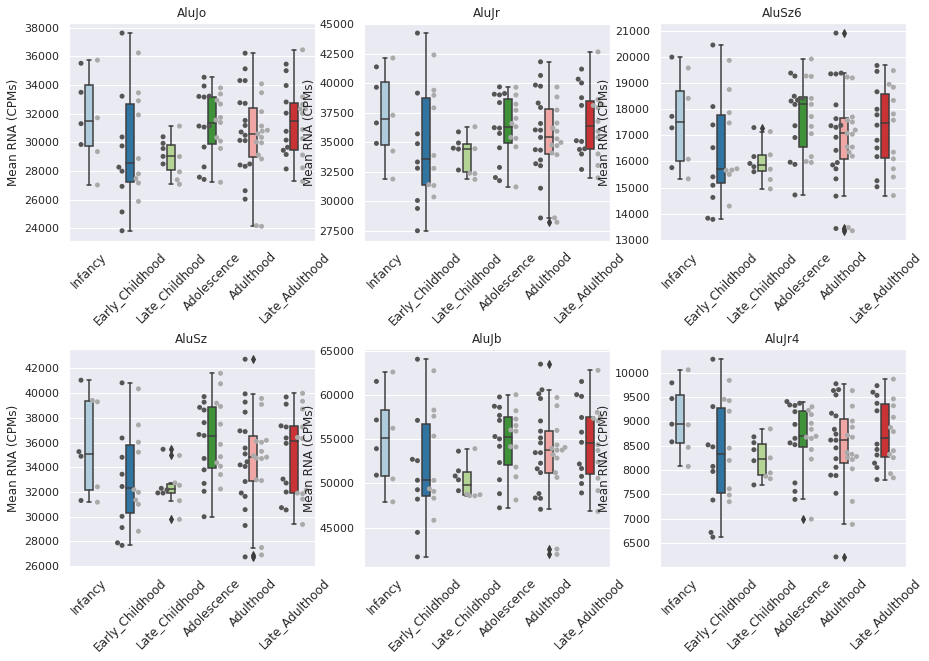

In [330]:
sig_df = final_df[final_df['baseline_sig'] == 'sig']

#Plot TET passive and active transcripts
plot_l = sig_df['Class'].unique()
import seaborn as sns
import math
sns.set_theme(style="darkgrid")

fig, axs = plt.subplots(figsize=(15,10))
plt.subplots_adjust(hspace=0.5)
for x,p in enumerate(plot_l):
    ax = plt.subplot(int(math.ceil(len(plot_l)/3)), 3, x + 1)

    group_df = full_df
    plot_df = group_df[group_df['Element'] == p]
    plot_df = plot_df.groupby(['Sample', 'period', 'celltype']).mean()
    plot_df.reset_index(inplace=True)
    sns.boxplot(data=plot_df,x="period", y="CPM", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
    sns.swarmplot(data=plot_df, x="period", y="CPM", hue="celltype", dodge=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
    #remove legend
    ax.get_legend().remove()
    #rotate x ticks
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=12)
    #set title
    ax.set_title(p, fontsize=12)
    #change y label
    ax.set_ylabel('Mean RNA (CPMs)', fontsize=12)
    #remove x label
    ax.set_xlabel('')
    #remove x tick labels
    #if x == 0 or x == 1 or x == 2: ax.set_xticklabels([])
#plt.savefig(s_fig + 'RNA_l1_multi_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()


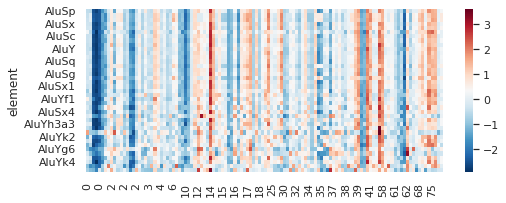

In [378]:
import seaborn as sns
#heatmap
data_l = alu_
#sort columns by sort_name
sort_age, sort_name = adm.sort_2list(data_l[1], data_l[0].columns.values)
sort_df = data_l[0][sort_name]

fig, ax = plt.subplots(figsize=(8,3))
z = (sort_df - np.mean(sort_df, axis=1).values.reshape(-1, 1)) / np.std(sort_df, axis=1).values.reshape(-1, 1)
sns.heatmap(z, cmap='RdBu_r', ax=ax)
# ax.set_yticklabels(['L1', 'ALU', 'SVA'], rotation=0)
ax.set_xticklabels(sort_age[ 0::4])
#ax.set_title('LINE')
#ax.set_ylabel('Cell Type')
plt.show()

In [32]:
#split into df by age label
thresh = 100
ind = np.mean(df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]
inp = ter.te_group_el(sub_df, meta, 'Alu')
alu_ = inp
adjp_df = ter.spear_adjp(inp[0], inp[1], 0.05)
sig_te = adjp_df[adjp_df['adj_pval'] < 0.05]['geneid'].values[:6]
age_l = [INF, ECH, LCH, ADO, ADU, LADU]
name_l = ['INF', 'ECH', 'LCH', 'ADO', 'ADU', 'LADU']

#group for line plot
group_df = {'class':[], 'CPM':[], 'age':[]}   
for x,l in enumerate(age_l):
    group_df['class']= np.append(group_df['class'], sig_te)
    group_df['CPM'] = np.append(group_df['CPM'],np.mean(inp[0][l['sample'].values],axis=1).loc[sig_te].values)
    group_df['age'] = np.append(group_df['age'], np.full(len(sig_te), int(np.mean(l['AGEYEARS'].values) + 1)))

# #group for scatter plot
scat_df = {'class':[], 'CPM':[], 'age':[]}
for x,l in enumerate(sig_te):
    scat_df['class'] = np.append(scat_df['class'], np.full(inp[0].shape[1], l))
    scat_df['CPM'] = np.append(scat_df['CPM'], inp[0].loc[l].values)
    scat_df['age'] = np.append(scat_df['age'], inp[1])

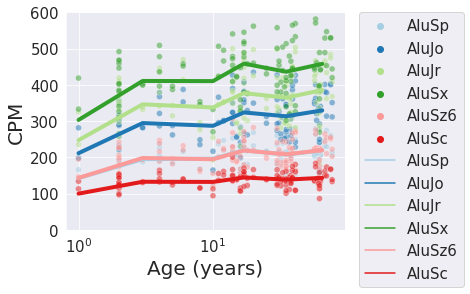

In [42]:
import seaborn as sns
curr_l = alu_
name_l = sig_te
sns.set_style('darkgrid')
fig,ax = plt.subplots(figsize=(5,4))
#set background style in seaborn
pal = 'Paired'
sns.scatterplot(x='age', y='CPM', hue='class', data=scat_df, ax=ax, alpha = 0.5, palette=pal)
sns.lineplot(x='age', y='CPM', hue='class', data=group_df, ax=ax, alpha = 1, linewidth=4, palette=pal)
plt.xscale('log')
#hide legend
#ax.get_legend().remove()
#make x and y labels bigger
ax.set_xlabel('Age (years)', fontsize=20)
ax.set_ylabel('CPM', fontsize=20)
#make ticks larger
ax.tick_params(axis='both', which='major', labelsize=15)
#plt.legend()
#plot legend off to side
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.ylim(0,600)
#plt.savefig('alu_age.svg', dpi=300, bbox_inches='tight', pad_inches=0, transparent=True)
plt.show()

In [333]:
#======================
###SVA
#======================
element = 'SVA'
class_l = group_df[group_df['Element'] == element]['Class'].unique()
cell_l = 'GLU', 'GABA'
period_l = 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'
sub_df = group_df[group_df['Element'] == element]

comp_df = ter.inf_paired_comp(class_l, cell_l, period_l, sub_df, 'granular')
sig_df = comp_df[comp_df['padj_sig']==True]
sig_df

,celltype,Class,Comparison,p value,padj_sig,statistic
29,GABA,SVA_B,infancy_Late_Adulthood,0.000510,True,-4.586548
59,GABA,SVA_A,infancy_Late_Adulthood,0.001179,True,-4.132590


/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 11.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 5.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 9.1% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
/home/dburrows/mambaforge/envs/base_conda/lib/python3.9/site-packages/seaborn/categorical.py:1296: UserWarning: 5.9% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)

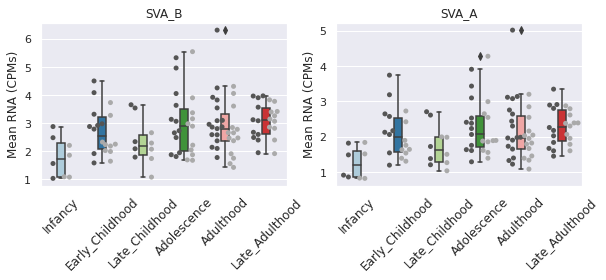

In [334]:
plot_l = sig_df['Class'].unique()
import seaborn as sns
sns.set_theme(style="darkgrid")

fig, axs = plt.subplots(figsize=(15,3))
plt.subplots_adjust(hspace=0.5)
for x,p in enumerate(plot_l):
    ax = plt.subplot(int(math.ceil(len(plot_l)/3)), 3, x + 1)

    plot_df = group_df[group_df['Class'] == p]
    sns.boxplot(data=plot_df,x="period", y="RNA", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
    sns.swarmplot(data=plot_df, x="period", y="RNA", hue="celltype", dodge=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
    #remove legend
    ax.get_legend().remove()
    #rotate x ticks
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=12)
    #set title
    ax.set_title(p, fontsize=12)
    #change y label
    ax.set_ylabel('Mean RNA (CPMs)', fontsize=12)
    #remove x label
    ax.set_xlabel('')
    #remove x tick labels
    #if x == 0 or x == 1 or x == 2: ax.set_xticklabels([])
#plt.savefig(s_fig + 'RNA_l1_multi_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()


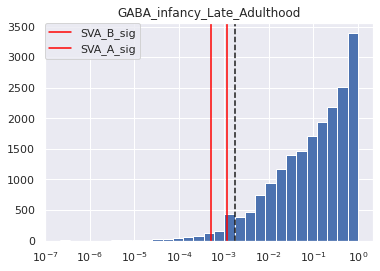

,index,celltype,Class,Comparison,p value,padj_sig,statistic,comb,baseline_sig
0,29,GABA,SVA_B,infancy_Late_Adulthood,0.000510,True,-4.586548,GABA_infancy_Late_Adulthood,sig
1,59,GABA,SVA_A,infancy_Late_Adulthood,0.001179,True,-4.132590,GABA_infancy_Late_Adulthood,sig


In [335]:
#Null model -> compare p values
#---------------------------------------
null_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_null_test.csv')
final_df = ter.plot_null(null_df, sig_df, 20, 4)
final_df

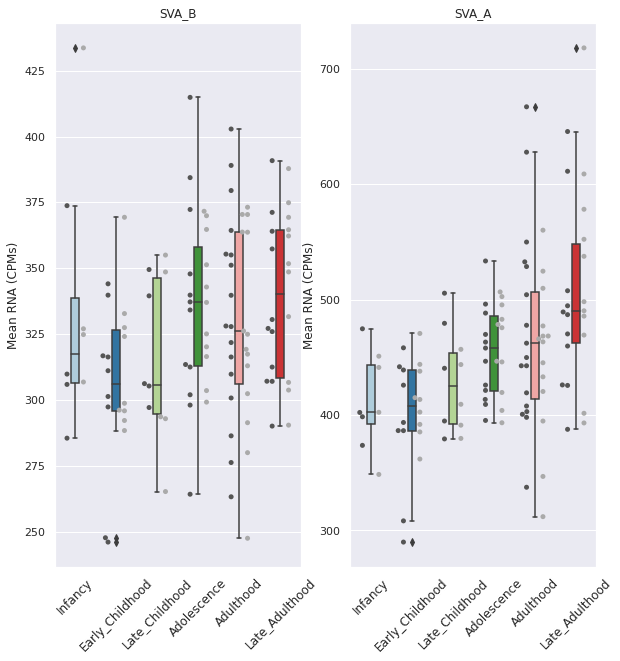

In [336]:
sig_df = final_df[final_df['baseline_sig'] == 'sig']

#Plot TET passive and active transcripts
plot_l = sig_df['Class'].unique()
import seaborn as sns
import math
sns.set_theme(style="darkgrid")

fig, axs = plt.subplots(figsize=(15,10))
plt.subplots_adjust(hspace=0.5)
for x,p in enumerate(plot_l):
    ax = plt.subplot(int(math.ceil(len(plot_l)/3)), 3, x + 1)

    group_df = full_df
    plot_df = group_df[group_df['Element'] == p]
    plot_df = plot_df.groupby(['Sample', 'period', 'celltype']).mean()
    plot_df.reset_index(inplace=True)
    sns.boxplot(data=plot_df,x="period", y="CPM", width=0.2,order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='Paired')
    sns.swarmplot(data=plot_df, x="period", y="CPM", hue="celltype", dodge=True, hue_order=['GLU', 'GABA'], order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'], palette='gray')
    #remove legend
    ax.get_legend().remove()
    #rotate x ticks
    ax.set_xticklabels(ax.get_xticklabels(), rotation=45, fontsize=12)
    #set title
    ax.set_title(p, fontsize=12)
    #change y label
    ax.set_ylabel('Mean RNA (CPMs)', fontsize=12)
    #remove x label
    ax.set_xlabel('')
    #remove x tick labels
    #if x == 0 or x == 1 or x == 2: ax.set_xticklabels([])
#plt.savefig(s_fig + 'RNA_l1_multi_boxplot.svg', bbox_inches='tight', dpi=300, transparent=False)
plt.show()


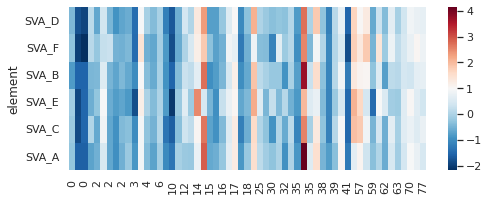

In [415]:
import seaborn as sns
#heatmap
data_l = sva_gaba
#sort columns by sort_name
sort_age, sort_name = adm.sort_2list(data_l[1], data_l[0].columns.values)
sort_df = data_l[0][sort_name]

fig, ax = plt.subplots(figsize=(8,3))
z = (sort_df - np.mean(sort_df, axis=1).values.reshape(-1, 1)) / np.std(sort_df, axis=1).values.reshape(-1, 1)
sns.heatmap(z, cmap='RdBu_r', ax=ax)
# ax.set_yticklabels(['L1', 'ALU', 'SVA'], rotation=0)
ax.set_xticklabels(sort_age[ 0::2])
#ax.set_title('LINE')
#ax.set_ylabel('Cell Type')
plt.show()

In [45]:
#split into df by age label
thresh = 1 
ind = np.mean(df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]
inp = ter.te_group_el(sub_df, meta, 'SVA')
sva_ = inp
adjp_df = ter.spear_adjp(inp[0], inp[1], 0.05)
sig_te = adjp_df[adjp_df['adj_pval'] < 0.05]['geneid'].values
age_l = [INF, ECH, LCH, ADO, ADU, LADU]
name_l = ['INF', 'ECH', 'LCH', 'ADO', 'ADU', 'LADU']

#group for line plot
group_df = {'class':[], 'CPM':[], 'age':[]}   
for x,l in enumerate(age_l):
    group_df['class']= np.append(group_df['class'], sig_te)
    group_df['CPM'] = np.append(group_df['CPM'],np.mean(inp[0][l['sample'].values],axis=1).loc[sig_te].values)
    group_df['age'] = np.append(group_df['age'], np.full(len(sig_te), int(np.mean(l['AGEYEARS'].values) + 1)))

# #group for scatter plot
scat_df = {'class':[], 'CPM':[], 'age':[]}
for x,l in enumerate(sig_te):
    scat_df['class'] = np.append(scat_df['class'], np.full(inp[0].shape[1], l))
    scat_df['CPM'] = np.append(scat_df['CPM'], inp[0].loc[l].values)
    scat_df['age'] = np.append(scat_df['age'], inp[1])

/var/tmp/ipykernel_647149/3916128849.py:22: UserWarning: Attempted to set non-positive bottom ylim on a log-scaled axis.
Invalid limit will be ignored.
  plt.ylim(0,22)


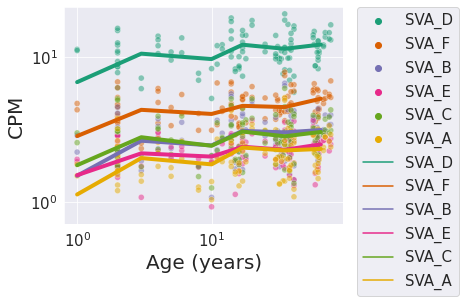

In [51]:
import seaborn as sns
curr_l = sva_
name_l = sig_te
sns.set_style('darkgrid')
fig,ax = plt.subplots(figsize=(5,4))
#set background style in seaborn
pal = 'Dark2'
sns.scatterplot(x='age', y='CPM', hue='class', data=scat_df, ax=ax, alpha = 0.5, palette=pal)
sns.lineplot(x='age', y='CPM', hue='class', data=group_df, ax=ax, alpha = 1, linewidth=4, palette=pal)
plt.xscale('log')
plt.yscale('log')
#hide legend
#ax.get_legend().remove()
#make x and y labels bigger
ax.set_xlabel('Age (years)', fontsize=20)
ax.set_ylabel('CPM', fontsize=20)
#make ticks larger
ax.tick_params(axis='both', which='major', labelsize=15)
#plt.legend()
#plot legend off to side
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0., fontsize=15)
plt.ylim(0,22)
#plt.savefig('alu_age.svg', dpi=300, bbox_inches='tight', pad_inches=0, transparent=True)
plt.show()

### Celltype differences

In [8]:
df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_sub-COUNT.csv', index_col=0)

In [222]:
# Save count data across all donors as dataframe
meta = pd.read_csv('/datasets/Public_Datasets/Dracheva_PsychEncode_development/processed/PEC_RNAmeta.csv')
ev_df = pd.read_csv('/cndd3/dburrows/DATA/te/gtf/annotations/rmsk/evolutionary_age.csv')
guide_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_CPM.csv', index_col=0)

#Load in PE data for each sample
mode='Count'
ID_l = meta['sample'].values
parent_path = '/cndd/dburrows/DATA/te/rna/PE.counts/ATEM/'
te = ev_df['element'].values
dict = {'element':te}
for ID in ID_l:
    te_v = ter.load_ATEM_family(parent_path + '/Sample_' + ID + '/ATEM_counts.csv', te, mode)
    assert len(te) == len(te_v), 'Error: Not all TE elements were counted'
    #Add to dict
    dict[ID] = te_v
df = pd.DataFrame(dict)
#set first column to index
df.set_index('element', inplace=True)
df = df.astype(int)

#Filter based on low CPM data
thresh = 1 
ind = np.mean(guide_df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]

#write to csv
l1_df = sub_df[sub_df.index.str.contains('L1')]
alu_df = sub_df[sub_df.index.str.contains('Alu')]
sva_df = sub_df[sub_df.index.str.contains('SVA')]

coarse_df = pd.DataFrame()
coarse_df['L1'] = np.mean(l1_df,axis=0).astype(int)
coarse_df['Alu'] = np.mean(alu_df,axis=0).astype(int)
coarse_df['SVA'] = np.mean(sva_df,axis=0).astype(int)

coarse_df.T.to_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_coarse_sub-COUNT.csv')

In [5]:
# generate design matrix 
# only keep some columns in meta
dm = meta[['Cell Type', 'sex', 'race', 'AGEYEARS']]
dm['race'][dm['race'] !='White'] = 'Black'
age_ = dm['AGEYEARS'].values
new_age = (age_ - np.mean(age_))/np.std(age_)
dm['AGEYEARS'] = new_age
dm.index = meta['sample'].values
dm.to_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_design.csv')

/var/tmp/ipykernel_470872/603997467.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dm['race'][dm['race'] !='White'] = 'Black'
/var/tmp/ipykernel_470872/603997467.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dm['AGEYEARS'] = new_age


In [4]:
#Load in CPMS
df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_sub-COUNT.csv', index_col=0)
coarse_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_coarse_sub-COUNT.csv', index_col=0)

#Load in evolutionary age
evol_age = pd.read_csv('/cndd3/dburrows/DATA/te/annotations/rmsk/evolutionary_age.csv')

#Load in DESEQ results
cell_res = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/granular_DESEQ-celltype.csv', index_col=0)
cell_coarse_res = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/coarse_DESEQ-celltype.csv', index_col=0)

In [7]:
coarse_df

,1105-GABA,1105-GLU,1133-GABA,1133-GLU,1134-GABA,1134-GLU,1275-GABA,1275-GLU,1277-GABA,1277-GLU,...,Hct16HCQA020-GABA,Hct16HCQA020-GLU,Hct16HECA028-GABA,Hct16HECA028-GLU,Hct17HEIA010-GABA,Hct17HEIA010-GLU,HctYPA008-GABA,HctYPA008-GLU,HctZZNA014-GABA,HctZZNA014-GLU
L1,1048,910,1800,1634,1165,1154,1449,928,1053,1199,...,1496,1404,1163,1212,1485,1251,1544,1777,1506,1483
Alu,33677,29473,47639,43062,27722,28226,40165,27638,31958,37755,...,36411,35359,30038,30148,36973,28021,38144,43851,44298,39375
SVA,1150,977,1566,1432,653,823,1027,1700,935,1238,...,1183,1265,1014,1121,803,731,1318,1659,1557,1507


In [10]:
cell_coarse_res

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
L1,1305.805637,0.027627,0.025846,1.068887,0.285121,0.285121
Alu,35497.096985,-0.033106,0.021770,-1.520743,0.128324,0.285121
SVA,1281.101311,0.058480,0.051566,1.134076,0.256763,0.285121


In [8]:
#GLU vs GABA comparison
cell_res[cell_res['padj'] < 0.05]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
L1PA6,1023.886841,0.216371,0.044559,4.855791,1.199071e-06,9.592564e-06
L1PA8A,407.104400,0.873616,0.085287,10.243266,1.268789e-24,7.105218e-23
L1PA8,357.603820,0.197672,0.043159,4.580087,4.647824e-06,3.253477e-05
AluYj4,2590.220936,-0.135907,0.017574,-7.733364,1.047413e-14,2.932758e-13
FLAM_C,587.731689,-0.240696,0.036359,-6.620075,3.590169e-11,5.026237e-10
AluYf1,2329.548675,-0.130927,0.018265,-7.168086,7.605350e-13,1.419665e-11
AluYk3,1178.286955,-0.096515,0.018866,-5.115694,3.125896e-07,2.917503e-06
AluYi6,661.930972,-0.243020,0.061900,-3.926004,8.636868e-05,4.836646e-04
AluYc3,719.884953,-0.077428,0.025597,-3.024855,2.487523e-03,1.160844e-02
AluYb8,8473.110616,-0.112198,0.043309,-2.590631,9.580022e-03,4.126779e-02


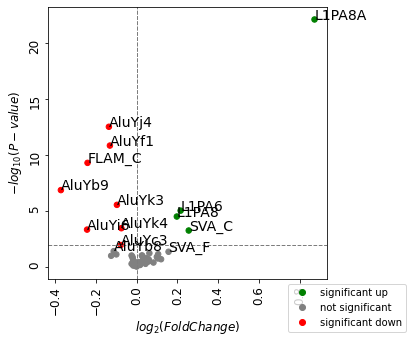

In [14]:
#left = GABA > GLU
#right = GLU > GABA
from bioinfokit import analys, visuz
cell_res['geneid'] = cell_res.index
normp_inadj = np.max(cell_res['pvalue'][cell_res['padj'] < 0.05])

# load dataset as pandas dataframe
visuz.GeneExpression.volcano(df=cell_res, lfc='log2FoldChange', pv='padj', dim = (5,5), dotsize=30, 
                             geneid = 'geneid', genenames = tuple(cell_res[cell_res['padj'] < 0.05]['geneid'].values), 
                             valpha = 1,gstyle=1, sign_line=True
                             ,plotlegend=True, legendpos='upper right',
                             legendanchor=(1.30,0), pv_thr = (normp_inadj,normp_inadj), lfc_thr=(0,0), 
                             axtickfontsize=12, axlabelfontsize=12, gfont=14, figtype='svg', figname=s_fig + '/ATEM_PE_celltype', show=True)
                            

In [12]:
ter.spear_adjp(l1_glu[0], l1_glu[1], 0.05)

,stat,pval,adj_pval,geneid
L1PA6,0.269557,0.038962,0.160812,L1PA6
L1PA4,0.168678,0.201571,0.251964,L1PA4
L1PA7,0.202752,0.123538,0.176482,L1PA7
L1PA2,0.207286,0.115190,0.176482,L1PA2
L1PA5,0.258296,0.048244,0.160812,L1PA5
L1PA8A,0.217640,0.097748,0.176482,L1PA8A
L1PA8,0.324047,0.012288,0.122882,L1PA8
L1PA10,-0.021439,0.871957,0.871957,L1PA10
L1PA3,0.241331,0.065569,0.163922,L1PA3
L1HS,0.090320,0.496308,0.551453,L1HS


In [11]:
cell_lfc = cell_res['log2FoldChange'][cell_res.index.str.contains('L1')]
cell_lfc

L1PA6     0.216371
L1PA4     0.061157
L1PA7    -0.024415
L1PA2     0.059199
L1PA5    -0.099300
L1PA8A    0.873616
L1PA8     0.197672
L1PA10    0.106013
L1PA3     0.017310
L1HS      0.099561
Name: log2FoldChange, dtype: float64

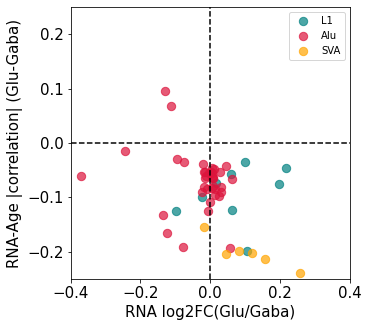

In [19]:
# Plot GLU/GABA logfoldchange against GLU/GABA correlation with age
# are there some TEs that show age effects only in one cell type?
fig,ax = plt.subplots(figsize=(5,5))
cell_lfc = cell_res['log2FoldChange'][cell_res.index.str.contains('L1')]
age_corr = (np.abs(ter.spear_adjp(l1_glu[0], l1_glu[1], 0.05)['stat'])) - np.abs((ter.spear_adjp(l1_gaba[0], l1_gaba[1], 0.05)['stat']))
plt.scatter(cell_lfc, age_corr, color='teal', label = 'L1', s=70, alpha=0.7)

cell_lfc = cell_res['log2FoldChange'][cell_res.index.str.contains('Alu')]
age_corr = (np.abs(ter.spear_adjp(alu_glu[0], alu_glu[1], 0.05)['stat'])) - np.abs((ter.spear_adjp(alu_gaba[0], alu_gaba[1], 0.05)['stat']))
plt.scatter(cell_lfc, age_corr, color='crimson', label = 'Alu', s=70, alpha=0.7)

cell_lfc = cell_res['log2FoldChange'][cell_res.index.str.contains('SVA')]
age_corr = (np.abs(ter.spear_adjp(sva_glu[0], sva_glu[1], 0.05)['stat'])) - np.abs((ter.spear_adjp(sva_gaba[0], sva_gaba[1], 0.05)['stat']))
plt.scatter(cell_lfc, age_corr, color='orange', label = 'SVA', s=70, alpha=0.7)
#make legend bigger
plt.legend()
#label axes
plt.xlabel('RNA log2FC(Glu/Gaba)', fontsize=15)
plt.ylabel('RNA-Age |correlation| (Glu-Gaba)', fontsize=15)
#draw horizontal and vertical lines at 0
plt.axhline(y=0, color='k', linestyle='--')
plt.axvline(x=0, color='k', linestyle='--')
#extend x and y limits
plt.xlim(-0.4,0.4)
plt.ylim(-0.25,0.25)
#mmake ticks bigger
plt.tick_params(axis='both', which='major', labelsize=15)
plt.savefig(s_fig + '/ATEM_PE_celltype_agecorr.svg', dpi=300, bbox_inches='tight', pad_inches=0, transparent=True)
plt.show()

### RNA-loci: chromosome

In [165]:
full_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_chr_counts.csv')

In [324]:
#Distributions across chromosomes
#====================================

#Group by chromosome across samples
#====================================
mode='CPM'
ID_l = meta_['sample'].values
parent_path = '/cndd/dburrows/DATA/te/rna/PE.counts/ATEM/'
full_df = pd.DataFrame()
for ID in ID_l:
    ATEM_path = '/cndd/dburrows/DATA/te/rna/PE.counts/ATEM/Sample_' + ID + '/ATEM_counts.csv'
    count_mat = pd.read_csv(ATEM_path, sep="\t", header=0) 
    chr_list = [i for i in count_mat['Chromosome'].unique() if len(i) < 6]
    for chr in chr_list:
        curr_ = count_mat[count_mat['Chromosome'] == chr]
        sumd_ = curr_.groupby('gene_id').sum()
        sumd_['Chromosome'] = np.full(len(sumd_), chr)
        sumd_['Sample'] = np.full(len(sumd_), ID)
        sumd_['age'] = np.full(len(sumd_), meta_[meta_['sample'] == ID]['age'].values[0])
        sumd_['celltype'] = np.full(len(sumd_), meta_[meta_['sample'] == ID]['celltype'].values[0])
        sumd_['period'] = np.full(len(sumd_), meta_[meta_['sample'] == ID]['period'].values[0])
        newv = []
        for i in sumd_.index.values: 
            if 'L1' in i: newv = np.append(newv, i[:2])
            else: newv = np.append(newv, i[:3])
        sumd_['Family'] = newv
        if chr == chr_list[0]: sum_df = sumd_
        else: sum_df = pd.concat([sum_df, sumd_], axis=0)
    full_df = pd.concat([full_df, sum_df], axis=0)
full_df.drop(['Start', 'End'], axis=1, inplace=True)
full_df = full_df.drop(np.append(full_df[full_df['Family'] == 'FRA'].index.values,full_df[full_df['Family'] == 'FLA'].index.values))
full_df.to_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_chr_counts.csv')

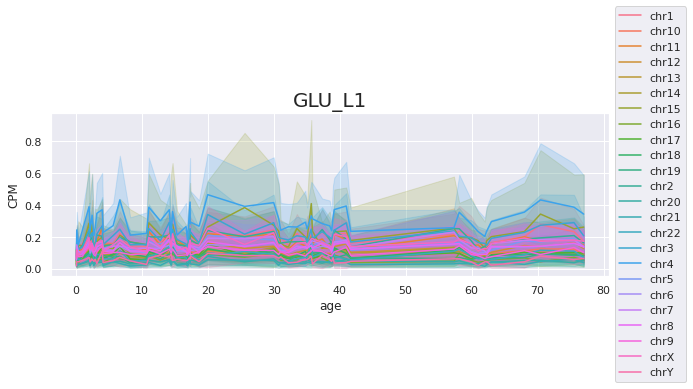

In [212]:
cell = 'GLU'
clss = 'L1'
fig,ax = plt.subplots(figsize=(10, 3))
sns.lineplot(data=full_df[(full_df['celltype']==cell) & (full_df['Family'] == clss)], x='age', y = 'CPM', hue = 'Chromosome')
#move legend
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.title(cell + '_' + clss, fontsize=20)
plt.show()

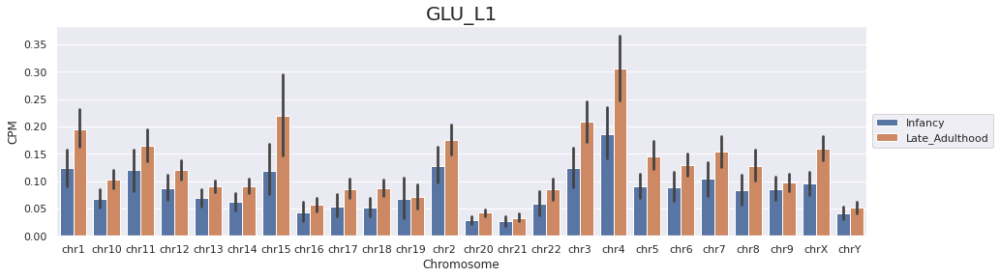

In [213]:
cell = 'GLU'
clss = 'L1'
fig,ax = plt.subplots(figsize=(15, 4))
sns.barplot(data=full_df[(full_df['celltype']==cell) & (full_df['Family'] == clss)], x='Chromosome', y = 'CPM', hue = 'period', hue_order=['Infancy', 'Late_Adulthood'])

#move legend
plt.title(cell + '_' + clss, fontsize=20)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

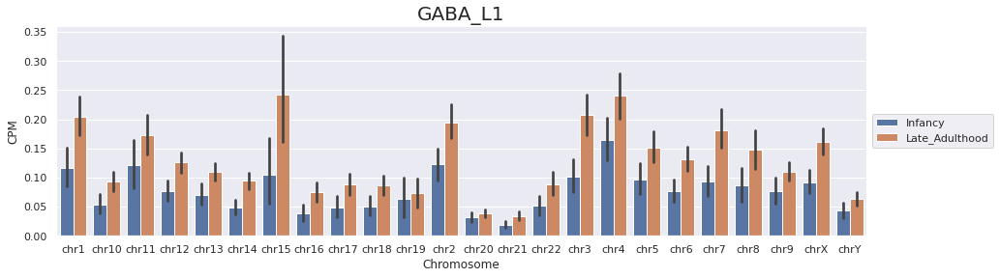

In [216]:
cell = 'GABA'
clss = 'L1'
fig,ax = plt.subplots(figsize=(15, 4))
sns.barplot(data=full_df[(full_df['celltype']==cell) & (full_df['Family'] == clss)], x='Chromosome', y = 'CPM', hue = 'period', hue_order=['Infancy', 'Late_Adulthood'])

#move legend
plt.title(cell + '_' + clss, fontsize=20)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

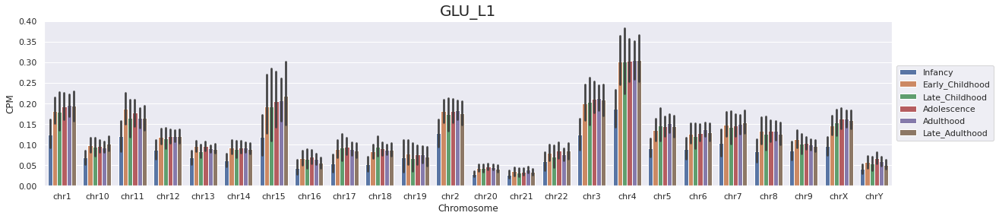

In [223]:
cell = 'GLU'
clss = 'L1'
fig,ax = plt.subplots(figsize=(20, 4))
sns.barplot(data=full_df[(full_df['celltype']==cell) & (full_df['Family'] == clss)], x='Chromosome', y = 'CPM', hue = 'period', 
            hue_order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'])

#move legend
plt.title(cell + '_' + clss, fontsize=20)
ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

In [228]:
unq = sig_df['Class'].unique()
unq

array(['L1PA4', 'L1PA2', 'L1PA5', 'L1PA3', 'L1HS'], dtype=object)

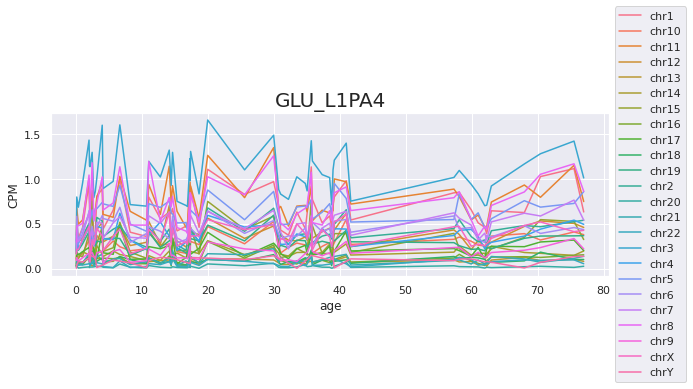

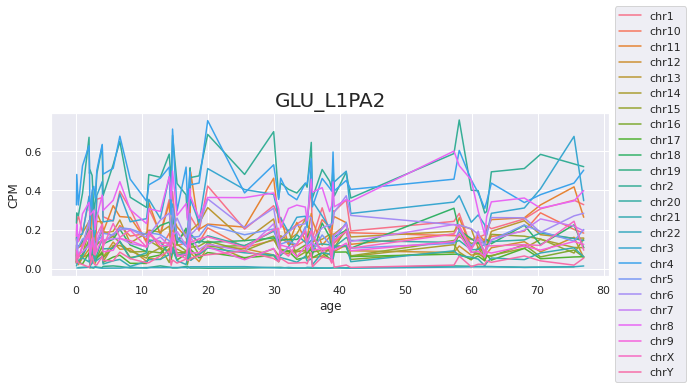

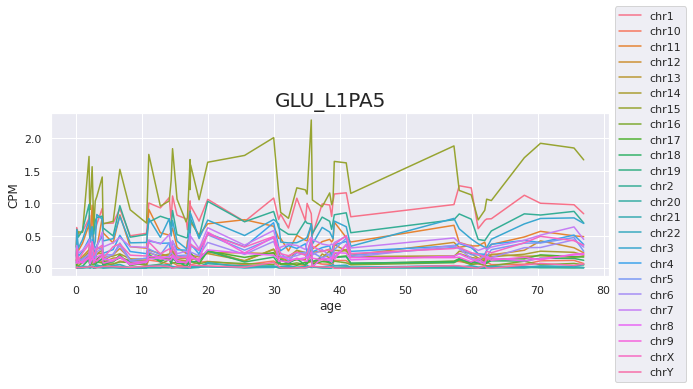

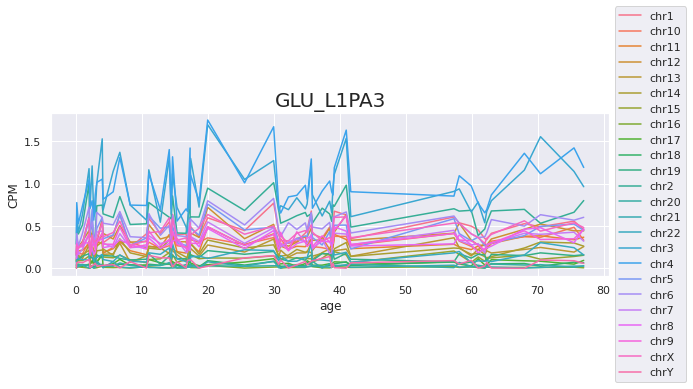

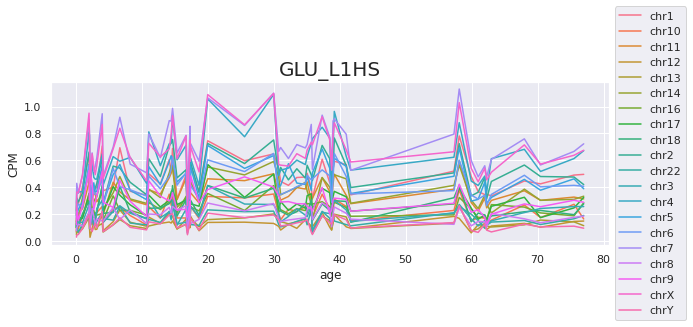

In [229]:
#GRANULAR
for u in unq:
    cell = 'GLU'
    clss = u
    fig,ax = plt.subplots(figsize=(10, 3))
    sns.lineplot(data=full_df[(full_df['celltype']==cell) & (full_df['gene_id'] == clss)], x='age', y = 'CPM', hue = 'Chromosome')
    #move legend
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.title(cell + '_' + clss, fontsize=20)
    plt.show()

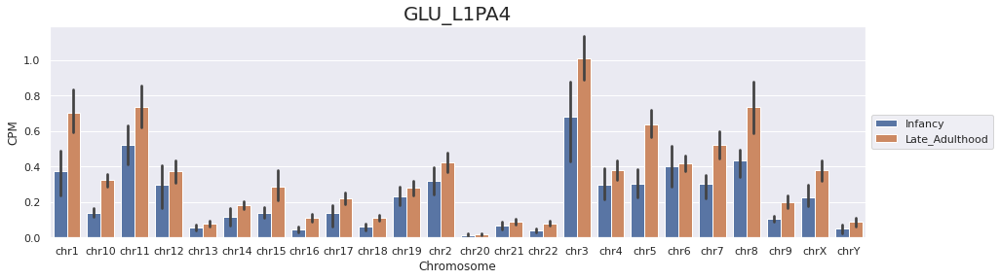

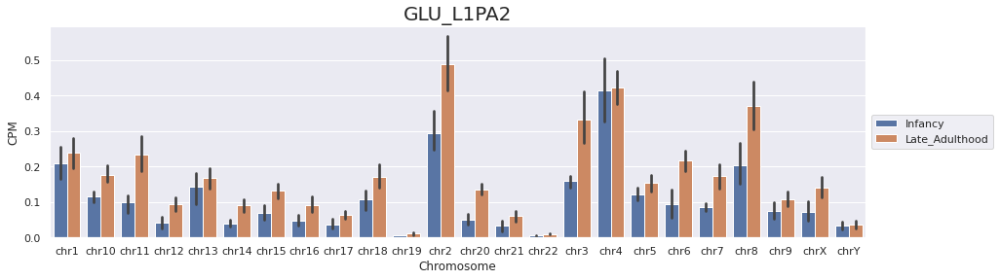

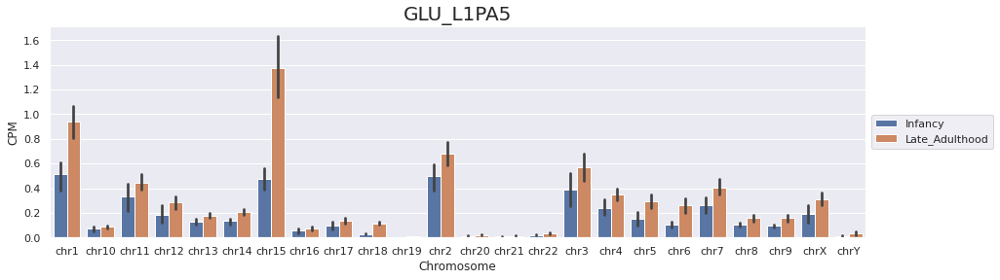

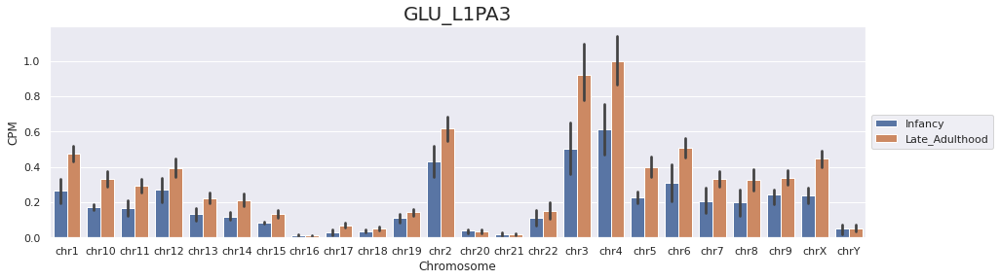

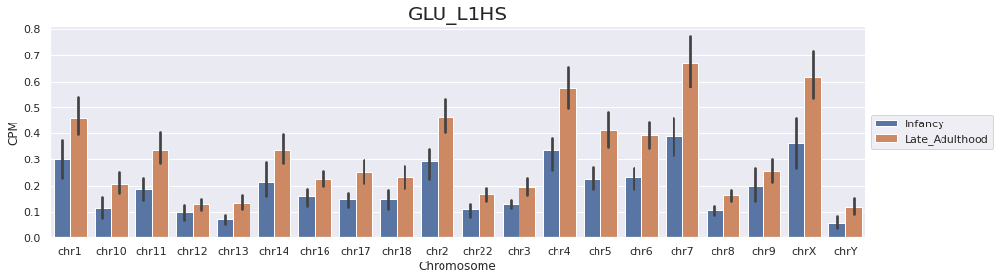

In [231]:
for u in unq:
    cell = 'GLU'
    clss = u
    fig,ax = plt.subplots(figsize=(15, 4))
    sns.barplot(data=full_df[(full_df['celltype']==cell) & (full_df['gene_id'] == clss)], x='Chromosome', y = 'CPM', hue = 'period', hue_order=['Infancy', 'Late_Adulthood'])

    #move legend
    plt.title(cell + '_' + clss, fontsize=20)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

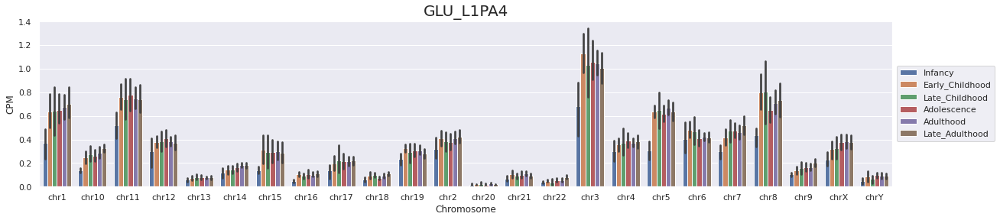

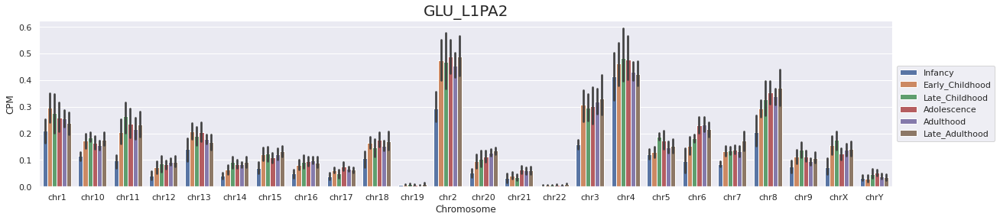

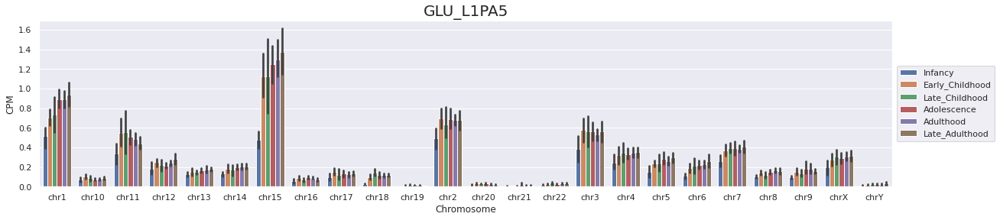

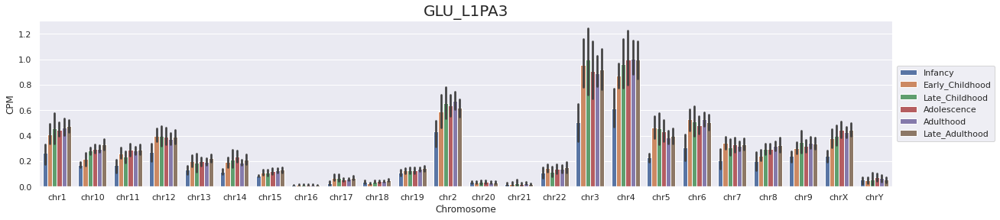

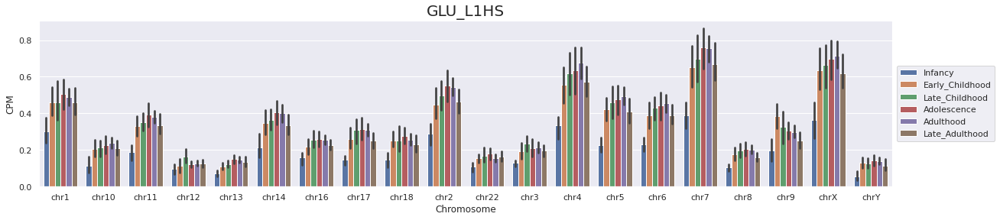

In [234]:
for u in unq:
    cell = 'GLU'
    clss = u
    fig,ax = plt.subplots(figsize=(20, 4))
    sns.barplot(data=full_df[(full_df['celltype']==cell) & (full_df['gene_id'] == clss)], x='Chromosome', y = 'CPM', hue = 'period', 
               hue_order=['Infancy', 'Early_Childhood', 'Late_Childhood', 'Adolescence', 'Adulthood', 'Late_Adulthood'])

    #move legend
    plt.title(cell + '_' + clss, fontsize=20)
    ax.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

### RNA-loc: gene regions

In [ ]:
#Gene locations distributions -> intergenic, intragenic, intron, exon etc.
#========================================================================
%%bash
# Find intersect of filtered rmsk bed file and hg38 annotation

#First swap columns of bed file -> sign must be at 6th position
awk ' { t = $4; $4 = $6; $6 = t; print; } ' OFS=$'\t' rmsk.hg38.filt-5ptrim.merge.bed  > rmsk.hg38.filt-5ptrim.merge.rerr.bed

#reduce down to those only overlapping rmsk bed file
bedtools intersect -s -u -a ../gencode/gencode.v44.annotation.hg38.gtf -b rmsk.hg38.filt-5ptrim.merge.rerr.bed > gencode.v44.annotation.hg38.rmsk_intersect.gtf


In [ ]:
#convert ATEM_COUNTS.csv to bed file, with re-positioned columns

# bedtools intersect, count each gtf row for each rmskloci, and append rmsk cpms to that locus
bedtools intersect -s -wb -a gencode.v44.annotation.hg38.rmsk_intersect.gtf -b prac.minus.rerr.bed > prac.out.csv

In [ ]:
#distinguish between exon, intron, CDS, codon, UTR etc

In [ ]:
#Find all loci counts not in above bedtools intersect, sum over for intergenic
bedtools intersect -s -v -b gencode.v44.annotation.hg38.rmsk_intersect.gtf -a prac.minus.rerr.bed > prac.not.out.csv

In [ ]:
# Find a way to find labels of genomic locations
# Find way to return counts at each location, or append column of CPMs
# Run on all datasets and output csv
# Compare

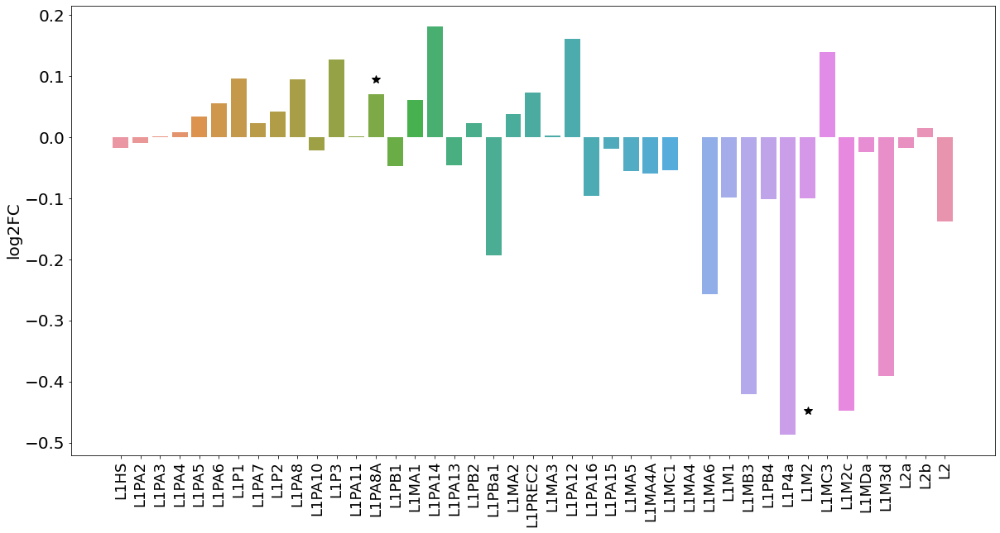

In [110]:
str_arg = 'LINE'
sub_ = age_res.loc[(evol_age['family'] == str_arg).values]
sort_age, sort_name = adm.sort_2list(evol_age[evol_age['family'] == str_arg]['age'].values, evol_age[evol_age['family'] == str_arg]['element'].values)

import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=sub_, x=sub_.index, y="log2FoldChange", order=sort_name)
# add * symbol above bars with p < 0.05
plt.plot(np.where(sub_['padj'] < 0.05)[0], sub_[sub_['padj'] < 0.05]['log2FoldChange'], '*', color='k', markersize=10)
#increase size of labels
plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('log2FC', fontsize=20)
#make yaxis log scale
#plt.yscale('log')
plt.savefig(s_fig + '/ATEM_PE_LINE_age_bar.svg', transparent=True)
plt.show()

In [7]:
# Log FC against evol age
str_arg = 'LINE'
sub_ = age_res.loc[(evol_age['family'] == str_arg).values]
#sort_age, sort_name = adm.sort_2list(evol_age[evol_age['family'] == str_arg]['age'].values, evol_age[evol_age['family'] == str_arg]['element'].values)


In [29]:
#pearson correlation
from scipy import stats
stat, pval = stats.pearsonr(evol_age[evol_age['family'] == str_arg]['age'].values, sub_['log2FoldChange'].values)
stat, pval

(-0.4208367778441728, 0.004952660064706171)

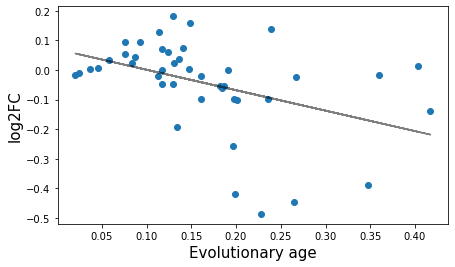

In [27]:
plt.subplots(figsize=(7,4))
plt.scatter(evol_age[evol_age['family'] == str_arg]['age'].values, sub_['log2FoldChange'].values)
#fit linear regression line to data
slope, intercept, r_value, p_value, std_err = stats.linregress(evol_age[evol_age['family'] == str_arg]['age'].values, sub_['log2FoldChange'].values)
#plot line
plt.plot(evol_age[evol_age['family'] == str_arg]['age'].values, intercept + slope*evol_age[evol_age['family'] == str_arg]['age'].values, c='k', alpha=0.5)
plt.xlabel('Evolutionary age', fontsize=15)
plt.ylabel('log2FC', fontsize=15)
plt.savefig(s_fig + '/ATEM_PE_LINE_age_scatter.svg', transparent=True)
plt.show()

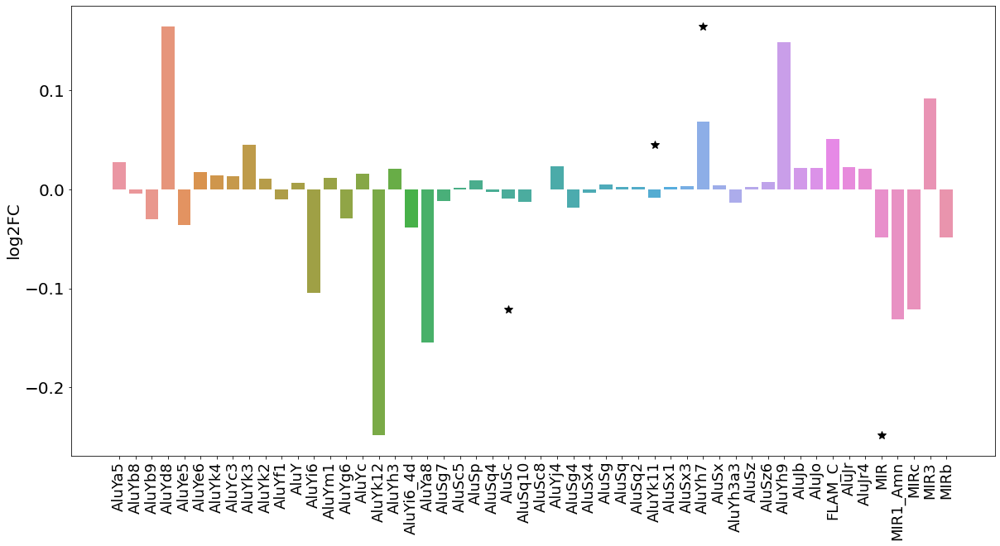

In [111]:
str_arg = 'SINE'
sub_ = age_res.loc[(evol_age['family'] == str_arg).values]
sort_age, sort_name = adm.sort_2list(evol_age[evol_age['family'] == str_arg]['age'].values, evol_age[evol_age['family'] == str_arg]['element'].values)

import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=sub_, x=sub_.index, y="log2FoldChange", order=sort_name)
# add * symbol above bars with p < 0.05
plt.plot(np.where(sub_['padj'] < 0.05)[0], sub_[sub_['padj'] < 0.05]['log2FoldChange'], '*', color='k', markersize=10)
#increase size of labels
plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('log2FC', fontsize=20)
#make yaxis log scale
#plt.yscale('log')
plt.savefig(s_fig + '/ATEM_PE_SINE_age_bar.svg', transparent=True)
plt.show()

In [8]:
age = meta['AGEYEARS'].values
df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DESEQ/ATEM_CPM.csv', index_col=0)

#Remove any with mean CPMs below 2
sub_df = df.loc[np.mean(df, axis=1) >2]

#Group together different samples and take mean
new_age = []
new_df = {'element':sub_df.index}
status='yes'
for i in range(len(sub_df.columns)):
    if status=='no':
        status='yes'
        continue
    if sub_df.columns[i].split('-')[0] == sub_df.columns[i+1].split('-')[0]:
        print('yes', sub_df.columns[i], sub_df.columns[i+1])
        new_df[sub_df.columns[i].split('-')[0]] = (sub_df.iloc[:,i] + sub_df.iloc[:,i+1])/2
        new_age = np.append(new_age, age[i])
        status='no'
        
    if sub_df.columns[i].split('-')[0] != sub_df.columns[i+1].split('-')[0]:
        print('no', sub_df.columns[i], sub_df.columns[i+1])
        new_df[sub_df.columns[i].split('-')[0]] = sub_df.iloc[:,i]
        new_age = np.append(new_age, age[i])
        
new_df = pd.DataFrame(new_df)
new_df = new_df.set_index('element')

yes 1105-GABA 1105-GLU
yes 1133-GABA 1133-GLU
yes 1134-GABA 1134-GLU
yes 1275-GABA 1275-GLU
yes 1277-GABA 1277-GLU
no 1535-GLU 1539-GABA
yes 1539-GABA 1539-GLU
yes 1648-GABA 1648-GLU
yes 1823-GABA 1823-GLU
yes 1848-GABA 1848-GLU
no 3739-GLU 4321-GABA
yes 4321-GABA 4321-GLU
yes 4332-GABA 4332-GLU
yes 4337-GABA 4337-GLU
yes 4369-GABA 4369-GLU
yes 4379-GABA 4379-GLU
yes 4411-GABA 4411-GLU
yes 4414-GABA 4414-GLU
yes 4425-GABA 4425-GLU
yes 4428-GABA 4428-GLU
yes 4545-GABA 4545-GLU
yes 4725-GABA 4725-GLU
yes 5077-GABA 5077-GLU
yes 5086-GABA 5086-GLU
yes 5161-GABA 5161-GLU
yes 5184-GABA 5184-GLU
yes 5293-GABA 5293-GLU
yes 5309-GABA 5309-GLU
yes 5326-GABA 5326-GLU
yes 5387-GABA 5387-GLU
yes 5401-GABA 5401-GLU
yes 5446-GABA 5446-GLU
yes 5451-GABA 5451-GLU
yes 5570-GABA 5570-GLU
yes 5606-GABA 5606-GLU
yes 5617-GABA 5617-GLU
yes 5643-GABA 5643-GLU
yes 5744-GABA 5744-GLU
yes 5787-GABA 5787-GLU
yes 5871-GABA 5871-GLU
yes 5918-GABA 5918-GLU
yes 5936-GABA 5936-GLU
yes 5976-GABA 5976-GLU
yes 5977-GABA

In [9]:
# Calculate spearman's correlation for each subfamily
age=new_age

#Remove any with mean CPMs below 2
sub_df = df.loc[np.mean(df, axis=1) >2]
res = stats.spearmanr(np.reshape(age, (1,len(age))), np.asarray(new_df), axis=1)
stat = res.statistic[1:,0]
pval = res.pvalue[1:,0]

sig_v, adj_p_vals = mne.stats.fdr_correction(pval, 0.05, 'indep') #Use Benjamini hochberg FDR test 

spear_age_res = pd.DataFrame({'stat':stat, 'pval':pval, 'adj_pval':adj_p_vals}, index=new_df.index.values)
spear_age_res['geneid'] = spear_age_res.index
spear_age_res

,stat,pval,adj_pval,geneid
L1PA3,0.254493,0.051759,0.073941,L1PA3
L1PA5,0.311558,0.016304,0.054283,L1PA5
L1HS,0.101464,0.444474,0.529135,L1HS
L1PA6,0.301408,0.020348,0.054283,L1PA6
L1PA7,0.241858,0.064965,0.087790,L1PA7
L1PA4,0.217815,0.097471,0.124963,L1PA4
L1PA2,0.217845,0.097425,0.124963,L1PA2
AluJo,0.294564,0.023532,0.054283,AluJo
AluSx1,0.289533,0.026132,0.054283,AluSx1
MIR,0.063470,0.632955,0.703283,MIR


In [4]:
# Calculate spearman's correlation for each subfamily
import scipy.stats as stats
import mne 
age = meta['AGEYEARS'].values
df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DESEQ/ATEM_CPM.csv', index_col=0)

#Remove any with mean CPMs below 2
sub_df = df.loc[np.mean(df, axis=1) >2]
res = stats.spearmanr(np.reshape(age, (1,len(age))), np.asarray(sub_df), axis=1)
stat = res.statistic[1:,0]
pval = res.pvalue[1:,0]

sig_v, adj_p_vals = mne.stats.fdr_correction(pval, 0.05, 'indep') #Use Benjamini hochberg FDR test 

spear_age_res = pd.DataFrame({'stat':stat, 'pval':pval, 'adj_pval':adj_p_vals}, index=sub_df.index.values)
spear_age_res['geneid'] = spear_age_res.index
spear_age_res

,stat,pval,adj_pval,geneid
L1PA3,0.277445,0.002568,0.004142,L1PA3
L1PA5,0.315299,0.000566,0.003665,L1PA5
L1HS,0.109276,0.242929,0.282476,L1HS
L1PA6,0.289578,0.001616,0.003665,L1PA6
L1PA7,0.252943,0.006154,0.008547,L1PA7
L1PA4,0.217306,0.019120,0.024513,L1PA4
L1PA2,0.230836,0.012666,0.016666,L1PA2
AluJo,0.303751,0.000917,0.003665,AluJo
AluSx1,0.280904,0.002255,0.003888,AluSx1
MIR,0.078514,0.402166,0.437137,MIR


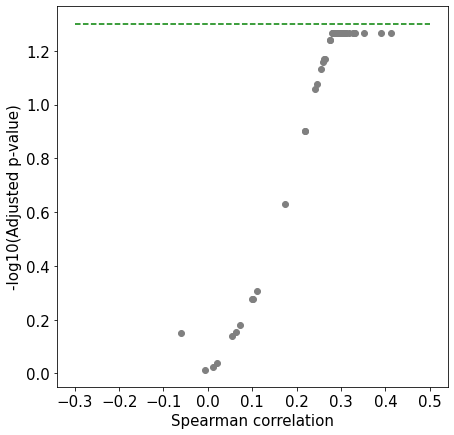

In [10]:
plt.subplots(figsize=(7,7))
plt.scatter(spear_age_res['stat'], -1*np.log10(spear_age_res['adj_pval']), c = 'grey')
plt.scatter(spear_age_res['stat'][spear_age_res['adj_pval'] < 0.05], -1*np.log10(spear_age_res['adj_pval'][spear_age_res['adj_pval'] < 0.05]), c = 'green')
#add horizontal red line at -log10(0.05)
plt.plot([-0.3,0.5], [-1*np.log10(0.05), -1*np.log10(0.05)], c='green', linestyle='--')
plt.ylabel('-log10(Adjusted p-value)', fontsize=15)
plt.xlabel('Spearman correlation', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.savefig(s_code + '/ATEM_PE_age_spearman.svg', transparent=True)
plt.show()

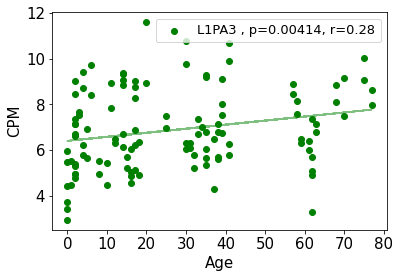

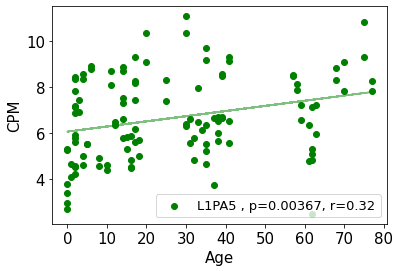

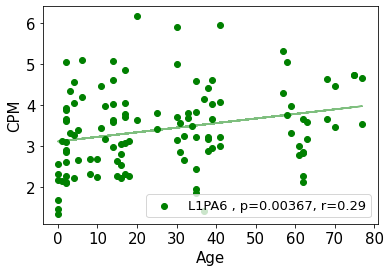

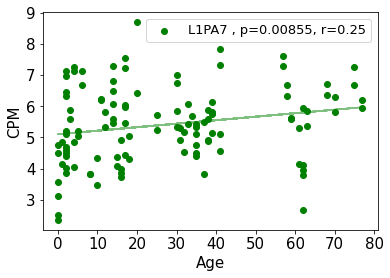

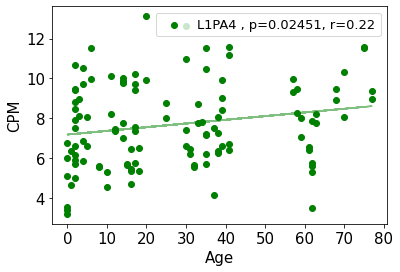

...

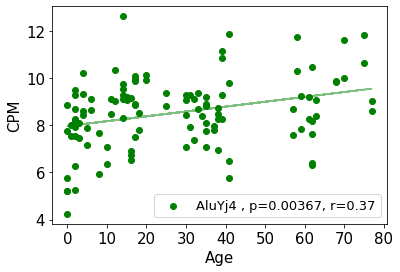

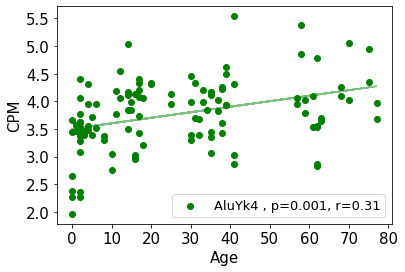

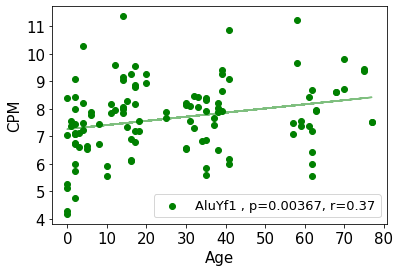

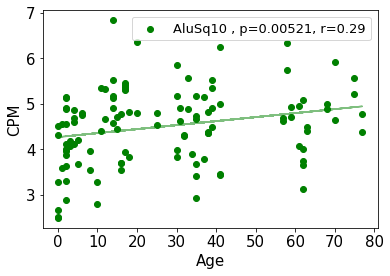

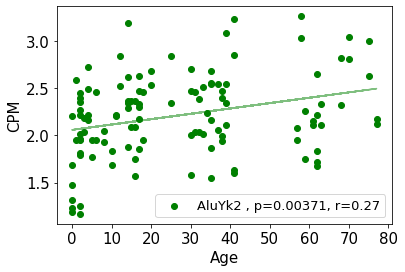

In [7]:
#Visualise up and down regulated genes with age
curr_df = sub_df[sig_v]
col = 'green'
age=age

for x,c in enumerate(curr_df.index.values):
    plt.scatter(age, curr_df.loc[c].values, alpha=1, c=col, label=c + ' , p=' + np.round(adj_p_vals[sig_v][x],5).astype(str) + ', r=' + np.round(stat[pval < 0.05][x],2).astype(str))
    slope, intercept, r_value, p_value, std_err = stats.linregress(age, curr_df.loc[c].values)
    plt.plot(age, intercept + slope*age, c=col, alpha=0.5)

    plt.legend(fontsize=13)
    plt.xlabel('Age', fontsize=15)
    plt.ylabel('CPM', fontsize=15)
    plt.yticks(fontsize=15)
    plt.xticks(fontsize=15)
    plt.savefig(s_code + '/UP_spearman_ATEM_PE_age_scatter' + str(x)+'.svg', transparent=True)
    plt.show()

In [7]:
sub_df

,1105-GABA,1105-GLU,1133-GABA,1133-GLU,1134-GABA,1134-GLU,1275-GABA,1275-GLU,1277-GABA,1277-GLU,...,Hct16HCQA020-GABA,Hct16HCQA020-GLU,Hct16HECA028-GABA,Hct16HECA028-GLU,Hct17HEIA010-GABA,Hct17HEIA010-GLU,HctYPA008-GABA,HctYPA008-GLU,HctZZNA014-GABA,HctZZNA014-GLU
element,,,,,,,,,,,,,,,,,,,,,
L1PA3,4.579008,4.861927,6.813502,7.164079,6.270729,5.773982,7.161768,5.383762,5.353712,6.785000,...,6.721069,7.359809,6.323789,6.061011,7.534372,7.653230,10.040241,9.055359,8.009993,9.112862
L1PA5,4.840751,4.471671,6.512239,6.703481,6.531751,5.589665,7.118156,4.216843,5.545047,6.329244,...,7.177103,7.809041,6.302620,6.414079,7.444615,6.921925,10.823664,9.312682,8.452987,8.563197
L1HS,3.415163,2.960319,7.186265,7.456606,4.742551,5.294321,7.239607,4.834115,4.667011,7.173703,...,5.913872,6.115683,5.552554,6.570166,4.743317,5.852120,6.134263,6.621862,6.660994,9.269083
L1PA6,2.235117,2.534184,3.165705,4.407509,2.997835,3.235661,3.663416,2.123243,2.450995,3.235094,...,3.101701,3.614187,3.144445,3.723269,3.331560,4.336628,4.734713,4.732172,3.664706,4.601754
L1PA7,3.738547,3.851378,5.598574,5.875711,5.121100,4.574555,6.982351,4.483638,4.487693,5.106338,...,5.200079,4.693304,5.842625,5.342391,5.583093,5.888194,7.261429,6.672546,5.818327,6.125386
L1PA4,4.696105,5.471769,7.271643,8.061313,6.415141,6.684627,8.804122,6.167781,5.688417,7.224083,...,7.903796,9.486640,6.601274,7.416223,8.104140,8.987447,11.512303,11.581916,8.993921,9.915180
L1PA2,2.440826,2.717891,3.708034,3.619289,3.253566,3.394272,4.164127,3.023676,2.955321,3.647787,...,3.559169,4.166535,3.293199,3.440576,3.565173,3.932315,4.654905,5.254958,3.852731,4.270027
AluJo,230.079958,241.440229,277.061432,316.665505,228.185772,241.811101,347.773877,300.241890,254.368582,345.875358,...,265.011004,306.998770,273.539245,292.556882,282.289842,281.261111,402.980948,400.212906,385.758808,397.744230
AluSx1,357.292321,383.967332,451.692307,495.274417,353.358309,365.199770,520.303535,380.497156,407.655867,548.683790,...,415.980191,496.360762,405.632501,423.719017,426.279178,418.161926,567.346076,566.714811,561.905371,603.893586


In [41]:
sub_ = spear_age_res[:7]
age_v =  [evol_age[evol_age['element']== sub_.index.values[i]]['age'].values[0] for i in range(len(sub_.index.values))]
sub_, age_v

(           stat      pval  adj_pval geneid
 L1PA3  0.277445  0.002568  0.004142  L1PA3
 L1PA5  0.315299  0.000566  0.003665  L1PA5
 L1HS   0.109276  0.242929  0.282476   L1HS
 L1PA6  0.289578  0.001616  0.003665  L1PA6
 L1PA7  0.252943  0.006154  0.008547  L1PA7
 L1PA4  0.217306  0.019120  0.024513  L1PA4
 L1PA2  0.230836  0.012666  0.016666  L1PA2,
 [0.0368212870502296,
  0.0581444366868406,
  0.0204716265953768,
  0.0754530646370229,
  0.0841126299343244,
  0.0453624897326679,
  0.0246654517798792])

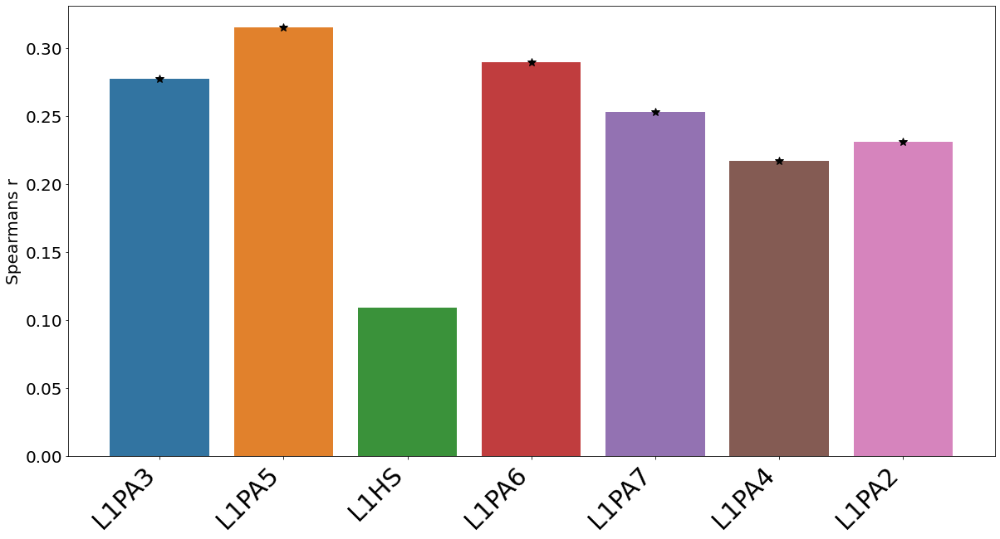

In [44]:
evol_age = pd.read_csv('/cndd3/dburrows/DATA/te/gtf/annotations/rmsk/evolutionary_age.csv')
sub_ = spear_age_res[:7]
sort_age, sort_name = adm.sort_2list(age_v, sub_.index.values)

import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=sub_, x=sub_.index, y="stat")
# add * symbol above bars with p < 0.05
plt.plot(np.where(sub_['adj_pval'] < 0.05)[0], sub_[sub_['adj_pval'] < 0.05]['stat'], '*', color='k', markersize=10)
#increase size of labels
plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('Spearmans r', fontsize=20)
plt.xticks(rotation=45, ha='right', fontsize=30)
#make yaxis log scale
#plt.yscale('log')
plt.savefig(s_code + '/ATEM_PE_LINE-spear_age_bar.svg', transparent=True)
plt.show()

In [32]:
str_arg = 'LINE'
sub_ = spear_age_res.loc[(evol_age['family'] == str_arg).values]

#pearson correlation
from scipy import stats
stat, pval = stats.pearsonr(evol_age[evol_age['family'] == str_arg]['age'].values, sub_['stat'].values)
stat,pval

(-0.5467586621361096, 0.00014853516577260985)

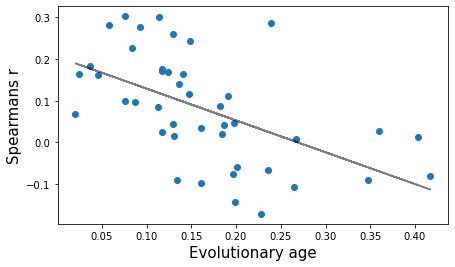

In [33]:

plt.subplots(figsize=(7,4))
plt.scatter(evol_age[evol_age['family'] == str_arg]['age'].values, sub_['stat'].values)
#fit linear regression line to data
slope, intercept, r_value, p_value, std_err = stats.linregress(evol_age[evol_age['family'] == str_arg]['age'].values, sub_['stat'].values)
#plot line
plt.plot(evol_age[evol_age['family'] == str_arg]['age'].values, intercept + slope*evol_age[evol_age['family'] == str_arg]['age'].values, c='k', alpha=0.5)
plt.xlabel('Evolutionary age', fontsize=15)
plt.ylabel('Spearmans r', fontsize=15)
plt.savefig(s_fig + '/ATEM_PE_LINE_age-spear_scatter.svg', transparent=True)
plt.show()

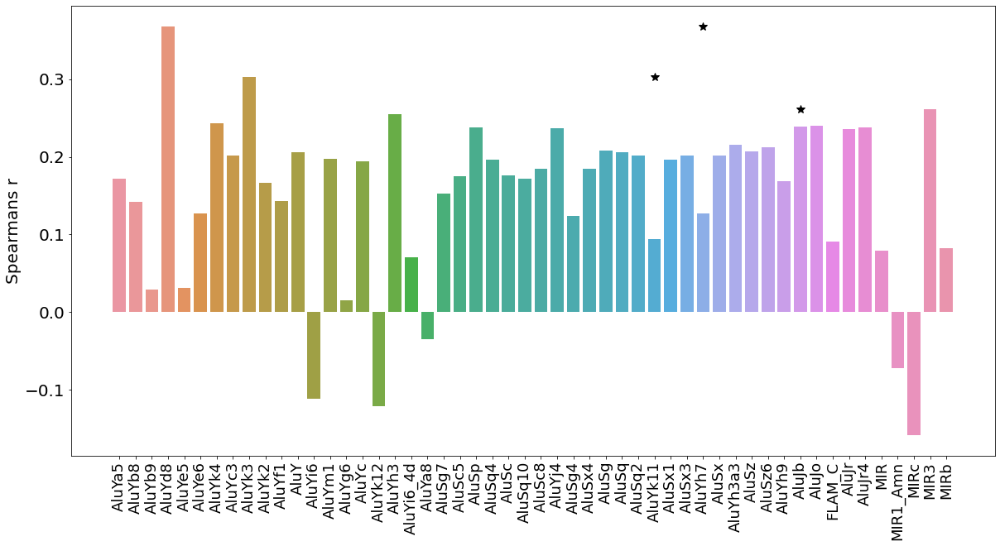

In [120]:
str_arg = 'SINE'
sub_ = spear_age_res.loc[(evol_age['family'] == str_arg).values]
sort_age, sort_name = adm.sort_2list(evol_age[evol_age['family'] == str_arg]['age'].values, evol_age[evol_age['family'] == str_arg]['element'].values)

import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=sub_, x=sub_.index, y="stat", order=sort_name)
# add * symbol above bars with p < 0.05
plt.plot(np.where(sub_['adj_pval'] < 0.05)[0], sub_[sub_['adj_pval'] < 0.05]['stat'], '*', color='k', markersize=10)
#increase size of labels
plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('Spearmans r', fontsize=20)
#make yaxis log scale
#plt.yscale('log')
plt.savefig(s_fig + '/ATEM_PE_SINE-spear_age_bar.svg', transparent=True)
plt.show()

In [49]:
1.270810e-01

0.127081

In [47]:
##############
#CELL TYPE
##############
cell_res

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
L1PA3,2067.884040,0.024842,0.039555,0.628040,5.299779e-01,6.463145e-01
L1PA5,1997.324744,-0.091320,0.045170,-2.021698,4.320755e-02,1.270810e-01
L1HS,1907.907739,0.106342,0.052295,2.033527,4.199933e-02,1.270810e-01
L1PA6,1023.818729,0.224814,0.045300,4.962811,6.948005e-07,8.685007e-06
L1PA7,1628.957492,-0.016617,0.032288,-0.514657,6.067927e-01,7.055729e-01
L1PA4,2300.432435,0.069048,0.045882,1.504881,1.323548e-01,2.363478e-01
L1PA2,1140.931074,0.065885,0.038409,1.715368,8.627777e-02,1.725555e-01
AluJo,92600.371784,0.037531,0.024541,1.529318,1.261855e-01,2.336769e-01
AluSx1,140247.035518,0.013329,0.005935,2.245847,2.471380e-02,9.505309e-02
MIR,168309.407348,-0.008955,0.052447,-0.170735,8.644322e-01,8.820737e-01


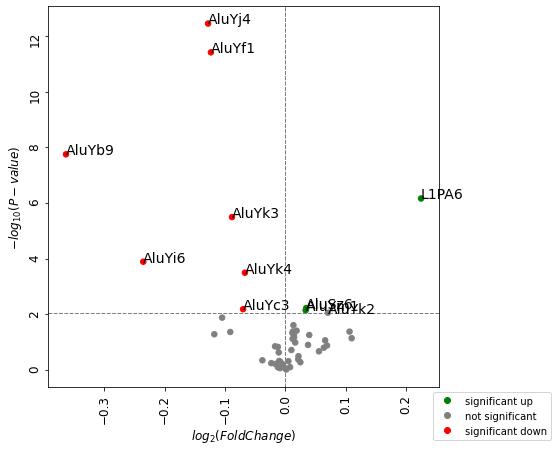

In [53]:
from bioinfokit import analys, visuz
cell_res['geneid'] = cell_res.index
normp_inadj = np.max(cell_res['pvalue'][cell_res['padj'] < 0.05])

# load dataset as pandas dataframe
visuz.GeneExpression.volcano(df=cell_res, lfc='log2FoldChange', pv='pvalue', dim = (7,7), dotsize=30, 
                             geneid = 'geneid', genenames = tuple(cell_res[cell_res['padj'] < 0.05]['geneid'].values), 
                             valpha = 1,gstyle=1, sign_line=True
                             ,plotlegend=True, legendpos='upper right',
                             legendanchor=(1.30,0), pv_thr = (normp_inadj,normp_inadj), lfc_thr=(0,0), 
                             axtickfontsize=12, axlabelfontsize=12, gfont=14, figtype='svg', figname=s_code + '/ATEM_PE_celltype', show=True)
                            

In [123]:
cell_res

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
L1PA3,684.236024,0.067732,0.039471,1.715975,0.086167,0.224684
L1PA5,739.871915,-0.172809,0.045423,-3.804405,0.000142,0.001125
L1HS,1301.311557,-0.005254,0.063207,-0.083121,0.933755,0.953836
L1PA6,374.712410,-0.026022,0.057357,-0.453691,0.650051,0.735177
L1PA7,472.124195,0.029912,0.038203,0.782974,0.433642,0.614130
...,...,...,...,...,...,...
AluYk12,67.902751,-0.140173,0.132774,-1.055727,0.291093,0.515683
FLAM_C,3.004916,0.335055,0.235850,1.420627,0.155425,0.355006
MIR1_Amn,4.336755,-0.010088,0.196893,-0.051236,0.959137,0.959137
AluYh7,31.173214,-0.434702,0.252837,-1.719295,0.085561,0.224684


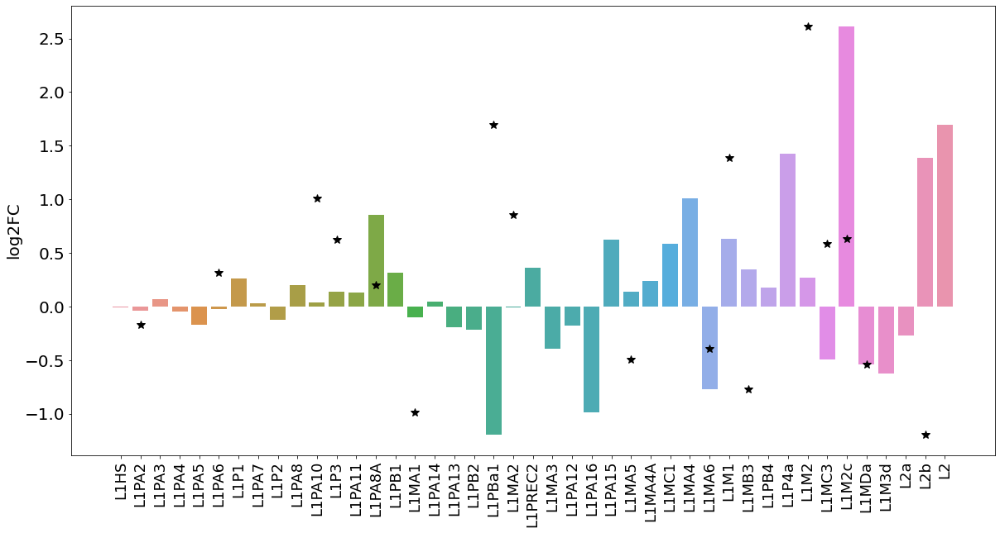

In [132]:
str_arg = 'LINE'
sub_ = cell_res.loc[(evol_age['family'] == str_arg).values]
sort_age, sort_name = adm.sort_2list(evol_age[evol_age['family'] == str_arg]['age'].values, evol_age[evol_age['family'] == str_arg]['element'].values)

import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=sub_, x=sub_.index, y="log2FoldChange", order=sort_name)
# add * symbol above bars with p < 0.05
plt.plot(np.where(sub_['padj'] < 0.05)[0], sub_[sub_['padj'] < 0.05]['log2FoldChange'], '*', color='k', markersize=10)
#increase size of labels
plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('log2FC', fontsize=20)
#make yaxis log scale
#plt.yscale('log')
#add colorbar
plt.savefig(s_fig + '/ATEM_PE_LINE_celltype_bar.svg', transparent=True)
plt.show()

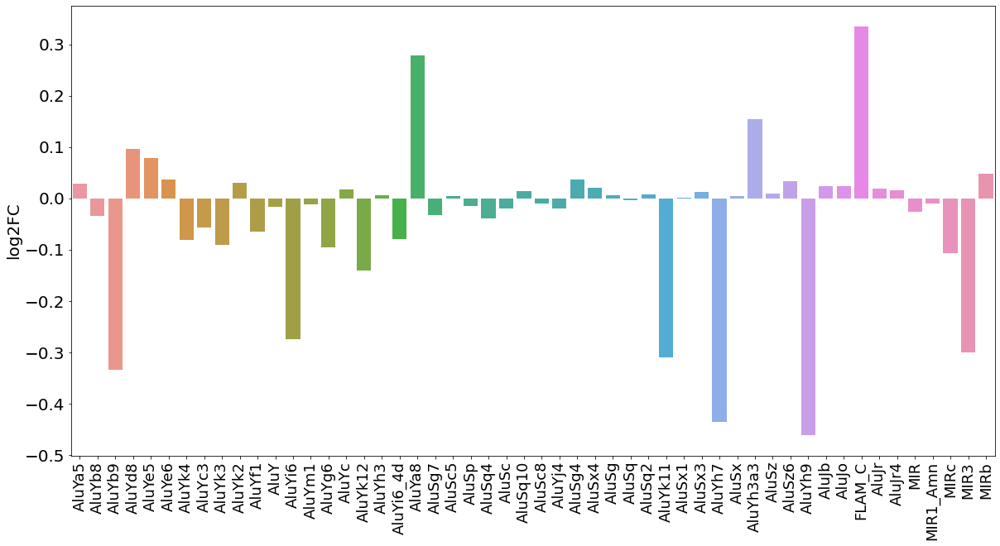

In [133]:
str_arg = 'SINE'
sub_ = cell_res.loc[(evol_age['family'] == str_arg).values]
sort_age, sort_name = adm.sort_2list(evol_age[evol_age['family'] == str_arg]['age'].values, evol_age[evol_age['family'] == str_arg]['element'].values)

import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=sub_, x=sub_.index, y="log2FoldChange", order=sort_name)
# add * symbol above bars with p < 0.05
#plt.plot(np.where(sub_['padj'] < 0.05)[0], sub_[sub_['padj'] < 0.05]['log2FoldChange'], '*', color='k', markersize=10)
#increase size of labels
plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('log2FC', fontsize=20)
#make yaxis log scale
#plt.yscale('log')
#add colorbar
plt.savefig(s_fig + '/ATEM_PE_SINE_celltype_bar.svg', transparent=True)
plt.show()

In [56]:
sub_ = spear_age_res[:7]
age_v =  [evol_age[evol_age['element']== sub_.index.values[i]]['age'].values[0] for i in range(len(sub_.index.values))]
sub_, age_v

(           stat      pval  adj_pval geneid
 L1PA3  0.277445  0.002568  0.004142  L1PA3
 L1PA5  0.315299  0.000566  0.003665  L1PA5
 L1HS   0.109276  0.242929  0.282476   L1HS
 L1PA6  0.289578  0.001616  0.003665  L1PA6
 L1PA7  0.252943  0.006154  0.008547  L1PA7
 L1PA4  0.217306  0.019120  0.024513  L1PA4
 L1PA2  0.230836  0.012666  0.016666  L1PA2,
 [0.0368212870502296,
  0.0581444366868406,
  0.0204716265953768,
  0.0754530646370229,
  0.0841126299343244,
  0.0453624897326679,
  0.0246654517798792])

In [58]:
cell_res[:7]

,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj,geneid
L1PA3,2067.884040,0.024842,0.039555,0.628040,5.299779e-01,0.646314,L1PA3
L1PA5,1997.324744,-0.091320,0.045170,-2.021698,4.320755e-02,0.127081,L1PA5
L1HS,1907.907739,0.106342,0.052295,2.033527,4.199933e-02,0.127081,L1HS
L1PA6,1023.818729,0.224814,0.045300,4.962811,6.948005e-07,0.000009,L1PA6
L1PA7,1628.957492,-0.016617,0.032288,-0.514657,6.067927e-01,0.705573,L1PA7
L1PA4,2300.432435,0.069048,0.045882,1.504881,1.323548e-01,0.236348,L1PA4
L1PA2,1140.931074,0.065885,0.038409,1.715368,8.627777e-02,0.172556,L1PA2


In [63]:
#Filter low CPM data
cpm_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DESEQ/ATEM_CPM.csv', index_col=0)
ind = np.mean(cpm_df, axis=1) >2 #indeces of ones to keep
cpm_df = cpm_df.loc[ind]
df = cpm_df[:7]
df

,1105-GABA,1105-GLU,1133-GABA,1133-GLU,1134-GABA,1134-GLU,1275-GABA,1275-GLU,1277-GABA,1277-GLU,...,Hct16HCQA020-GABA,Hct16HCQA020-GLU,Hct16HECA028-GABA,Hct16HECA028-GLU,Hct17HEIA010-GABA,Hct17HEIA010-GLU,HctYPA008-GABA,HctYPA008-GLU,HctZZNA014-GABA,HctZZNA014-GLU
element,,,,,,,,,,,,,,,,,,,,,
L1PA3,4.579008,4.861927,6.813502,7.164079,6.270729,5.773982,7.161768,5.383762,5.353712,6.785000,...,6.721069,7.359809,6.323789,6.061011,7.534372,7.653230,10.040241,9.055359,8.009993,9.112862
L1PA5,4.840751,4.471671,6.512239,6.703481,6.531751,5.589665,7.118156,4.216843,5.545047,6.329244,...,7.177103,7.809041,6.302620,6.414079,7.444615,6.921925,10.823664,9.312682,8.452987,8.563197
L1HS,3.415163,2.960319,7.186265,7.456606,4.742551,5.294321,7.239607,4.834115,4.667011,7.173703,...,5.913872,6.115683,5.552554,6.570166,4.743317,5.852120,6.134263,6.621862,6.660994,9.269083
L1PA6,2.235117,2.534184,3.165705,4.407509,2.997835,3.235661,3.663416,2.123243,2.450995,3.235094,...,3.101701,3.614187,3.144445,3.723269,3.331560,4.336628,4.734713,4.732172,3.664706,4.601754
L1PA7,3.738547,3.851378,5.598574,5.875711,5.121100,4.574555,6.982351,4.483638,4.487693,5.106338,...,5.200079,4.693304,5.842625,5.342391,5.583093,5.888194,7.261429,6.672546,5.818327,6.125386
L1PA4,4.696105,5.471769,7.271643,8.061313,6.415141,6.684627,8.804122,6.167781,5.688417,7.224083,...,7.903796,9.486640,6.601274,7.416223,8.104140,8.987447,11.512303,11.581916,8.993921,9.915180
L1PA2,2.440826,2.717891,3.708034,3.619289,3.253566,3.394272,4.164127,3.023676,2.955321,3.647787,...,3.559169,4.166535,3.293199,3.440576,3.565173,3.932315,4.654905,5.254958,3.852731,4.270027


In [65]:
gaba_ind = [i for i,x in enumerate(df.columns) if 'GABA' in x]
glu_ind = [i for i,x in enumerate(df.columns) if 'GLU' in x]
df_gaba = df.iloc[:,gaba_ind]
df_glu = df.iloc[:,glu_ind]
cell_cols = [df.columns[i].split('-')[-1] for i in range(len(df.columns))]

cell_df = {'element': [], 'celltype': [], 'cpm': []}
for i in range(len(df)):
    cell_df['element'] = np.append(cell_df['element'],np.full((df.shape[1]),df.index[i]))
    cell_df['celltype'] = np.append(cell_df['celltype'],cell_cols)
    cell_df['cpm'] = np.append(cell_df['cpm'],df.iloc[i,:].values)
cell_df = pd.DataFrame(cell_df)
cell_df

,element,celltype,cpm
0,L1PA3,GABA,4.579008
1,L1PA3,GLU,4.861927
2,L1PA3,GABA,6.813502
3,L1PA3,GLU,7.164079
4,L1PA3,GABA,6.270729
...,...,...,...
807,L1PA2,GLU,3.932315
808,L1PA2,GABA,4.654905
809,L1PA2,GLU,5.254958
810,L1PA2,GABA,3.852731


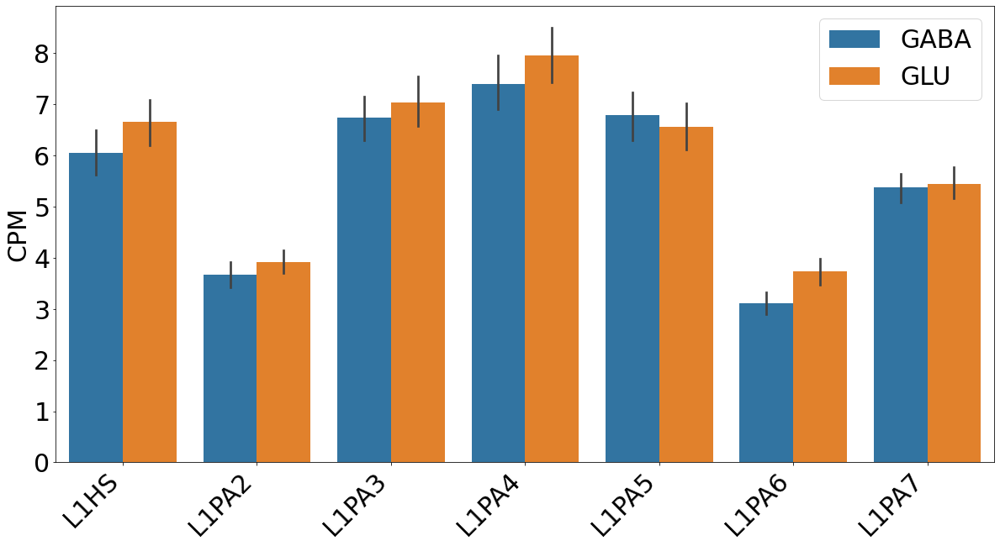

In [73]:
#plot cell_df as a dot plot of elements x GLU vs GABA
import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=cell_df, x='element', y="cpm", hue = 'celltype', order=sort_name)

plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('CPM', fontsize=30)
plt.legend(fontsize=30)
plt.xticks(rotation=45, ha='right', fontsize=30)
plt.yticks(fontsize=30)

#make yaxis log scale
#plt.yscale('log')
#add colorbar
plt.savefig(s_code + '/ATEM_PE_SINE_celltype_bar.svg', transparent=True)
plt.show()

In [4]:
#Filter low CPM data
cpm_df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DESEQ/ATEM_CPM.csv', index_col=0)
ind = np.mean(cpm_df, axis=1) >2 #indeces of ones to keep
cpm_df = cpm_df.loc[ind]
df = cpm_df[7:]
df

,1105-GABA,1105-GLU,1133-GABA,1133-GLU,1134-GABA,1134-GLU,1275-GABA,1275-GLU,1277-GABA,1277-GLU,...,Hct16HCQA020-GABA,Hct16HCQA020-GLU,Hct16HECA028-GABA,Hct16HECA028-GLU,Hct17HEIA010-GABA,Hct17HEIA010-GLU,HctYPA008-GABA,HctYPA008-GLU,HctZZNA014-GABA,HctZZNA014-GLU
element,,,,,,,,,,,,,,,,,,,,,
AluJo,230.079958,241.440229,277.061432,316.665505,228.185772,241.811101,347.773877,300.241890,254.368582,345.875358,...,265.011004,306.998770,273.539245,292.556882,282.289842,281.261111,402.980948,400.212906,385.758808,397.744230
AluSx1,357.292321,383.967332,451.692307,495.274417,353.358309,365.199770,520.303535,380.497156,407.655867,548.683790,...,415.980191,496.360762,405.632501,423.719017,426.279178,418.161926,567.346076,566.714811,561.905371,603.893586
MIR,475.514710,482.988859,574.156729,588.164591,712.353283,601.250497,659.596460,534.080943,503.796282,567.331884,...,401.946460,365.200994,491.678198,517.077252,602.356530,588.359725,464.343622,478.888868,604.289604,607.655935
AluSz,344.999970,370.014356,437.975527,485.549308,349.132338,357.612462,522.012414,384.705751,393.696585,540.467630,...,401.806238,465.594586,398.758981,416.363629,423.055015,419.613619,551.070626,556.688626,546.139119,588.476689
AluSx3,78.695188,83.257965,99.511182,110.205966,78.278845,80.799371,115.385948,79.747738,89.542722,121.246697,...,89.794301,104.124615,86.810758,90.442057,94.670434,93.381594,122.298614,124.866398,119.530770,130.501464
AluY,310.994470,327.515276,398.991908,428.456587,304.773509,308.191968,429.811835,342.454636,349.082206,448.989588,...,362.711925,439.605471,334.037080,340.243542,365.646375,359.232157,487.139070,495.350719,483.436748,516.689488
AluJb,445.850665,466.561220,554.604692,620.337048,457.655914,467.725397,696.549525,584.061904,489.656380,668.207400,...,529.746755,600.828915,535.087785,563.024716,561.892428,565.346819,782.438364,771.035632,751.151671,783.708169
AluJr4,65.708615,68.495966,81.322882,92.558425,76.113168,73.497530,102.558251,87.742024,74.651255,98.279610,...,76.877259,81.599540,79.793715,83.338450,87.153689,88.720495,119.833100,119.819905,109.437356,108.660675
AluYb8,24.636943,23.194895,35.788677,33.014905,21.804353,24.343045,33.504521,30.504177,24.732793,29.168350,...,21.485251,21.342286,25.748230,25.908814,28.510413,28.147803,25.316960,24.098502,28.490077,33.295473


In [5]:
gaba_ind = [i for i,x in enumerate(df.columns) if 'GABA' in x]
glu_ind = [i for i,x in enumerate(df.columns) if 'GLU' in x]
df_gaba = df.iloc[:,gaba_ind]
df_glu = df.iloc[:,glu_ind]
cell_cols = [df.columns[i].split('-')[-1] for i in range(len(df.columns))]

cell_df = {'element': [], 'celltype': [], 'cpm': []}
for i in range(len(df)):
    cell_df['element'] = np.append(cell_df['element'],np.full((df.shape[1]),df.index[i]))
    cell_df['celltype'] = np.append(cell_df['celltype'],cell_cols)
    cell_df['cpm'] = np.append(cell_df['cpm'],df.iloc[i,:].values)
cell_df = pd.DataFrame(cell_df)
cell_df

,element,celltype,cpm
0,AluJo,GABA,230.079958
1,AluJo,GLU,241.440229
2,AluJo,GABA,277.061432
3,AluJo,GLU,316.665505
4,AluJo,GABA,228.185772
...,...,...,...
4983,MIR1_Amn,GLU,2.579479
4984,MIR1_Amn,GABA,2.430716
4985,MIR1_Amn,GLU,2.412086
4986,MIR1_Amn,GABA,2.705748


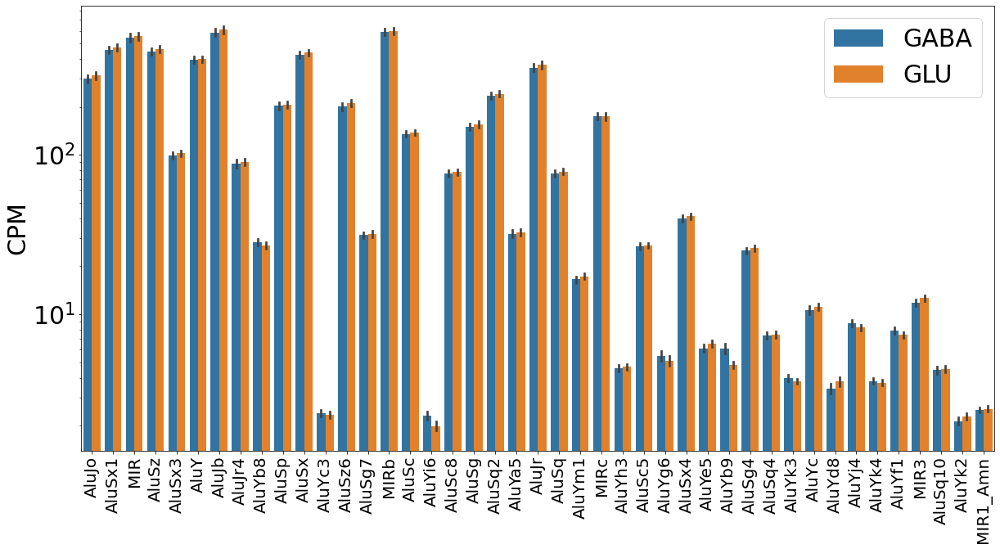

In [6]:
#plot cell_df as a dot plot of elements x GLU vs GABA
import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=cell_df, x='element', y="cpm", hue = 'celltype')

plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('CPM', fontsize=30)
plt.legend(fontsize=30)
plt.xticks(fontsize=20)
plt.yticks(fontsize=30)

#make yaxis log scale
plt.yscale('log')
#add colorbar
plt.savefig(s_code + '/ATEM_PE_SINE_celltype_bar.svg', transparent=True)
plt.show()

In [77]:
#Compare CPMs across cell types for each class

# Do  a scatterplot for each class, separating by cell type

# LINE
str_arg = 'LINE'
sort_age, sort_name = adm.sort_2list(evol_age[evol_age['family'] == str_arg]['age'].values, evol_age[evol_age['family'] == str_arg]['element'].values)

gaba_ind = [i for i,x in enumerate(df.columns) if 'GABA' in x]
glu_ind = [i for i,x in enumerate(df.columns) if 'GLU' in x]
df_gaba = df.iloc[:,gaba_ind]
df_glu = df.iloc[:,glu_ind]
cell_cols = [df.columns[i].split('-')[-1] for i in range(len(df.columns))]

cell_df = {'element': [], 'celltype': [], 'cpm': []}
for i in range(len(df)):
    cell_df['element'] = np.append(cell_df['element'],np.full((df.shape[1]),df.index[i]))
    cell_df['celltype'] = np.append(cell_df['celltype'],cell_cols)
    cell_df['cpm'] = np.append(cell_df['cpm'],df.iloc[i,:].values)
cell_df = pd.DataFrame(cell_df)

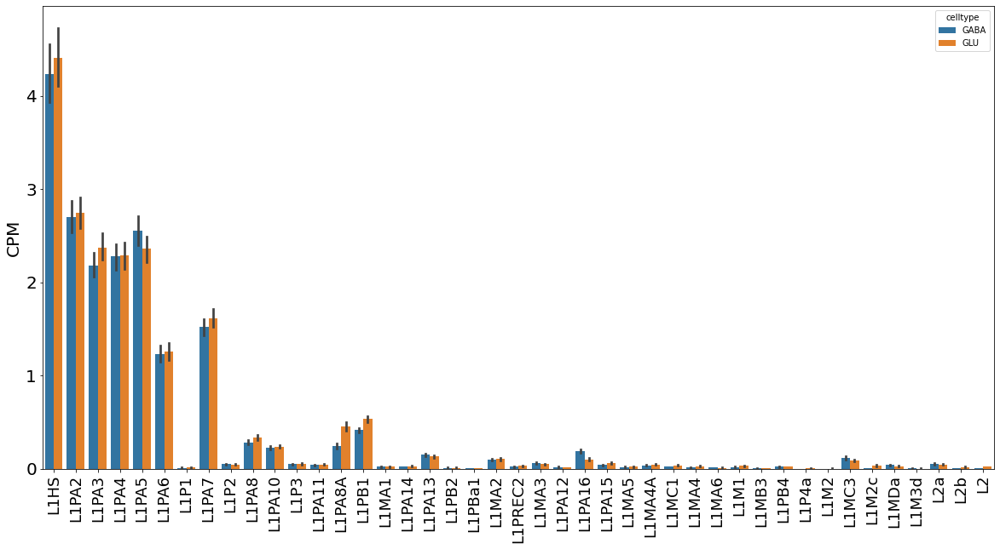

In [81]:
#plot cell_df as a dot plot of elements x GLU vs GABA
import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=cell_df, x='element', y="cpm", hue = 'celltype', order=sort_name)

plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('CPM', fontsize=20)
#make yaxis log scale
#plt.yscale('log')
#add colorbar
#plt.savefig(s_fig + '/ATEM_PE_SINE_celltype_bar.svg', transparent=True)
plt.show()

In [82]:
#Compare CPMs across cell types for each class

# Do  a scatterplot for each class, separating by cell type

# LINE
str_arg = 'SINE'
sort_age, sort_name = adm.sort_2list(evol_age[evol_age['family'] == str_arg]['age'].values, evol_age[evol_age['family'] == str_arg]['element'].values)

gaba_ind = [i for i,x in enumerate(df.columns) if 'GABA' in x]
glu_ind = [i for i,x in enumerate(df.columns) if 'GLU' in x]
df_gaba = df.iloc[:,gaba_ind]
df_glu = df.iloc[:,glu_ind]
cell_cols = [df.columns[i].split('-')[-1] for i in range(len(df.columns))]

cell_df = {'element': [], 'celltype': [], 'cpm': []}
for i in range(len(df)):
    cell_df['element'] = np.append(cell_df['element'],np.full((df.shape[1]),df.index[i]))
    cell_df['celltype'] = np.append(cell_df['celltype'],cell_cols)
    cell_df['cpm'] = np.append(cell_df['cpm'],df.iloc[i,:].values)
cell_df = pd.DataFrame(cell_df)

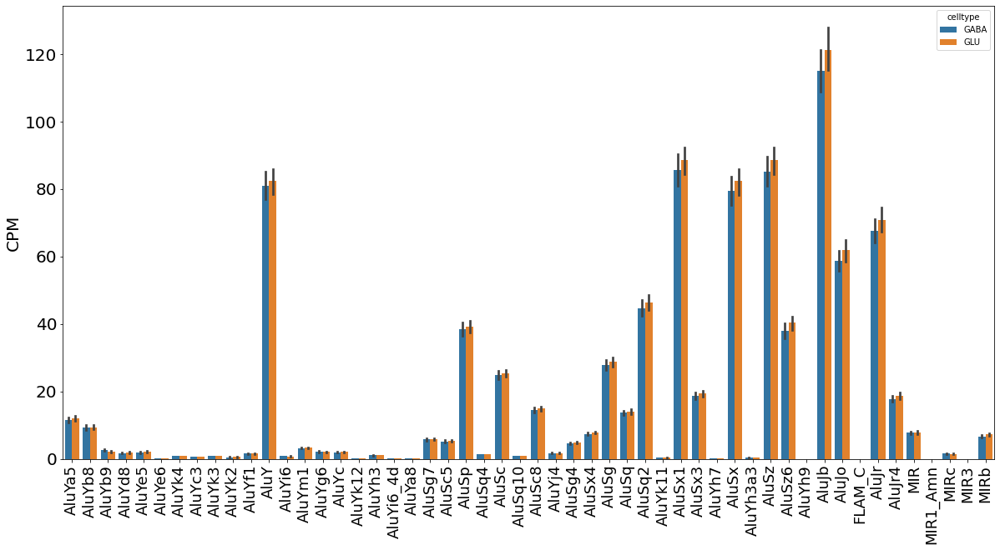

In [83]:
#plot cell_df as a dot plot of elements x GLU vs GABA
import seaborn as sns
fig,ax = plt.subplots(figsize=(20,10))
sns.barplot(data=cell_df, x='element', y="cpm", hue = 'celltype', order=sort_name)

plt.xticks(fontsize=18, rotation=90)
plt.yticks(fontsize=20)
#remove xlabel
plt.xlabel('')
plt.ylabel('CPM', fontsize=20)
#make yaxis log scale
#plt.yscale('log')
#add colorbar
#plt.savefig(s_fig + '/ATEM_PE_SINE_celltype_bar.svg', transparent=True)
plt.show()

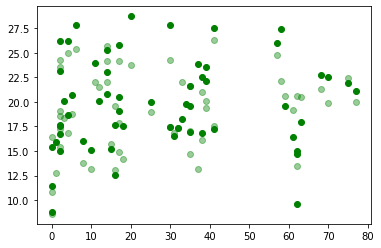

In [149]:
line = ev_df['family'] == 'LINE'
line_df = glu_df.loc[line.values]
sine = ev_df['family'] == 'SINE'
sine_df = glu_df.loc[sine.values]

plt.scatter(glu_age, np.sum(line_df).values, alpha=1, c='green', label='GLU LINE')
#plt.scatter(glu_age, np.sum(sine_df).values, alpha=1, c='blue', label='GLU SINE')

line_df = gaba_df.loc[line.values]
sine_df = gaba_df.loc[sine.values]
plt.scatter(gaba_age, np.sum(line_df).values, alpha=0.4, c='green', label='GABA LINE')
#plt.scatter(gaba_age, np.sum(sine_df).values, alpha=0.4, c='blue', label='GABA SINE')

plt.show()

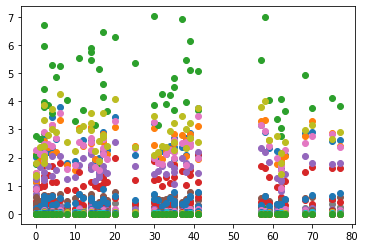

In [150]:
line = ev_df['family'] == 'LINE'
curr_df = glu_df.loc[line.values]
curr_age = glu_age

for i in range(len(curr_df)):
    plt.scatter(curr_age, curr_df.iloc[i].values, alpha=1)
plt.show()

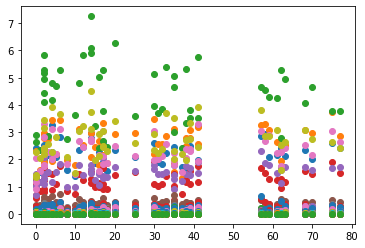

In [151]:
line = ev_df['family'] == 'LINE'
curr_df = gaba_df.loc[line.values]
curr_age = gaba_age
for i in range(len(curr_df)):
    plt.scatter(curr_age, curr_df.iloc[i].values, alpha=1)
plt.show()

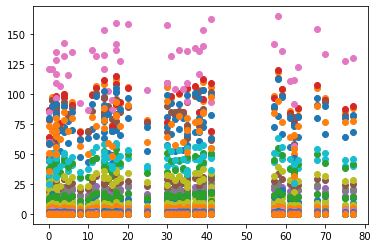

In [152]:
line = ev_df['family'] == 'SINE'
curr_df = glu_df.loc[line.values]
curr_age = glu_age

for i in range(len(curr_df)):
    plt.scatter(curr_age, curr_df.iloc[i].values, alpha=1)
plt.show()

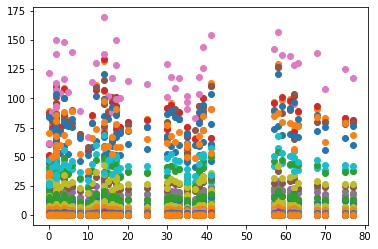

In [153]:
line = ev_df['family'] == 'SINE'
curr_df = gaba_df.loc[line.values]
curr_age = gaba_age
for i in range(len(curr_df)):
    plt.scatter(curr_age, curr_df.iloc[i].values, alpha=1)
plt.show()

# CZI single cell
* should i just do normal DE Wilcoxon across two groups?
* check that youre using DESEQ correctly

In [421]:
# Metadata
meta = pd.read_csv('/cndd3/dburrows/DATA/te/metadata/CZI/CZI-metadata.csv')
ev_df = pd.read_csv('/cndd3/dburrows/DATA/te/annotations/rmsk/evolutionary_age.csv')
meta

,sequencing_id,sample,donor,chunk,ncells_pass_qc,Sample ID,NOTES,Brain bank ID,Priority,Status of tissue sample,...,RIN (from brain bank docs),RIN (remeasured on our samples),Brain hemisphere (received),Brain Hemisphere (requested),Brain Region,Clinical Brain Diagnosis,Race,Received Format,Ground Quantity,Unnamed: 28
0,CZI1,OF1A,OF1,A,NaN,OF1,NaN,3543,6,arrived 9-9-20,...,7.5,6.6,Right,Right,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,Coronal section in bag,"A = 0.210g, 2 tubes (A.1>A.2) ; B = 0.200, 2 t...",NaN
1,CZI2,OM1A,OM1,A,NaN,OM1,NaN,3805,1,arrived 9-9-20,...,8.9,4.8,Left,Right,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,Coronal section in bag,"A = 0.1170g, 1 tubes ; B = 0.120, 1 tube",NaN
2,CZI3,OM2A,OM2,A,NaN,OM2,NaN,4634,5,arrived 9-9-20,...,8.4,2.0,Left,Right,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,Coronal section in bag,"A = 0.2840, 2 tubes (A.1 & A.2), A = 0.2863",NaN
3,CZI4,OF1A,OF1,A,NaN,OF1,NaN,3543,6,arrived 9-9-20,...,7.5,6.6,Right,Right,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,Coronal section in bag,"A = 0.210g, 2 tubes (A.1>A.2) ; B = 0.200, 2 t...",NaN
4,CZI5,OF1B,OF1,B,NaN,OF1,NaN,3543,6,arrived 9-9-20,...,7.5,6.6,Right,Right,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,Coronal section in bag,"A = 0.210g, 2 tubes (A.1>A.2) ; B = 0.200, 2 t...",NaN
5,CZI6,YF1A,YF1,A,NaN,YF1,NaN,13019,11,received,...,8.1,7.0,Unknown,Right,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,"2 chunks, 2 separate tubes","A = 0.1703, 1 tube ; B = 0.1746, 1 tube",NaN
6,CZI7,YM1A,YM1,A,NaN,YM1,YM1a ran out of tissue,13237,7,received,...,6.6,7.4,Unknown,NaN,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,"2 chunks, 2 separate tubes","A = 0.1195, 1 tube ; B = 0.1244, 1 tube",NaN
7,CZI8,YM1B,YM1,B,NaN,YM1,YM1a ran out of tissue,13237,7,received,...,6.6,7.4,Unknown,NaN,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,"2 chunks, 2 separate tubes","A = 0.1195, 1 tube ; B = 0.1244, 1 tube",NaN
8,CZI9,YM3B,YM3,B,NaN,YM3,NaN,5679,9,arrived 9-9-20,...,8.7,8.6,Right,Right,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,Coronal section in bag,"A = 0.13g, 1 tube ; B = 0.15g, 1 tube",NaN
9,CZI10,YF2B,YF2,B,NaN,YF2,NaN,13260,10,received,...,8.0,7.4,Unknown,NaN,Dorsolateral Prefrontal cortex (Brodmann area 46),Unaffected Control,White,"2 chunks, 2 separate tubes","A = 0.1319, 1 tube ; B = 0.1308",NaN


In [487]:
#Find all those with > 1CPM expression or 50 for Alu
df = pd.read_csv('/cndd/dburrows/DATA/te/rna/PE.counts/DE/ATEM_CPM.csv', index_col=0)
meta = pd.read_csv('//cndd3/dburrows/DATA/te/metadata/PE/PEC_RNAmeta.csv')

#Filter low CPM data
thresh = 1
ind = np.mean(df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]
sub1 = sub_df.index.values
sub1 = [i  for i in sub1 if 'Alu' not in i]

thresh = 50
ind = np.mean(df, axis=1) >thresh #indeces of ones to keep
sub_df = df.loc[ind]
sub_te = np.append(sub_df.index.values,sub1)
sub_te

array(['AluSp', 'AluJo', 'AluJr', 'AluSx', 'AluSz6', 'AluSc', 'AluSz',
       'AluY', 'AluSx3', 'AluSq', 'AluJb', 'AluSq2', 'AluSg', 'AluJr4',
       'AluSx1', 'AluSc8', 'L1PA6', 'L1PA4', 'L1PA7', 'L1PA2', 'L1PA5',
       'L1PA8A', 'L1PA8', 'L1PA10', 'L1PA3', 'L1HS', 'FLAM_C', 'SVA_D',
       'SVA_F', 'SVA_B', 'SVA_E', 'SVA_C', 'SVA_A'], dtype=object)

In [422]:
dm = meta[['sequencing_id', 'donor', 'Subject Sex', 'Subject Age']]
age_ = dm['Subject Age'].values

age_ = age_.astype('object')
less = np.where(age_ < 50)[0]
more = np.where(age_ >= 50)[0]
age_[less] ='Y'
age_[more] = 'O'
age_

array(['O', 'O', 'O', 'O', 'O', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y', 'Y',
       'O', 'O', 'O', 'O', 'O', 'Y', 'Y', 'Y', 'O', 'O'], dtype=object)

In [424]:
#Make design matrix
dm = meta[['sequencing_id', 'donor', 'Subject Sex', 'Subject Age']]
age_ = dm['Subject Age'].values

age_ = age_.astype('object')
less = np.where(age_ < 50)[0]
more = np.where(age_ >= 50)[0]
age_[less] ='Y'
age_[more] = 'O'
dm['Subject Age'] = age_
# new_age = (age_ - np.mean(age_))/np.std(age_)
# dm['age_stand'] = new_age
dm = dm.drop([0,2,5,6,13])
dm.to_csv('/cndd3/dburrows/DATA/te/rna/CZI.counts/DESEQ/ATEM_design.csv')
dm

/tmp/ipykernel_1405454/2521802042.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  dm['Subject Age'] = age_


,sequencing_id,donor,Subject Sex,Subject Age
1,CZI2,OM1,Male,O
3,CZI4,OF1,Female,O
4,CZI5,OF1,Female,O
7,CZI8,YM1,Male,Y
8,CZI9,YM3,Male,Y
9,CZI10,YF2,Female,Y
10,CZI11,YM2,Male,Y
11,CZI12,YM3,Male,Y
12,CZI13,YF1,Female,Y
14,CZI15,OF2,Female,O


In [488]:
#Find all unique cell types
cell_l = []
os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/ATEM/pseudobulk/')
samp_l = glob.glob('*CZI*')
for s in samp_l:
    os.chdir(s)
    cell_l = np.append(cell_l,[glob.glob('*ATEM*')[i].split('.')[0] for i in range(len(glob.glob('*ATEM*')))])
    os.chdir('..')
unq_cell = np.unique(cell_l)
unq_cell

array(['CGE_ADARB2_ADAM33', 'CGE_LAMP5', 'CGE_LAMP5_LHX6', 'CGE_PAX6',
       'CGE_VIP', 'Glia_Astro', 'Glia_Oligo', 'L2-4IT_CUX2',
       'L3-5IT_RORB_PLCH1', 'L4-5IT_RORB_ARHGAP15', 'L4-5IT_RORB_LRRK1',
       'L4-5IT_RORB_TSHZ2', 'L56NP_TLE4_TSHZ2', 'L6', 'L6IT_THEMIS_CUX1',
       'L6IT_THEMIS_LINC00343', 'MGE_PVALB', 'MGE_SST', 'MGE_SST_CLMP'],
      dtype='<U32')

In [504]:
#Make gene x sample matrix for each cell type for DESEQ
os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/ATEM/pseudobulk/')
samp_l = dm['sequencing_id'].values
mode='Count'
for cell in unq_cell:
    te = sub_te #include those with CPMs > 1
    dict = {'element':te}
    for s in samp_l:
        os.chdir(glob.glob('*' + s + '_*')[0])
        curr_cell = glob.glob(cell + '.*ATEM*')
        if len(curr_cell)!=0:
            te_v = ter.load_ATEM_family(curr_cell[0], te, mode)

        else:
            te_v = np.zeros(len(te))

        assert len(te) == len(te_v), 'Error: Not all TE elements were counted'
        #Add to dict
        dict[s] = te_v

        #if len(curr_cell) == 0:
        os.chdir('..')
    df = pd.DataFrame(dict)
    #set first column to index
    df.set_index('element', inplace=True)
    df = df.astype(int)
    df+=1
    l1_df = df.iloc[16:26]
    l1_df.to_csv('/cndd3/dburrows/DATA/te/rna/CZI.counts/DESEQ/' + cell + '_' + mode + 'L1.ATEM.csv')
    alu_df = df.iloc[:16]
    alu_df.to_csv('/cndd3/dburrows/DATA/te/rna/CZI.counts/DESEQ/' + cell + '_' + mode + 'ALU.ATEM.csv')
    sva_df = df.iloc[27:]
    sva_df.to_csv('/cndd3/dburrows/DATA/te/rna/CZI.counts/DESEQ/' + cell + '_' + mode + 'SVA.ATEM.csv')
    

In [515]:
#put all LFC and padj into a dataframe for cells x TEs 
def heatmat(string, factor):
    os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/DESEQ/')

    heat_line, heat_sine, heat_sva = pd.DataFrame(), pd.DataFrame(), pd.DataFrame()
    for cell in unq_cell:
        LINE_df = pd.read_csv(cell + '_CountL1..DESEQ_' + factor + '.csv')
        heat_line[cell] = LINE_df[string].values

        SINE_df = pd.read_csv(cell + '_CountALU..DESEQ_' + factor + '.csv')
        heat_sine[cell] = SINE_df[string].values

        SVA_df = pd.read_csv(cell + '_CountSVA..DESEQ_' + factor + '.csv')
        heat_sva[cell] = SVA_df[string].values

    heat_line = heat_line.T
    heat_sine = heat_sine.T
    heat_sva = heat_sva.T
    return heat_line, heat_sine, heat_sva

In [516]:
#EFFECT OF AGE
line_lfc, sine_lfc, sva_lfc = heatmat('log2FoldChange', 'age')
line_padj, sine_padj, sva_padj = heatmat('padj', 'age')

In [521]:
l1_df.index

Index(['L1PA6', 'L1PA4', 'L1PA7', 'L1PA2', 'L1PA5', 'L1PA8A', 'L1PA8',
       'L1PA10', 'L1PA3', 'L1HS'],
      dtype='object', name='element')

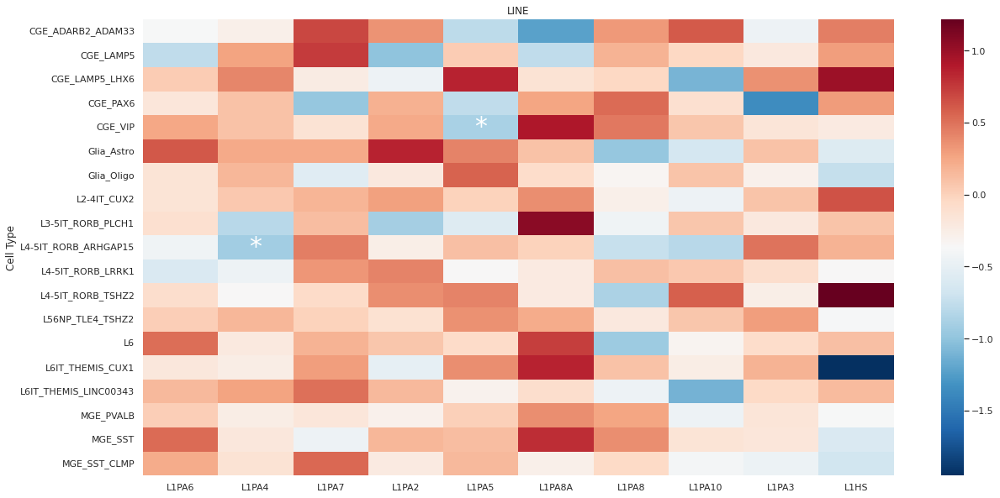

In [532]:
#OLD VS YOUNG
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(line_lfc*-1, cmap='RdBu_r', ax=ax, xticklabels=l1_df.index.values)
#add * symbol to indicate significance
for i in range(len(line_lfc)):
    for j in range(len(line_lfc.columns)):
        if line_padj.iloc[i,j] < 0.05:
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('LINE')
ax.set_ylabel('Cell Type')
#label x ticks with list of strings
plt.show()

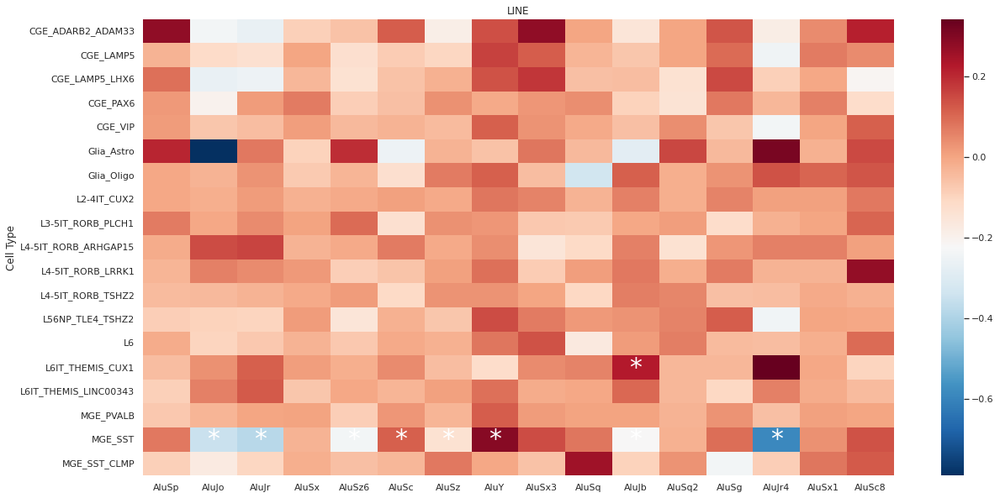

In [534]:
#OLD VS YOUNG
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(sine_lfc*-1, cmap='RdBu_r', ax=ax, xticklabels=alu_df.index.values)
#add * symbol to indicate significance
for i in range(len(sine_lfc)):
    for j in range(len(sine_lfc.columns)):
        if sine_padj.iloc[i,j] < 0.05:
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('LINE')
ax.set_ylabel('Cell Type')
#label x ticks with list of strings
plt.show()

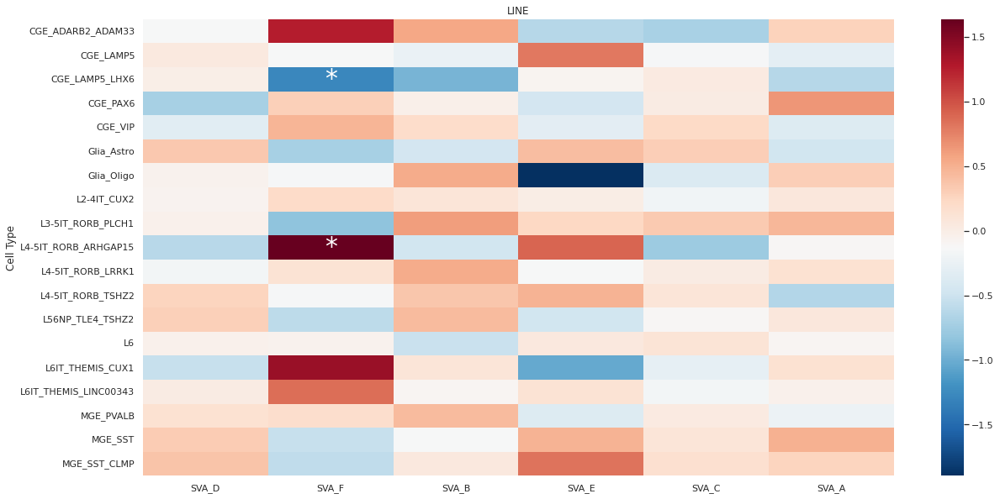

In [537]:
#OLD VS YOUNG
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(sva_lfc*-1, cmap='RdBu_r', ax=ax, xticklabels=sva_df.index.values)
#add * symbol to indicate significance
for i in range(len(sva_lfc)):
    for j in range(len(sva_lfc.columns)):
        if sva_padj.iloc[i,j] < 0.05:
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('LINE')
ax.set_ylabel('Cell Type')
#label x ticks with list of strings
plt.show()

In [538]:
#EFFECT OF SEX
line_lfc, sine_lfc, sva_lfc = heatmat('log2FoldChange', 'sex')
line_padj, sine_padj, sva_padj = heatmat('padj', 'sex')

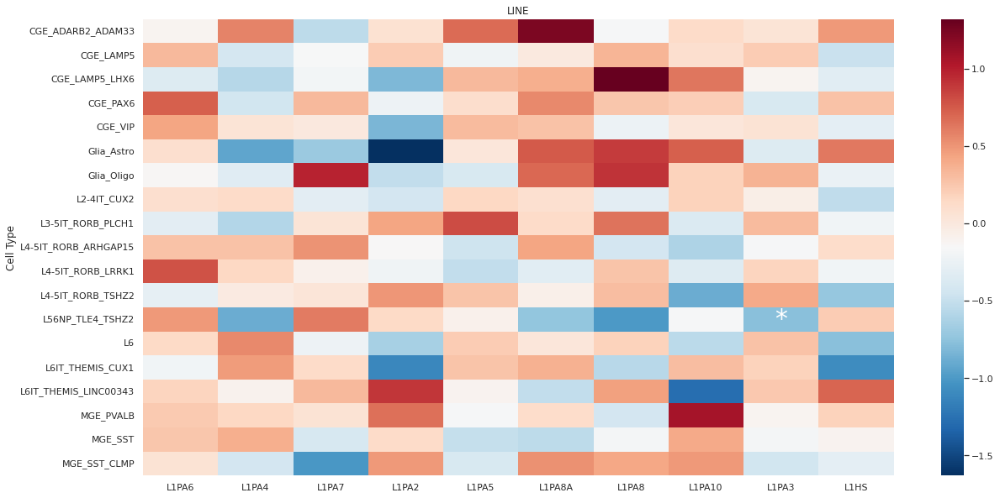

In [539]:
#SEX
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(line_lfc*-1, cmap='RdBu_r', ax=ax, xticklabels=l1_df.index.values)
#add * symbol to indicate significance
for i in range(len(line_lfc)):
    for j in range(len(line_lfc.columns)):
        if line_padj.iloc[i,j] < 0.05:
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('LINE')
ax.set_ylabel('Cell Type')
#label x ticks with list of strings
plt.show()

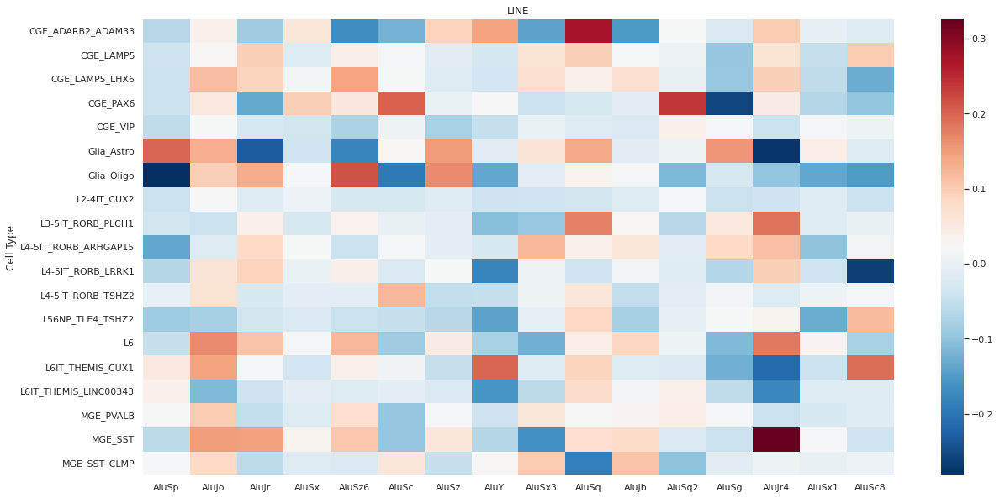

In [540]:
#M VS F
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(sine_lfc*-1, cmap='RdBu_r', ax=ax, xticklabels=alu_df.index.values)
#add * symbol to indicate significance
for i in range(len(sine_lfc)):
    for j in range(len(sine_lfc.columns)):
        if sine_padj.iloc[i,j] < 0.05:
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('LINE')
ax.set_ylabel('Cell Type')
#label x ticks with list of strings
plt.show()

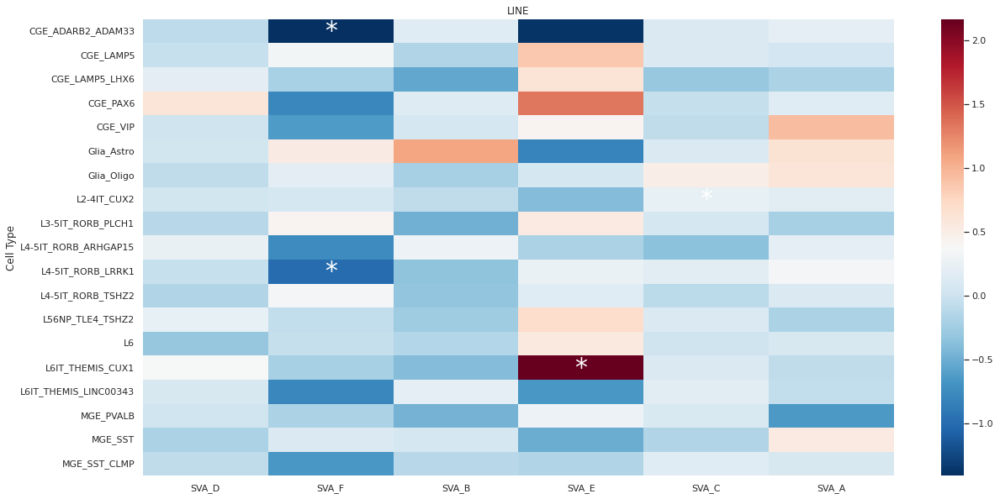

In [541]:
#M VS F
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(sva_lfc*-1, cmap='RdBu_r', ax=ax, xticklabels=sva_df.index.values)
#add * symbol to indicate significance
for i in range(len(sva_lfc)):
    for j in range(len(sva_lfc.columns)):
        if sva_padj.iloc[i,j] < 0.05:
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('LINE')
ax.set_ylabel('Cell Type')
#label x ticks with list of strings
plt.show()

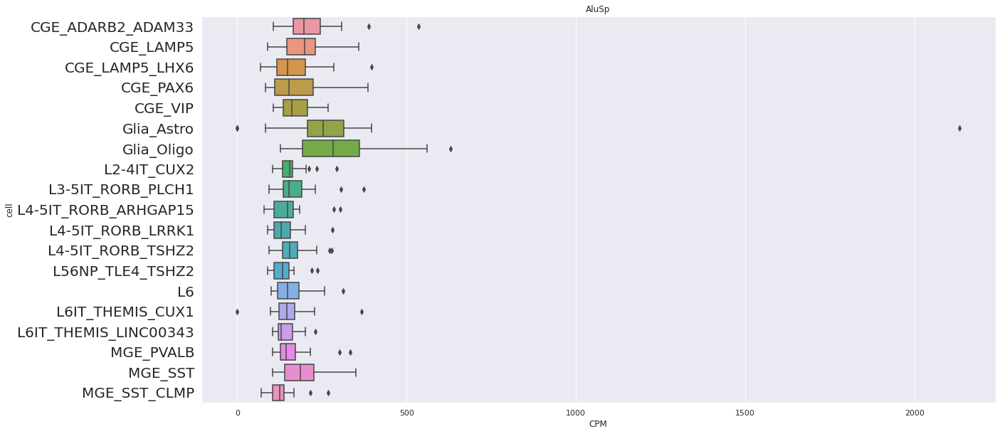

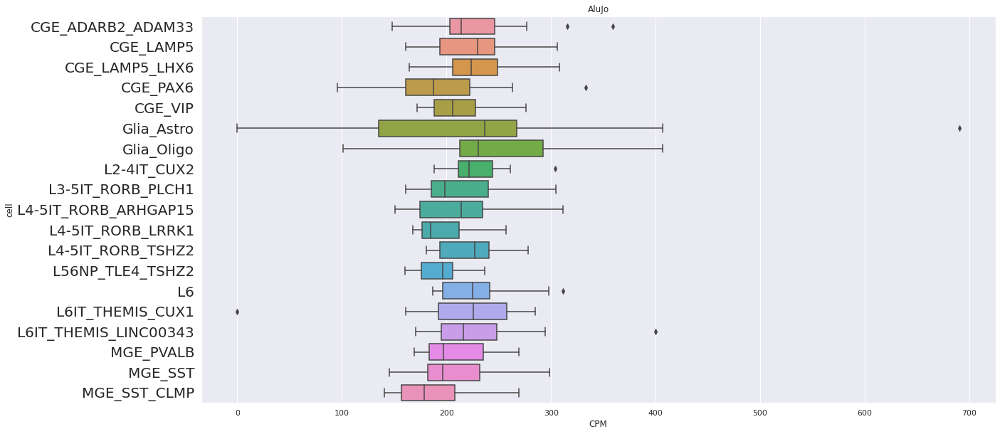

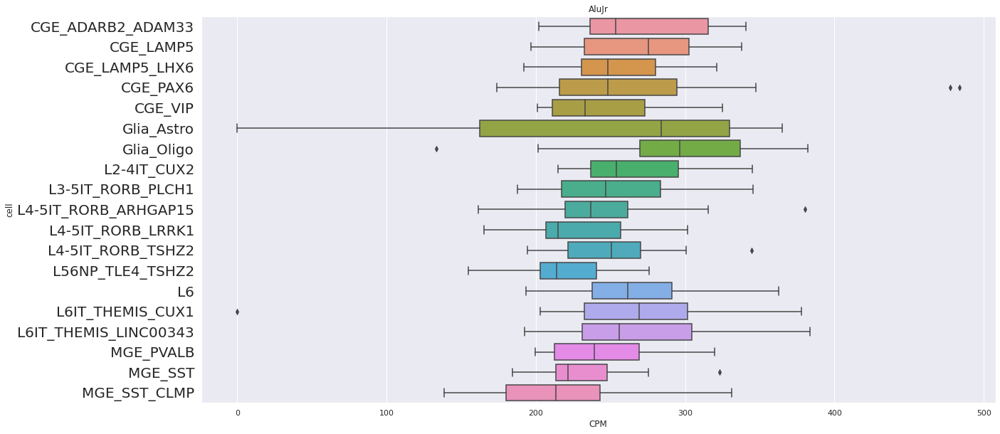

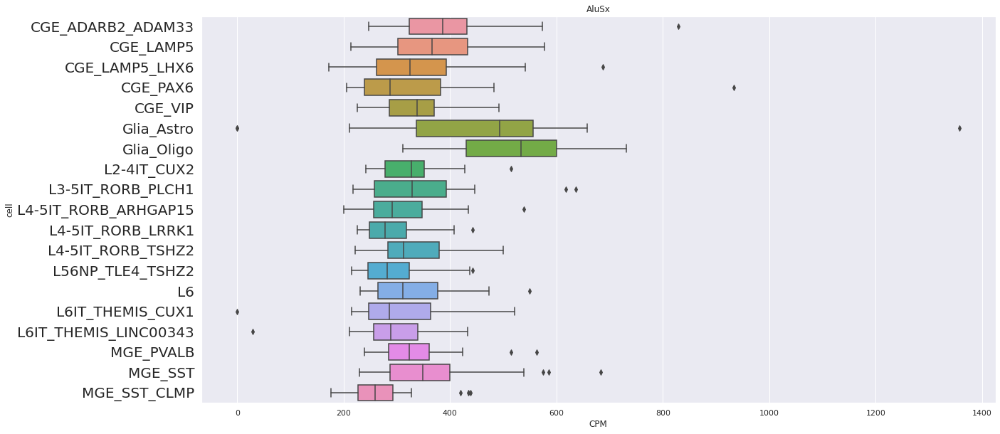

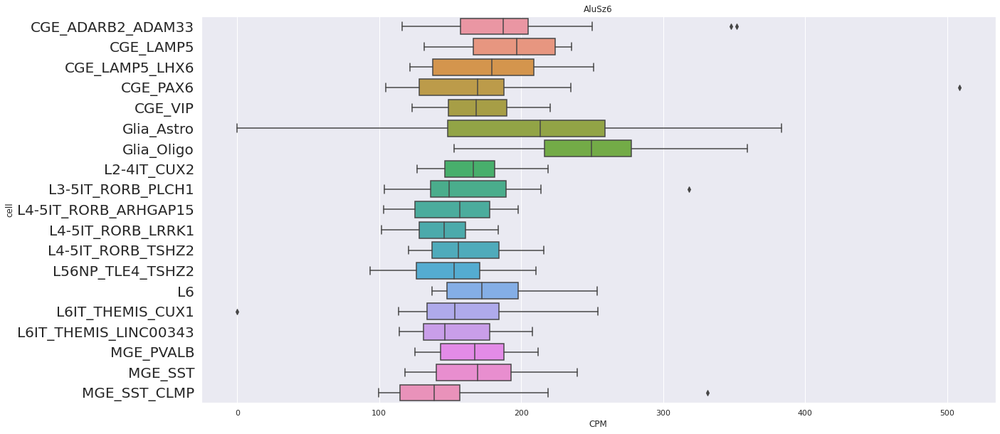

...

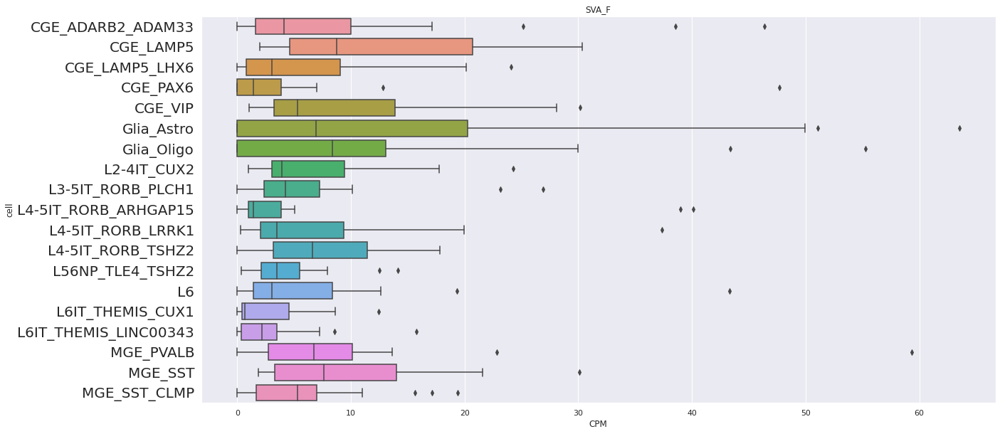

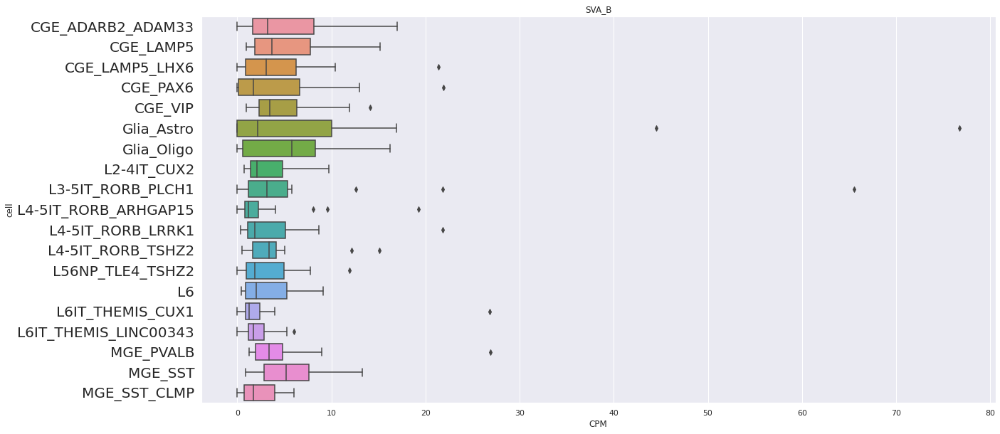

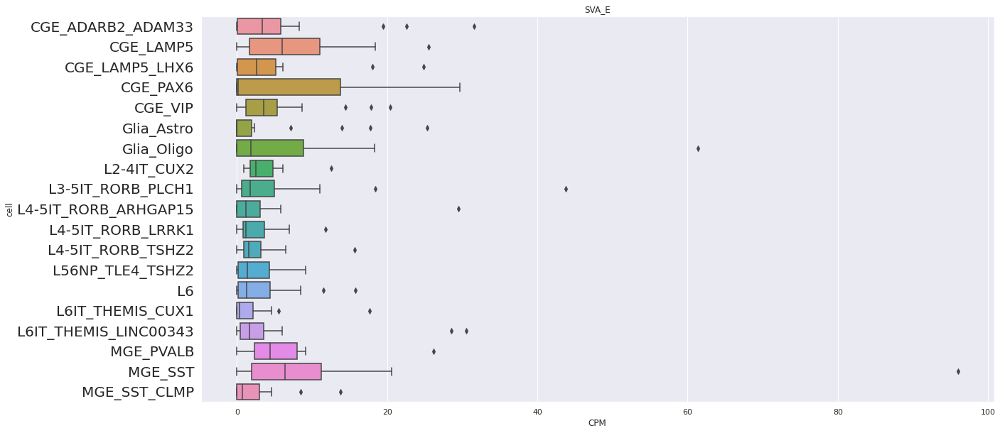

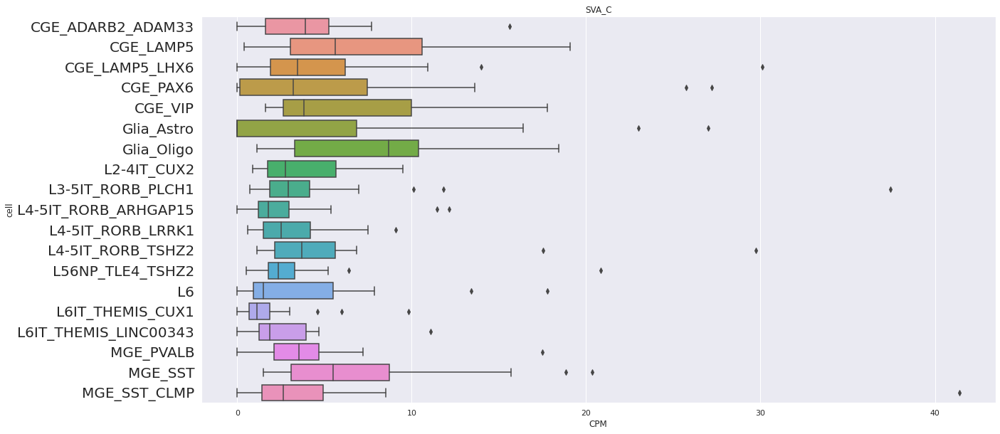

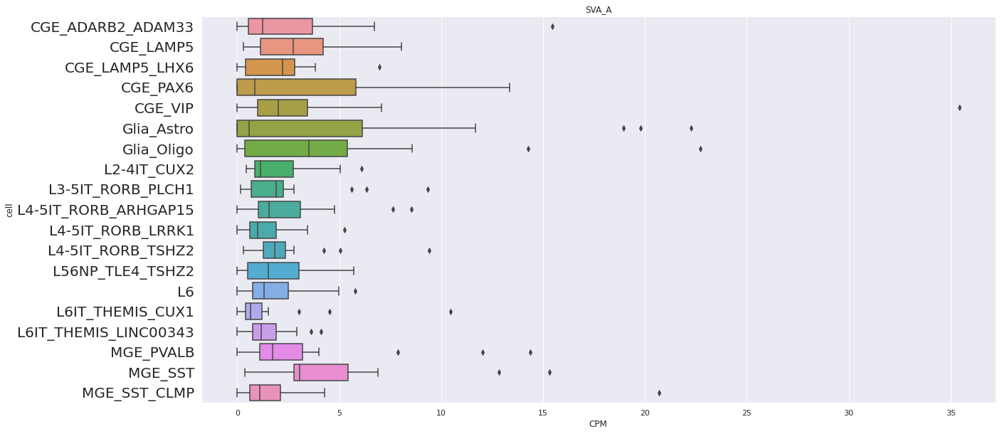

In [542]:
os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/ATEM/pseudobulk/')
te = sub_te
samp_l = dm['sequencing_id'].values

for t in te:
    
    dict = pd.DataFrame()
    all_counts = []
    all_names = []
    for cell in unq_cell:
        fill_v = []
        for s in samp_l:
            os.chdir(glob.glob('*' + s + '_*')[0])
            curr_cell = glob.glob(cell + '.*ATEM*')
            if len(curr_cell) == 0:
                fill_v = np.append(fill_v,0)
            else:
                count_mat = pd.read_csv(curr_cell[0], sep="\t", header=0) 
                count_sum = count_mat.groupby('gene_id').sum() #Sum counts for each element

                if t in count_sum.index:
                    fill_v = np.append(fill_v,count_sum.loc[t]['CPM'])

                else:
                    fill_v = np.append(fill_v,0)

            os.chdir('..')
        all_names = np.append(all_names,np.full(len(fill_v), cell))
        all_counts = np.append(all_counts, fill_v)

    dict['cell'] = all_names
    dict['CPM'] = all_counts

    fig,ax = plt.subplots(figsize=(20,10))
    sns.boxplot(data=dict, y = 'cell', x='CPM')
    plt.title(t)
    plt.yticks(fontsize=20)
    plt.show()

In [47]:
#Find all unique cell types
cell_l = []
os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/ATEM/pseudobulk/')
samp_l = glob.glob('*CZI*')
for s in samp_l:
    os.chdir(s)
    cell_l = np.append(cell_l,[glob.glob('*ATEM*')[i].split('.')[0] for i in range(len(glob.glob('*ATEM*')))])
    os.chdir('..')
unq_cell = np.unique(cell_l)
unq_cell


array(['CGE_ADARB2_ADAM33', 'CGE_LAMP5', 'CGE_LAMP5_LHX6', 'CGE_PAX6',
       'CGE_VIP', 'Glia_Astro', 'Glia_Oligo', 'L2-4IT_CUX2',
       'L3-5IT_RORB_PLCH1', 'L4-5IT_RORB_ARHGAP15', 'L4-5IT_RORB_LRRK1',
       'L4-5IT_RORB_TSHZ2', 'L56NP_TLE4_TSHZ2', 'L6', 'L6IT_THEMIS_CUX1',
       'L6IT_THEMIS_LINC00343', 'MGE_PVALB', 'MGE_SST', 'MGE_SST_CLMP'],
      dtype='<U32')

In [48]:
#Make gene x sample matrix for each cell type for DESEQ
os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/ATEM/pseudobulk/')
samp_l = dm['sequencing_id'].values

for cell in unq_cell:
    te = ev_df['element'].values
    dict = {'element':te}
    for s in samp_l:
        os.chdir(glob.glob('*' + s + '_*')[0])
        curr_cell = glob.glob(cell + '.*ATEM*')
        if len(curr_cell)!=0:
            te_v = ter.load_ATEM_family(curr_cell[0], te, 'Count')

        else:
            te_v = np.zeros(len(te))

        assert len(te) == len(te_v), 'Error: Not all TE elements were counted'
        #Add to dict
        dict[s] = te_v

        #if len(curr_cell) == 0:
        os.chdir('..')
    df = pd.DataFrame(dict)
    #set first column to index
    df.set_index('element', inplace=True)
    df = df.astype(int)
    df+=1
    df = df.loc[ind]
    df.to_csv('/cndd3/dburrows/DATA/te/rna/CZI.counts/DESEQ/' + cell + '.ATEM.csv')


In [72]:
df[:7].values

array([[16,  5,  8, 16, 13, 12, 11,  8,  6,  4,  2,  1,  2,  3,  5,  2,
         5, 10],
       [14,  9,  7, 12,  8,  2,  1,  8,  2,  2,  4,  1,  8,  5,  2,  9,
         1,  5],
       [ 5,  1,  2,  1,  1,  5,  1,  7,  1,  1,  1,  1,  1,  3,  1,  2,
         1,  1],
       [ 3,  2,  4,  2,  4,  1,  7,  1,  4,  9,  5,  1,  1,  1,  6,  1,
         6,  1],
       [10,  5,  3, 15,  1,  2,  1,  1,  1,  2,  1,  1,  3,  1,  1,  9,
         3,  5],
       [13, 10, 15, 22,  3,  5,  5, 34,  6,  5,  9,  1,  1,  1,  5,  3,
         3,  7],
       [ 3,  4,  3,  6,  2,  6,  1,  2,  2,  2,  1,  1,  1,  2,  1,  2,
         1,  5]])

In [ ]:
pd.read_csv( + '.DESEQ_' + factor + '.csv')

In [452]:
#put all LFC and padj into a dataframe for cells x TEs 
def heatmat(string, factor):
    os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/DESEQ/')

    heat_line, heat_sine = pd.DataFrame(), pd.DataFrame()
    for cell in unq_cell:
        df = pd.read_csv(cell + '.DESEQ_' + factor + '.csv')
        LINE_df = df[:7].values
        SINE_df = df[7:]
        heat_line[cell] = LINE_df[string].values
        heat_sine[cell] = SINE_df[string].values

    heat_line.index =df.index[:7].values
    #heat_line = heat_line.reindex(index=sort_name_line)
    heat_line = heat_line.T
    heat_sine.index = df.index[7:].values

    #heat_sine = heat_sine.reindex(index=sort_name_sine)
    heat_sine = heat_sine.T
    return heat_line, heat_sine

In [457]:
os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/DESEQ/')

heat_line, heat_sine = pd.DataFrame(), pd.DataFrame()
for cell in unq_cell:
    df = pd.read_csv(cell + '_Count.DESEQ_' + factor + '.csv')
    LINE_df = df[:7].values
    SINE_df = df[7:]
    heat_line[cell] = LINE_df[string].values
    heat_sine[cell] = SINE_df[string].values

FileNotFoundError: [Errno 2] No such file or directory: 'CGE_ADARB2_ADAM33_Count.DESEQ_log2FoldChange.csv'

In [459]:
cell = unq_cell[0]
factor = 'age'
df = pd.read_csv(cell + '_Count.DESEQ_' + factor + '.csv')

In [460]:
df

,Unnamed: 0,baseMean,log2FoldChange,lfcSE,stat,pvalue,padj
0,L1PA6,4.825009,-0.328236,0.625809,-0.524499,0.599931,0.870455
1,L1PA4,6.345500,-0.186423,0.468320,-0.398068,0.690580,0.870455
2,L1PA7,3.912746,-1.376366,0.567387,-2.425796,0.015275,0.115871
3,L1PA2,2.415656,-0.822084,0.774079,-1.062015,0.288229,0.576458
4,L1PA5,5.220790,0.230990,0.574213,0.402271,0.687484,0.870455
5,L1PA8A,2.432066,0.304643,0.789165,0.386032,0.699473,0.870455
6,L1PA8,1.876670,-0.813696,0.884095,-0.920372,0.357378,0.650412
7,L1PA10,1.823260,-1.320241,0.895396,-1.474477,0.140353,0.413673
8,L1PA3,7.123848,-0.120334,0.477199,-0.252168,0.800911,0.900757
9,L1HS,2.096810,-1.309097,0.867562,-1.508938,0.131315,0.413673


In [453]:
#EFFECT OF AGE
line_lfc, sine_lfc = heatmat('log2FoldChange', 'age')
line_padj, sine_padj = heatmat('padj', 'age')


FileNotFoundError: [Errno 2] No such file or directory: 'CGE_ADARB2_ADAM33.DESEQ_age.csv'

yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes
yes


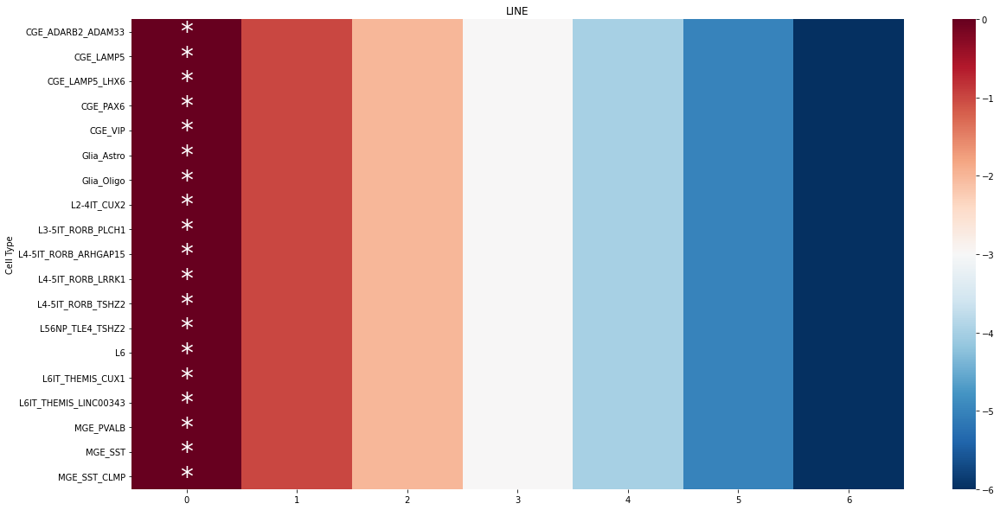

In [70]:
#OLD VS YOUNG
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(line_lfc*-1, cmap='RdBu_r', ax=ax)
#add * symbol to indicate significance
for i in range(len(line_lfc)):
    for j in range(len(line_lfc.columns)):
        if line_padj.iloc[i,j] < 0.05:
            print('yes')
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('LINE')
ax.set_ylabel('Cell Type')
plt.show()


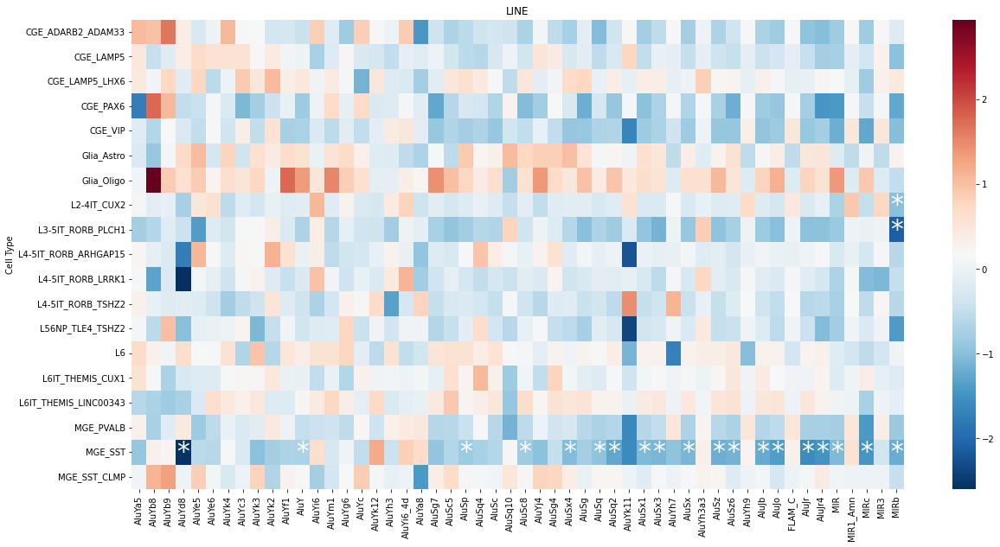

In [343]:
#OLD VS YOUNG
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(sine_lfc*-1, cmap='RdBu_r', ax=ax)
#add * symbol to indicate significance
for i in range(len(sine_lfc)):
    for j in range(len(sine_lfc.columns)):
        if sine_padj.iloc[i,j] < 0.05:
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('LINE')
ax.set_ylabel('Cell Type')
plt.show()


In [344]:
#EFFECT OF SEX
line_lfc, sine_lfc = heatmat('log2FoldChange', 'sex')
line_padj, sine_padj = heatmat('padj', 'sex')


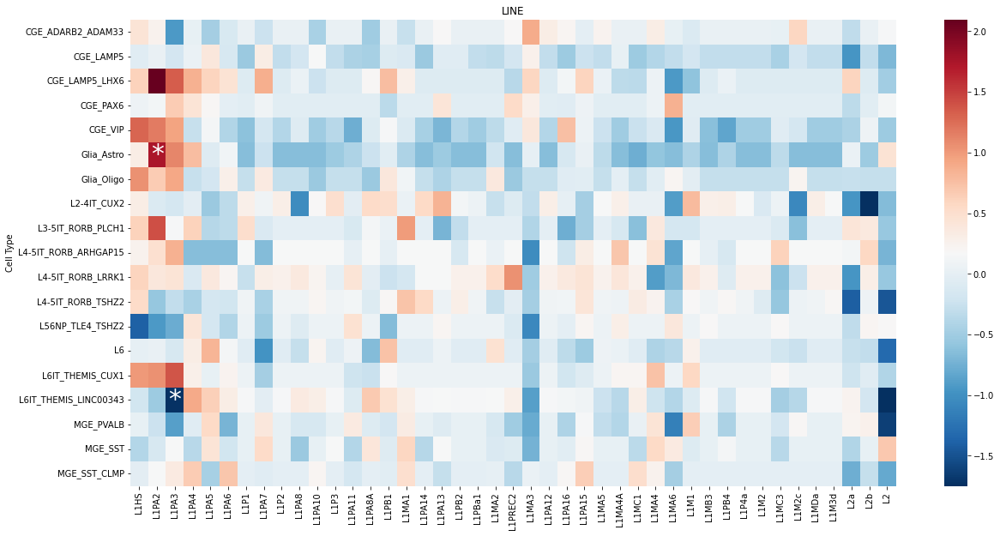

In [346]:
#MALE VS FEMALE
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(line_lfc, cmap='RdBu_r', ax=ax)
#add * symbol to indicate significance
for i in range(len(line_lfc)):
    for j in range(len(line_lfc.columns)):
        if line_padj.iloc[i,j] < 0.05:
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('LINE')
ax.set_ylabel('Cell Type')
plt.show()


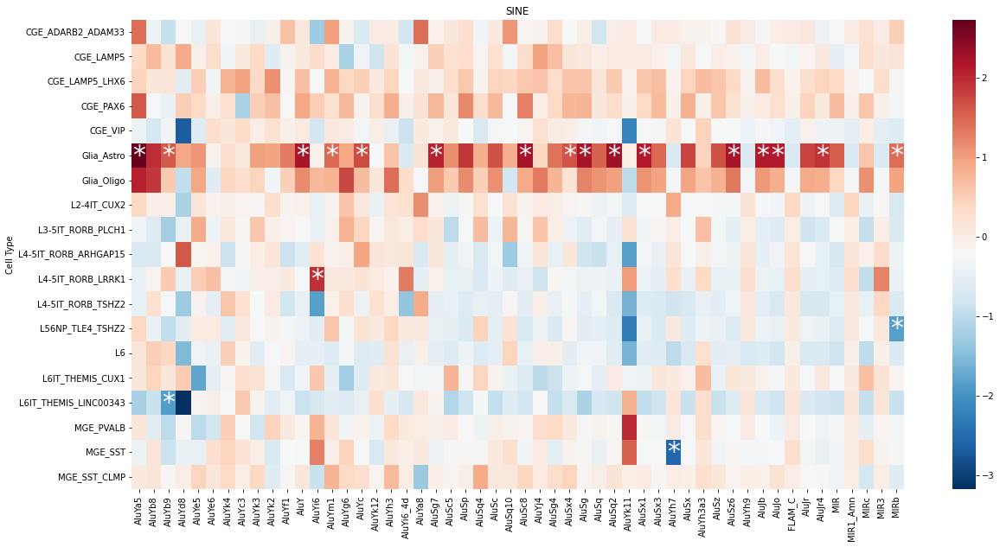

In [348]:
#MALE VS FEMALE
#make a heatmap of heat_line
import seaborn as sns
fig, ax = plt.subplots(figsize=(20,10))
sns.heatmap(sine_lfc, cmap='RdBu_r', ax=ax)
#add * symbol to indicate significance
for i in range(len(sine_lfc)):
    for j in range(len(sine_lfc.columns)):
        if sine_padj.iloc[i,j] < 0.05:
            ax.text(j+0.5, i+0.5, '*', ha='center', va='center', color='white', fontsize=30)
ax.set_title('SINE')
ax.set_ylabel('Cell Type')
plt.show()


In [382]:
t = te[0]

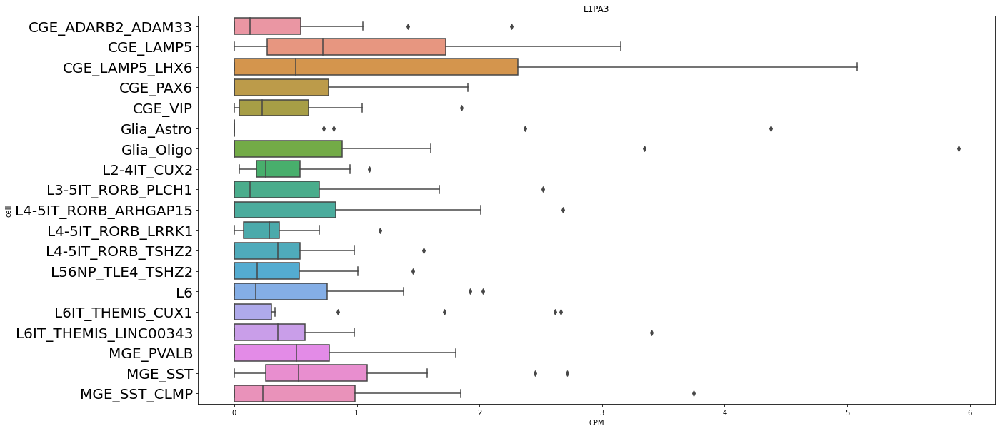

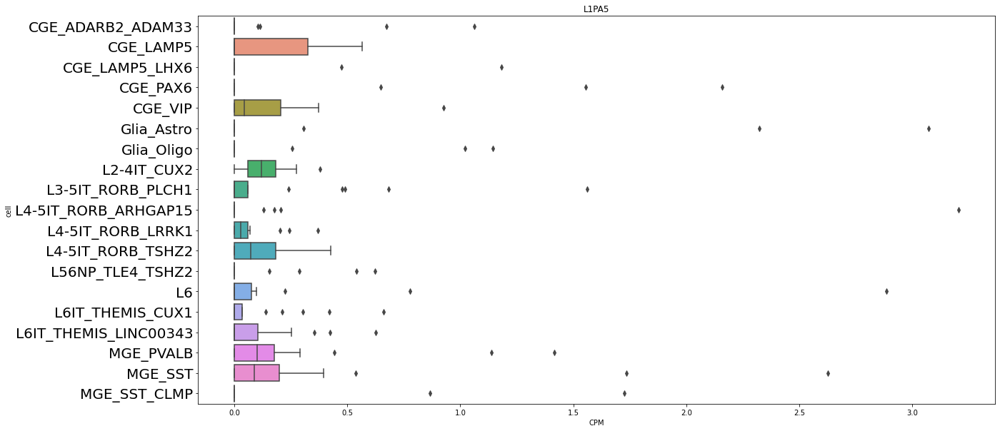

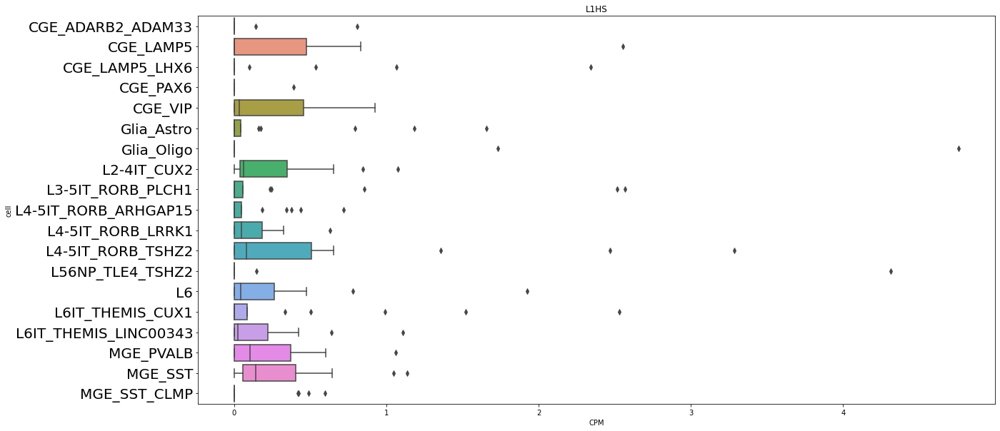

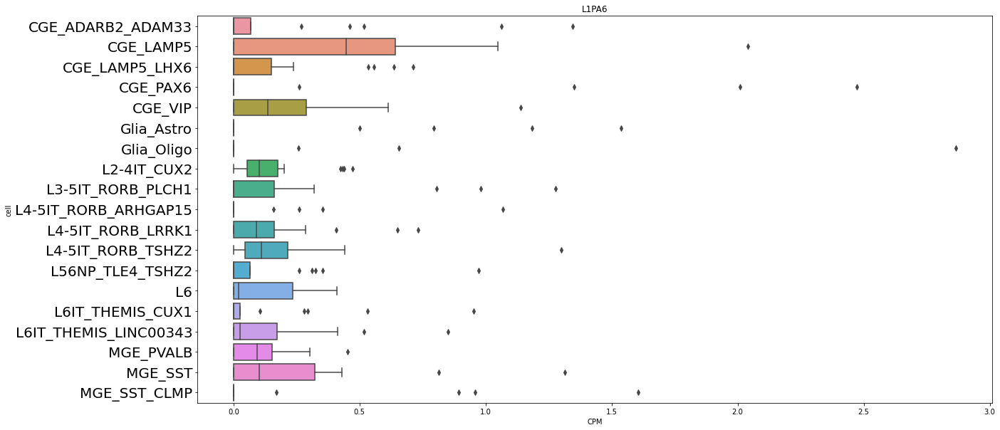

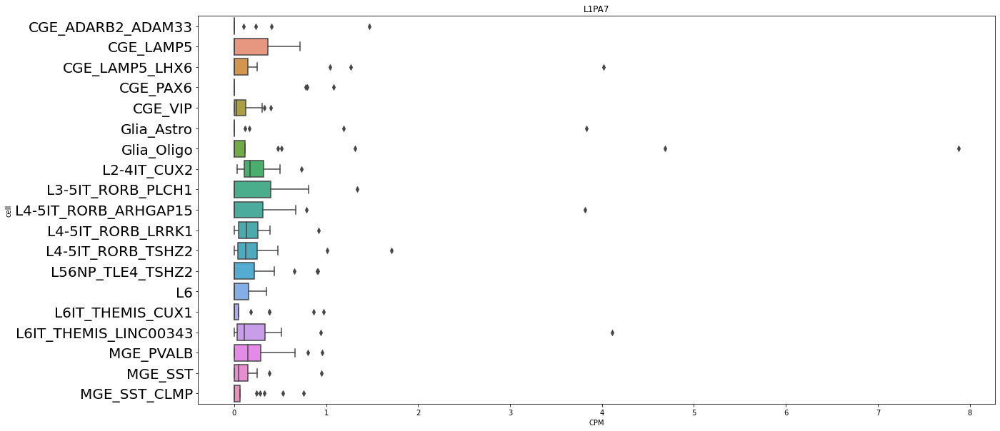

...

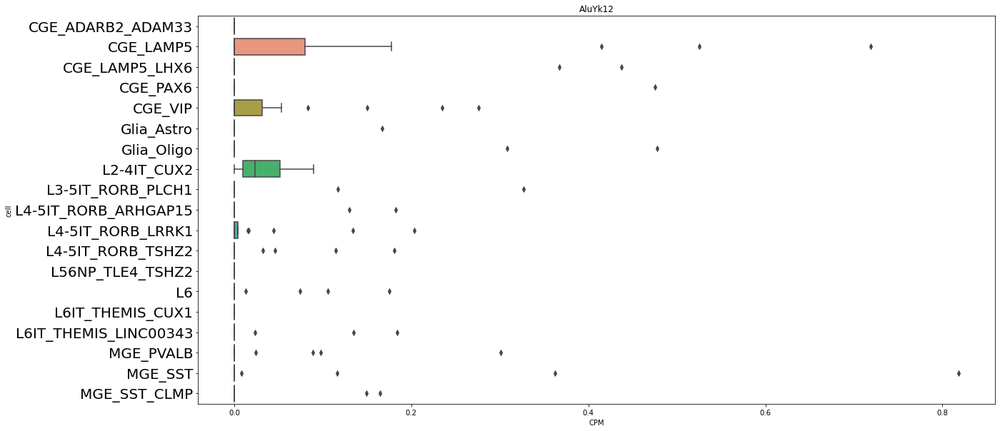

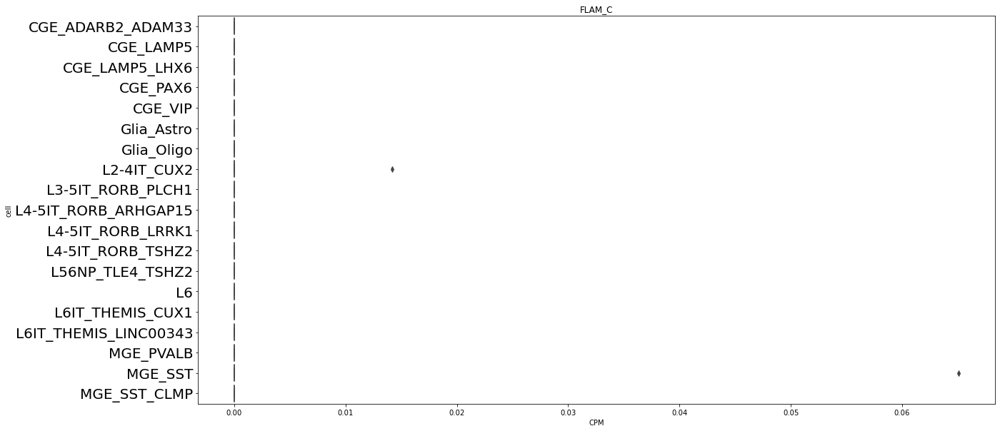

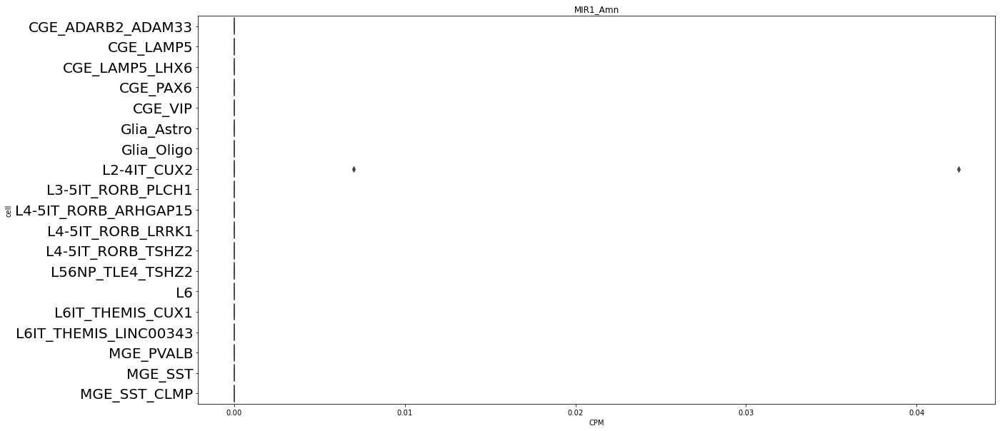

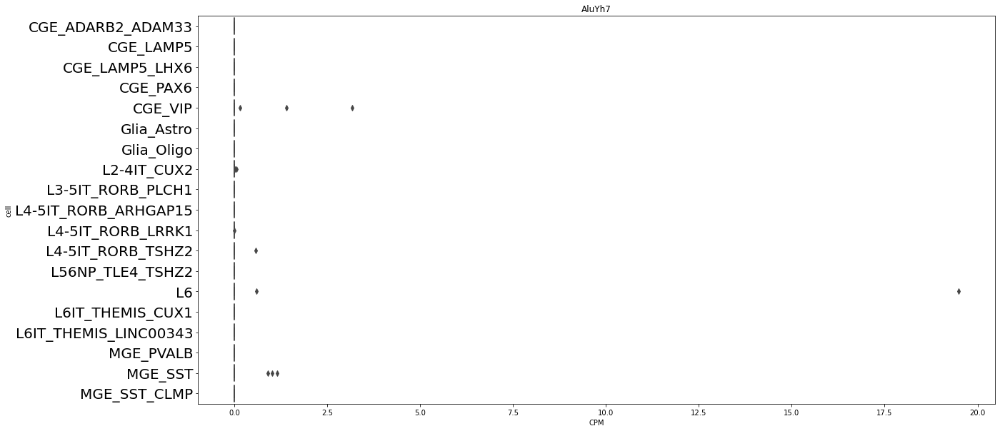

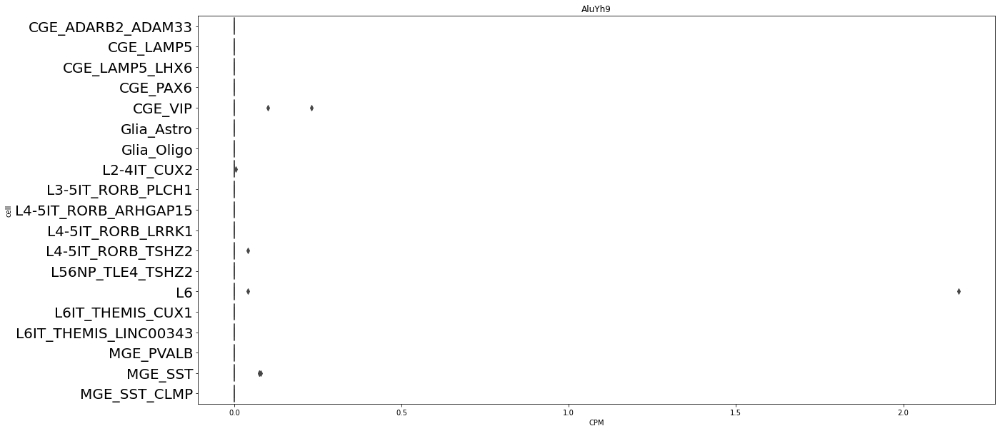

In [481]:
#Compare cell types

#loop over TE and do comparison
os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/ATEM/pseudobulk/')
te = ev_df['element'].values
samp_l = dm['sequencing_id'].values

for t in te:
    
    dict = pd.DataFrame()
    all_counts = []
    all_names = []
    for cell in unq_cell:
        fill_v = []
        for s in samp_l:
            os.chdir(glob.glob('*' + s + '_*')[0])
            curr_cell = glob.glob(cell + '.*ATEM*')
            if len(curr_cell) == 0:
                fill_v = np.append(fill_v,0)
            else:
                count_mat = pd.read_csv(curr_cell[0], sep="\t", header=0) 
                count_sum = count_mat.groupby('gene_id').sum() #Sum counts for each element

                if t in count_sum.index:
                    fill_v = np.append(fill_v,count_sum.loc[t]['CPM'])

                else:
                    fill_v = np.append(fill_v,0)

            os.chdir('..')
        all_names = np.append(all_names,np.full(len(fill_v), cell))
        all_counts = np.append(all_counts, fill_v)

    dict['cell'] = all_names
    dict['CPM'] = all_counts

    fig,ax = plt.subplots(figsize=(20,10))
    sns.boxplot(data=dict, y = 'cell', x='CPM')
    plt.title(t)
    plt.yticks(fontsize=20)
    plt.show()

In [384]:
cell = unq_cell[0]
s = samp_l[0]
cell, t, s

('CGE_ADARB2_ADAM33', 'L1PA3', 'CZI2')

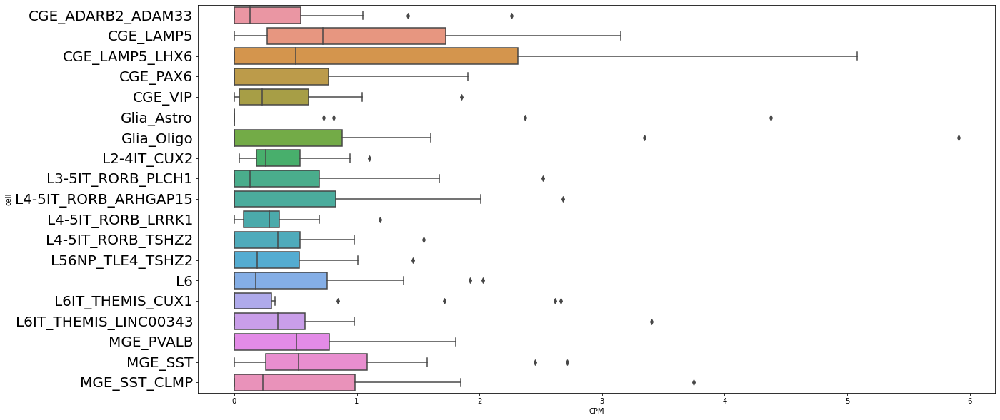

In [480]:
dict = pd.DataFrame()
all_counts = []
all_names = []
for cell in unq_cell:
    fill_v = []
    for s in samp_l:
        os.chdir(glob.glob('*' + s + '_*')[0])
        curr_cell = glob.glob(cell + '.*ATEM*')
        if len(curr_cell) == 0:
            fill_v = np.append(fill_v,0)
        else:
            count_mat = pd.read_csv(curr_cell[0], sep="\t", header=0) 
            count_sum = count_mat.groupby('gene_id').sum() #Sum counts for each element

            if t in count_sum.index:
                fill_v = np.append(fill_v,count_sum.loc[t]['CPM'])

            else:
                fill_v = np.append(fill_v,0)

        os.chdir('..')
    all_names = np.append(all_names,np.full(len(fill_v), cell))
    all_counts = np.append(all_counts, fill_v)

dict['cell'] = all_names
dict['CPM'] = all_counts

fig,ax = plt.subplots(figsize=(20,10))
sns.boxplot(data=dict, y = 'cell', x='CPM')
plt.yticks(fontsize=20)
plt.show()

In [474]:
type(dict['counts'][0])

numpy.float64

<AxesSubplot:xlabel='cell', ylabel='counts'>

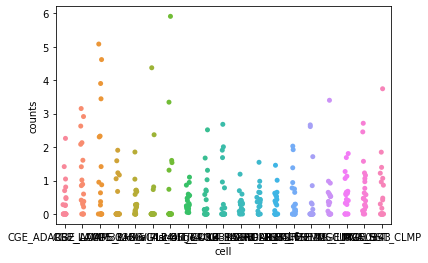

In [475]:
#plot stripplot of cells against samples
import seaborn as sns
sns.stripplot(data=dict, x = 'cell', y='counts')

<AxesSubplot:xlabel='day', ylabel='total_bill'>

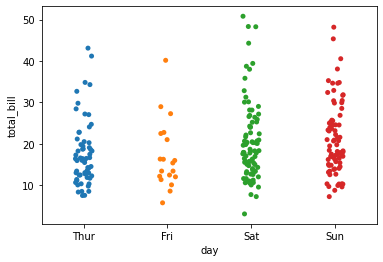

In [452]:
sns.stripplot(data=tips, x="day",y="total_bill")


In [462]:
#plot stripplot of cells against samples
import seaborn as sns
sns.stripplot(do, x = do['cell'].values, y=do['CPM'].values)

/home/dburrows/anaconda3/lib/python3.9/site-packages/seaborn/_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().

In [402]:
fill_v

array([0.])

In [390]:
count_sum = count_mat.groupby('gene_id').sum() #Sum counts for each element
count_sum

,Start,End,Count,CPM
gene_id,,,,
AluJb,550107699,550107959,13.0,32.900981
AluJo,1697232905,1697233285,19.0,48.086049
AluJr,1801648439,1801648899,23.0,58.209427
AluSc,344421195,344421275,4.0,10.123379
AluSc8,592528112,592528212,5.0,12.654223
AluSg,463632697,463632797,5.0,12.654223
AluSg7,73046944,73046964,1.0,2.530845
AluSp,179004492,179004572,4.0,10.123379
AluSq,51146291,51146371,4.0,10.123379


In [ ]:
for cell in unq_cell:
    for s in samp_l:
        os.chdir(glob.glob('*' + s + '_*')[0])
        if len(curr_cell)>0:
            curr_cell = glob.glob(cell + '.*ATEM*')
            count_mat = pd.read_csv(curr_cell[0], sep="\t", header=0) 
        os.chdir('..')


In [ ]:

count_mat = pd.read_csv(ATEM_path, sep="\t", header=0) 
count_sum = count_mat.groupby('gene_id').sum() #Sum counts for each element

#Calculate summed CPMs for each element
cpm_v =[]
for i in range(len(te)):
    if sum(te[i] == count_sum.index) > 0: cpm_v.append(count_sum[te[i] == count_sum.index]['Count'].values[0])
    else: cpm_v.append(0)
return cpm_v


In [370]:
os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/ATEM/pseudobulk/')
samp_l = dm['sequencing_id'].values

for cell in unq_cell:
    te = ev_df['element'].values
    dict = {'element':te}
    for s in samp_l:
        os.chdir(glob.glob('*' + s + '_*')[0])
        if len(curr_cell)>0:
            curr_cell = glob.glob(cell + '.*ATEM*')
            count_mat = pd.read_csv(curr_cell[0], sep="\t", header=0) 
        os.chdir('..')


In [ ]:
#Load ATEM counts table
count_mat = pd.read_csv(ATEM_path, sep="\t", header=0) 
count_sum = count_mat.groupby('gene_id').sum() #Sum counts for each element

In [380]:
count_sum

,Start,End,Count,CPM
gene_id,,,,
AluJb,74534579,74534599,1.0,3.377648
AluJo,33868311,33868331,1.0,3.377648
AluJr,71425526,71425566,2.0,6.755296
AluSc,373297811,373297911,5.0,16.888240
AluSc5,10533050,10533090,2.0,6.755296
AluSc8,48893010,48893050,2.0,6.755296
AluSg,130992384,130992444,3.0,10.132944
AluSg4,110356176,110356196,1.0,3.377648
AluSp,436712042,436712122,2.0,6.755296


In [381]:
count_sum = count_mat.groupby('gene_id').sum() #Sum counts for each element
count_sum.loc['L1MC1']

Start    3.208014e+08
End      3.208014e+08
Count    2.000000e+00
CPM      6.755296e+00
Name: L1MC1, dtype: float64

In [ ]:
t = 

In [ ]:
#Make gene x sample matrix for each cell type for DESEQ
os.chdir('/cndd3/dburrows/DATA/te/rna/CZI.counts/ATEM/pseudobulk/')
samp_l = dm['sequencing_id'].values

for cell in unq_cell:
    te = ev_df['element'].values
    dict = {'element':te}
    for s in samp_l:
        os.chdir(glob.glob('*' + s + '_*')[0])
        curr_cell = glob.glob(cell + '.*ATEM*')
        if len(curr_cell)!=0:
            te_v = ter.load_ATEM_family(curr_cell[0], te)

        else:
            te_v = np.zeros(len(te))

        assert len(te) == len(te_v), 'Error: Not all TE elements were counted'
        #Add to dict
        dict[s] = te_v

        #if len(curr_cell) == 0:
        os.chdir('..')
    df = pd.DataFrame(dict)
    #set first column to index
    df.set_index('element', inplace=True)
    df = df.astype(int)
    df+=1
    df.to_csv('/cndd3/dburrows/DATA/te/rna/CZI.counts/DESEQ/' + cell + '.ATEM.csv')
